In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer


In [2]:
df = pd.read_csv('KNNAlgorithmDataset.csv')

In [3]:
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [4]:
df.shape

(569, 33)

In [5]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [6]:
df.duplicated().sum()

0

In [7]:
df.drop(columns=['Unnamed: 32','id'],inplace=True)

In [8]:
df.shape

(569, 31)

In [9]:
df['diagnosis'].value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [11]:
X = df.drop(columns='diagnosis')
y = df['diagnosis']

radius_mean: Skewness = 0.94 (Positive Skewness)


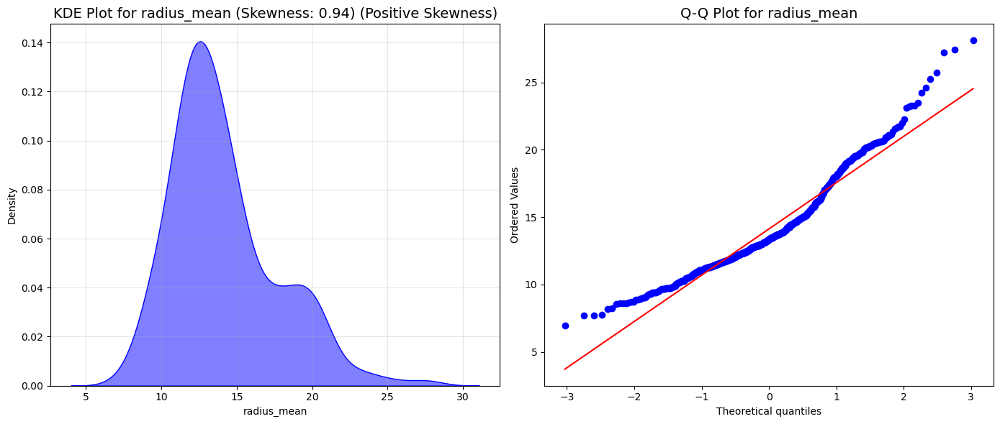

texture_mean: Skewness = 0.65 (Positive Skewness)


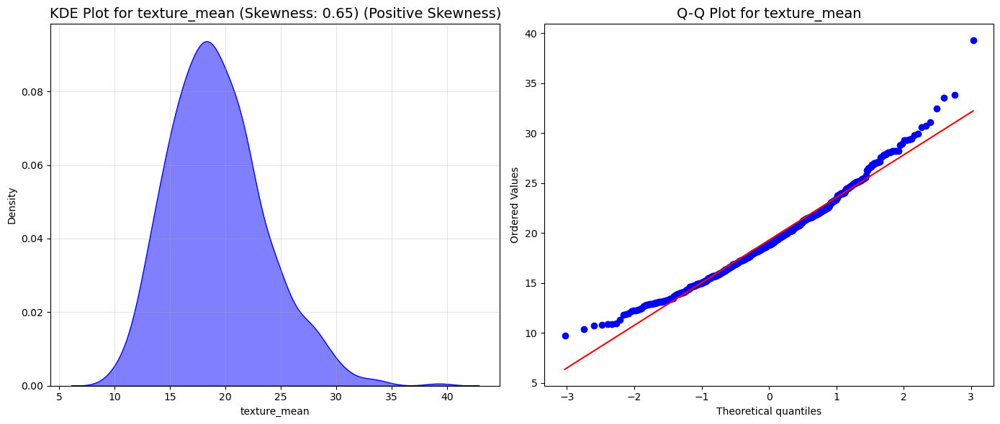

perimeter_mean: Skewness = 0.99 (Positive Skewness)


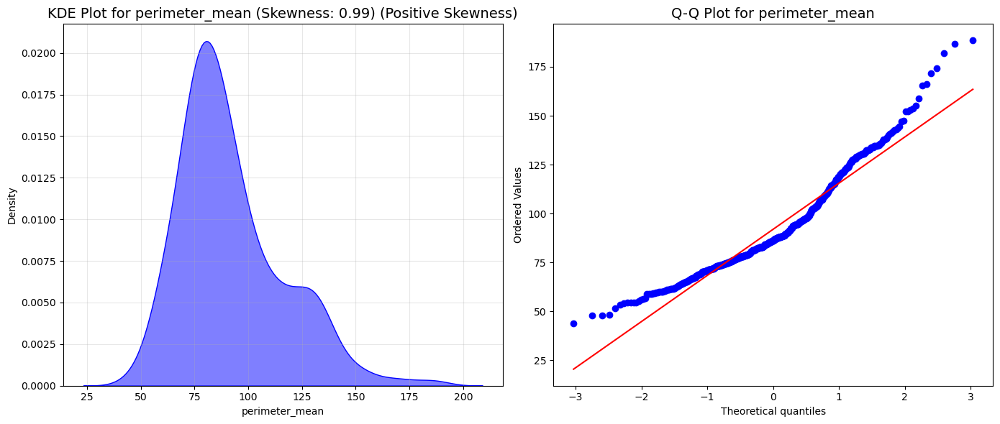

area_mean: Skewness = 1.65 (Positive Skewness)


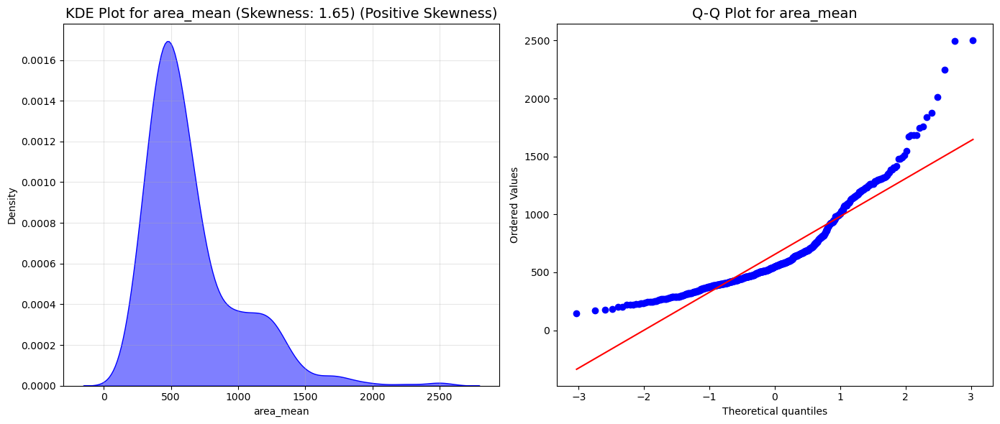

smoothness_mean: Skewness = 0.46 (Positive Skewness)


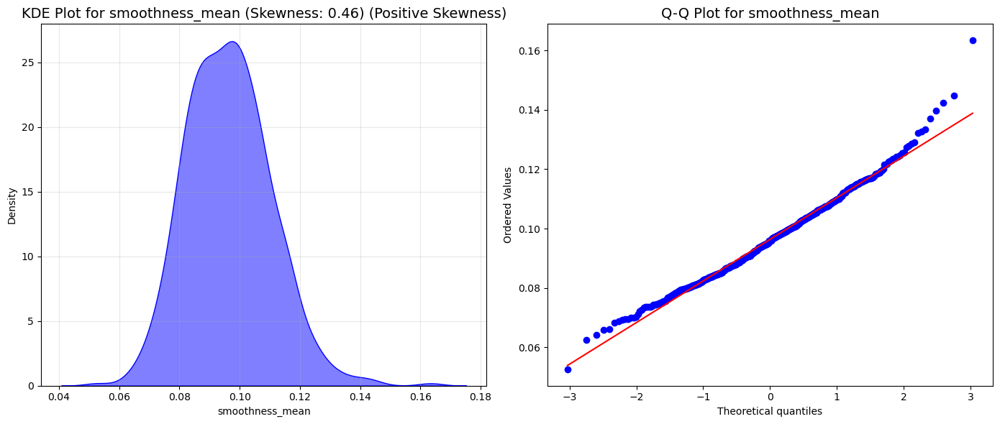

compactness_mean: Skewness = 1.19 (Positive Skewness)


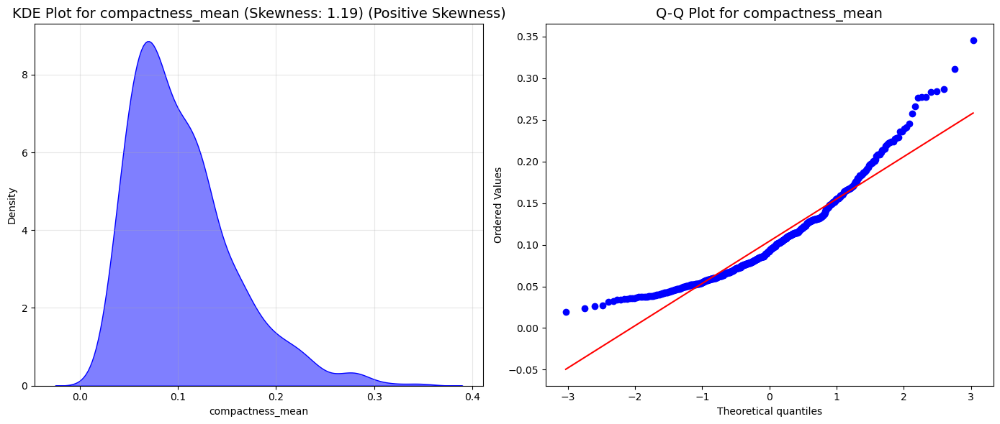

concavity_mean: Skewness = 1.40 (Positive Skewness)


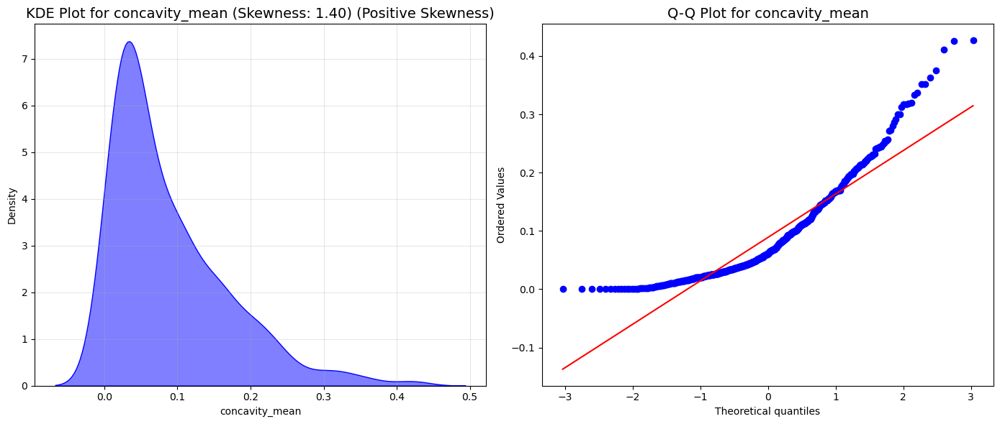

concave points_mean: Skewness = 1.17 (Positive Skewness)


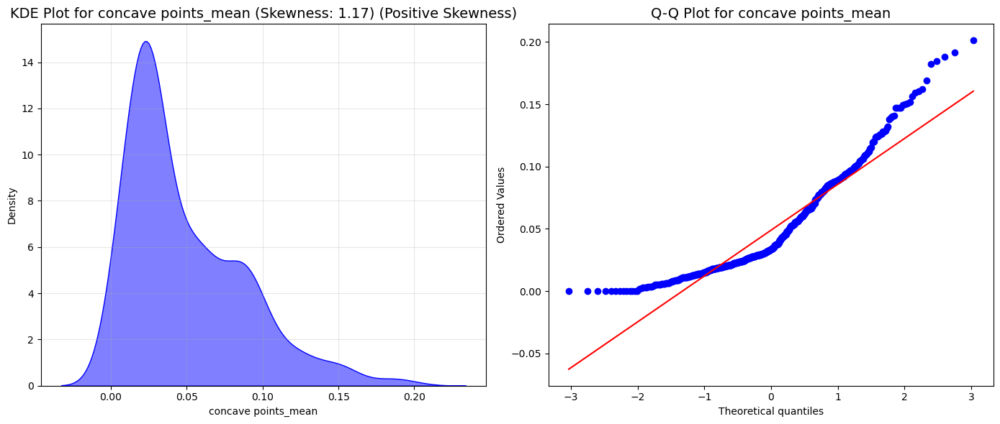

symmetry_mean: Skewness = 0.73 (Positive Skewness)


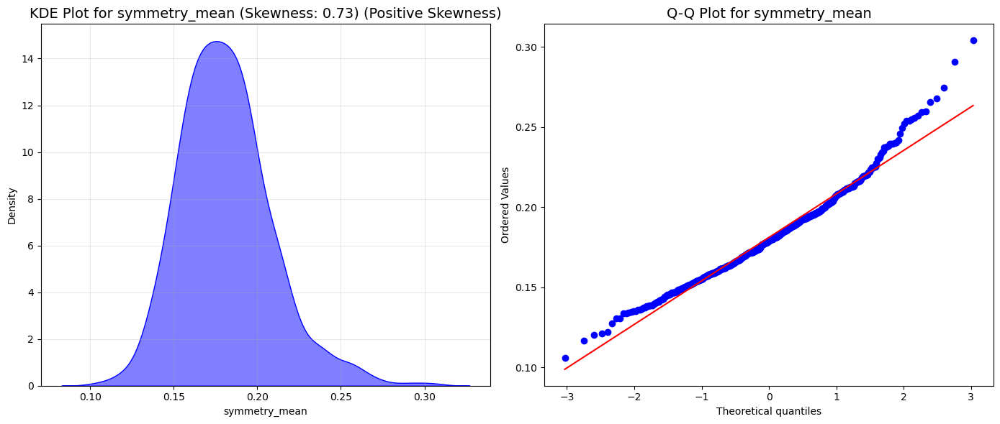

fractal_dimension_mean: Skewness = 1.30 (Positive Skewness)


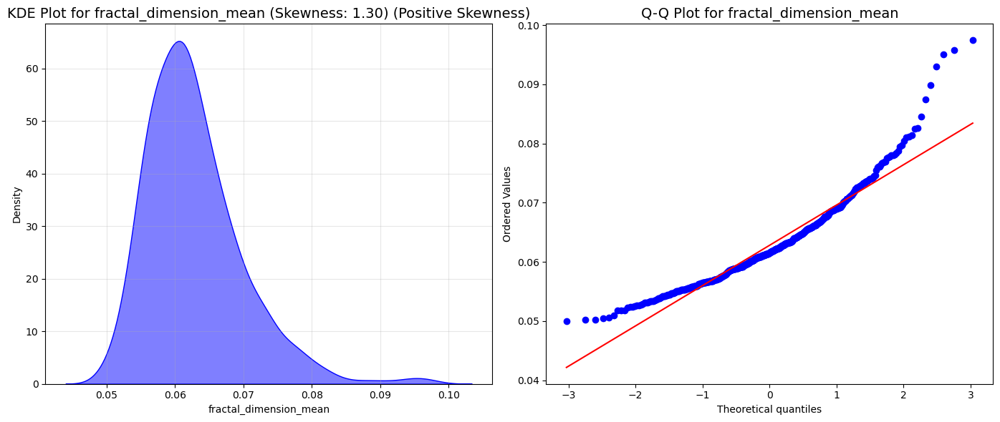

radius_se: Skewness = 3.09 (Positive Skewness)


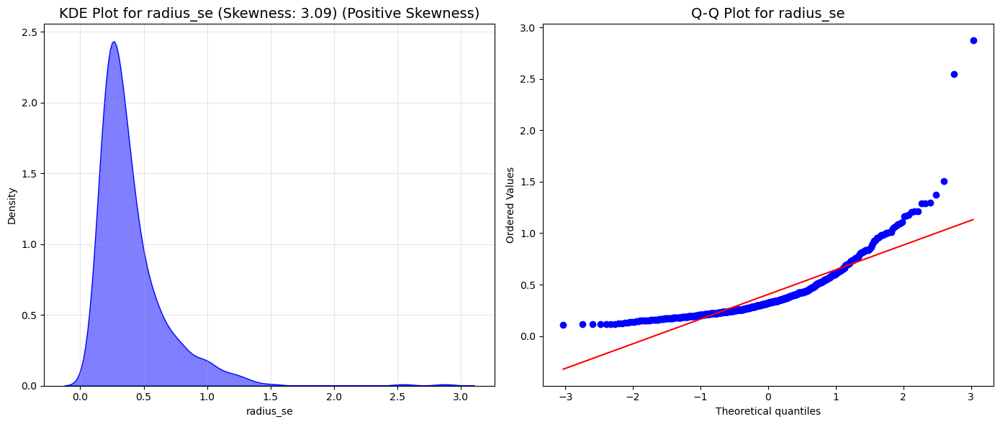

texture_se: Skewness = 1.65 (Positive Skewness)


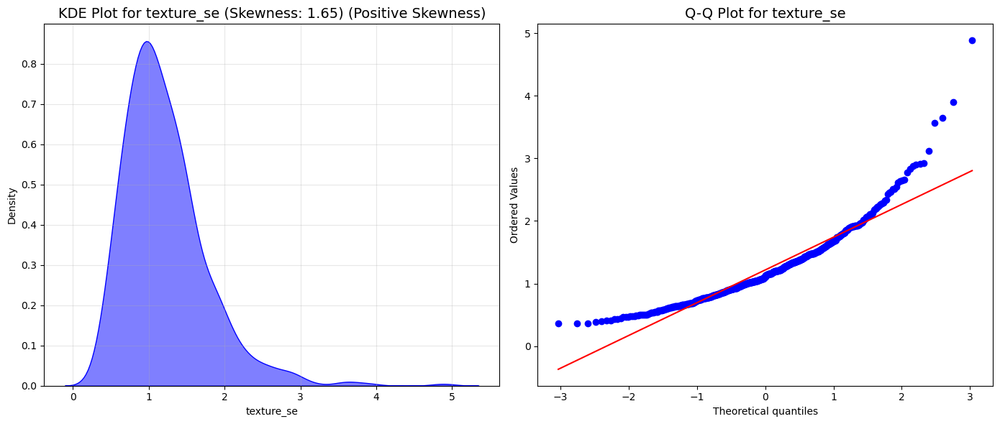

perimeter_se: Skewness = 3.44 (Positive Skewness)


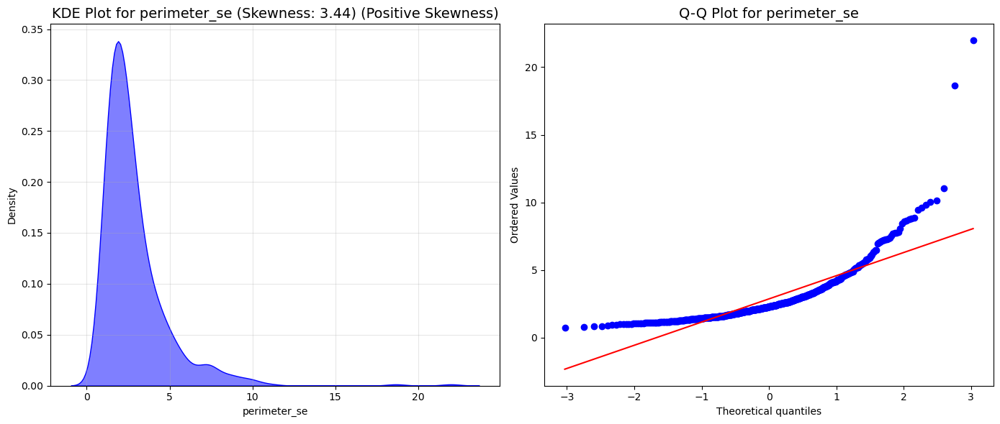

area_se: Skewness = 5.45 (Positive Skewness)


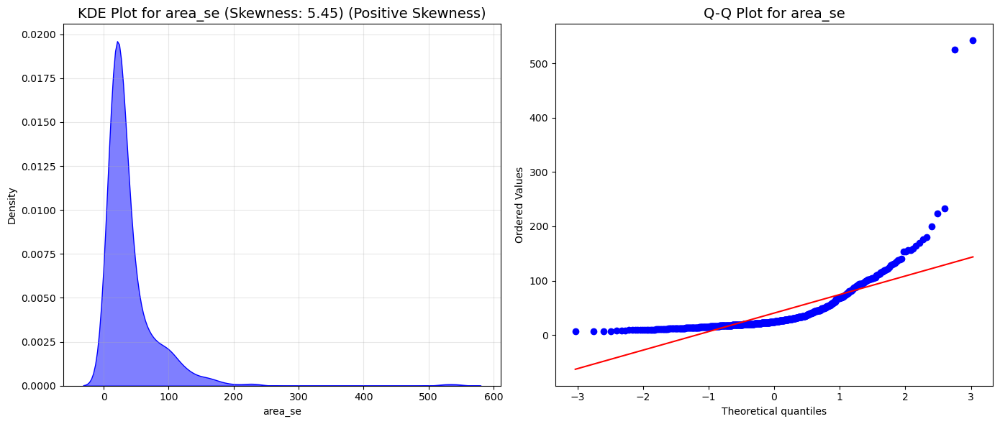

smoothness_se: Skewness = 2.31 (Positive Skewness)


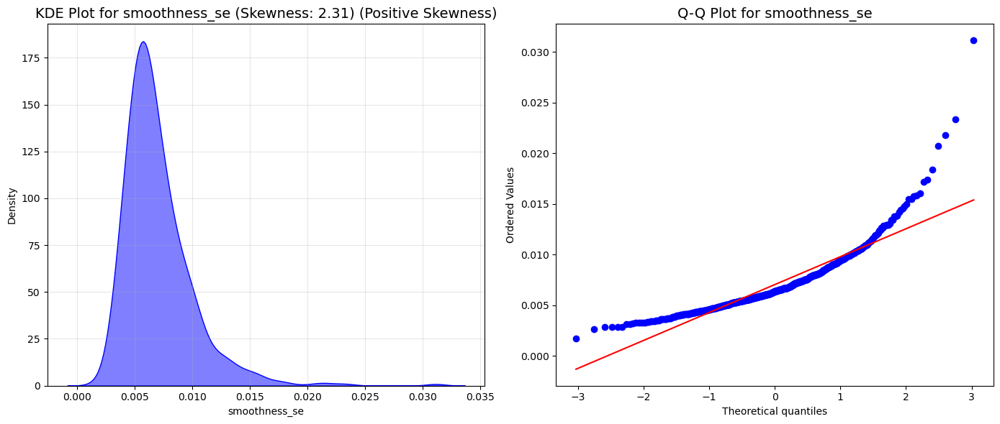

compactness_se: Skewness = 1.90 (Positive Skewness)


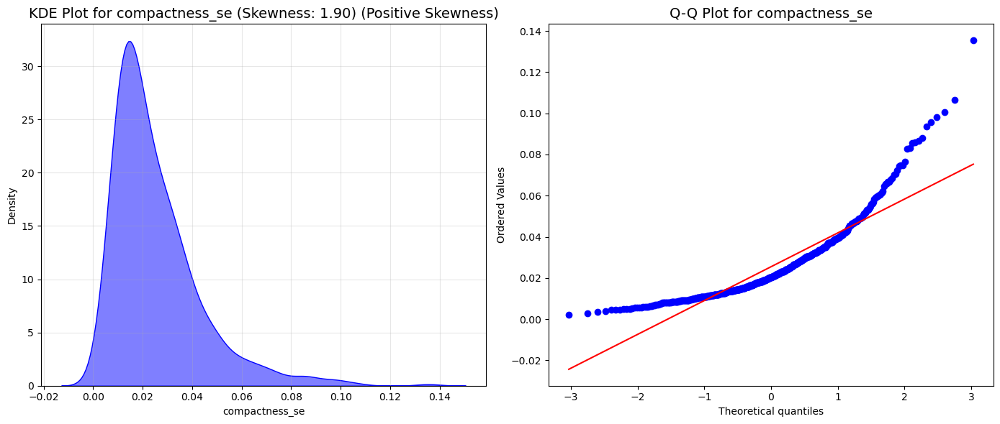

concavity_se: Skewness = 5.11 (Positive Skewness)


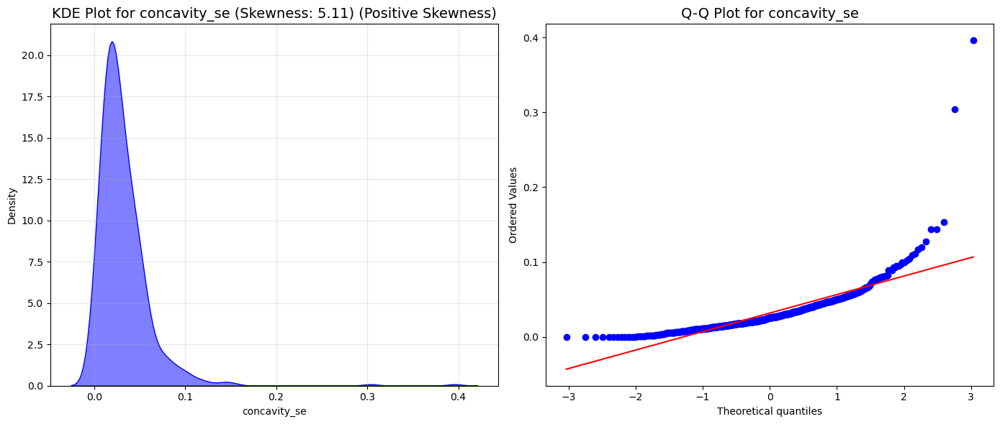

concave points_se: Skewness = 1.44 (Positive Skewness)


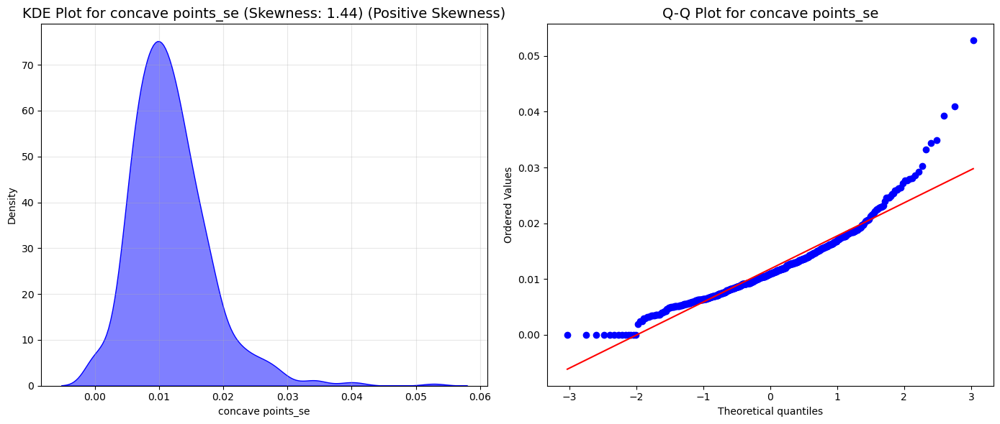

symmetry_se: Skewness = 2.20 (Positive Skewness)


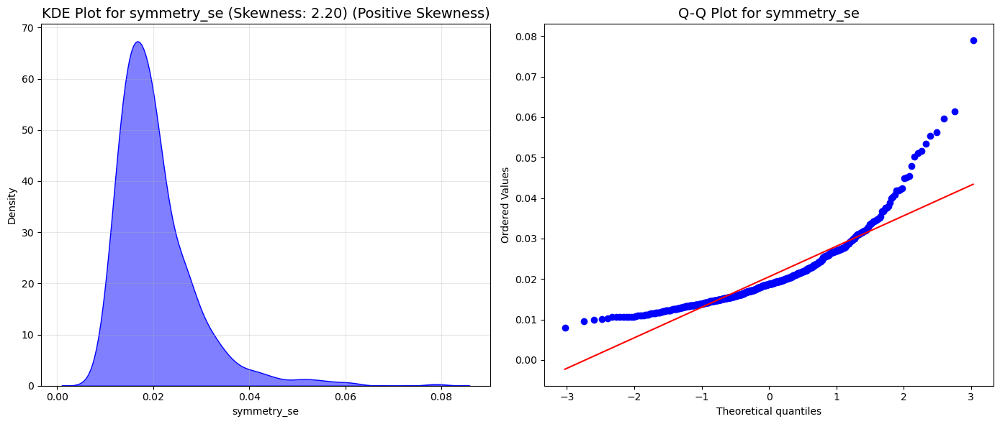

fractal_dimension_se: Skewness = 3.92 (Positive Skewness)


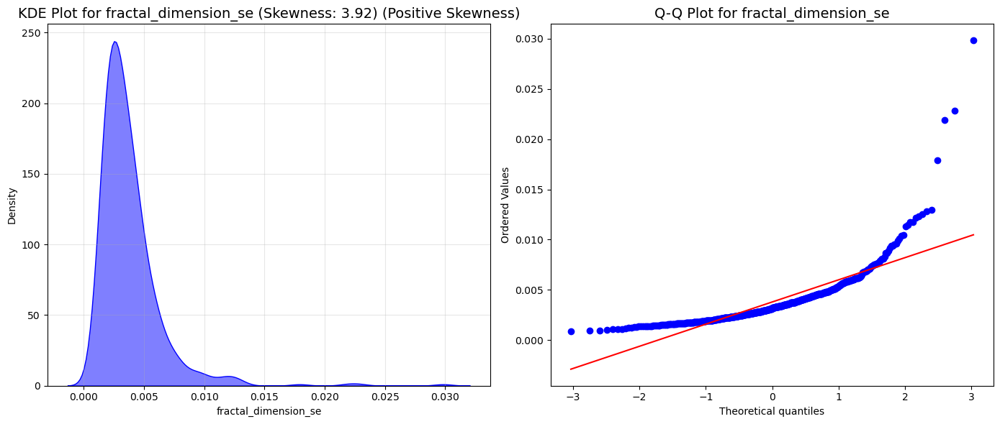

radius_worst: Skewness = 1.10 (Positive Skewness)


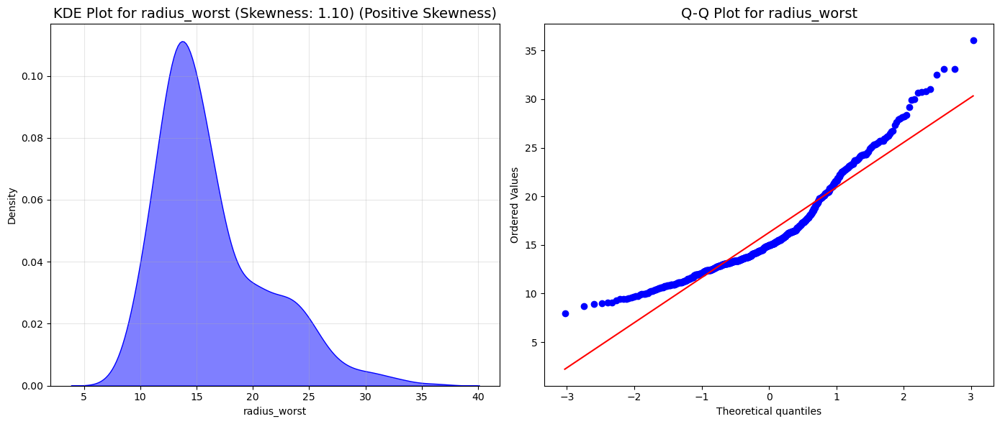

texture_worst: Skewness = 0.50 (Positive Skewness)


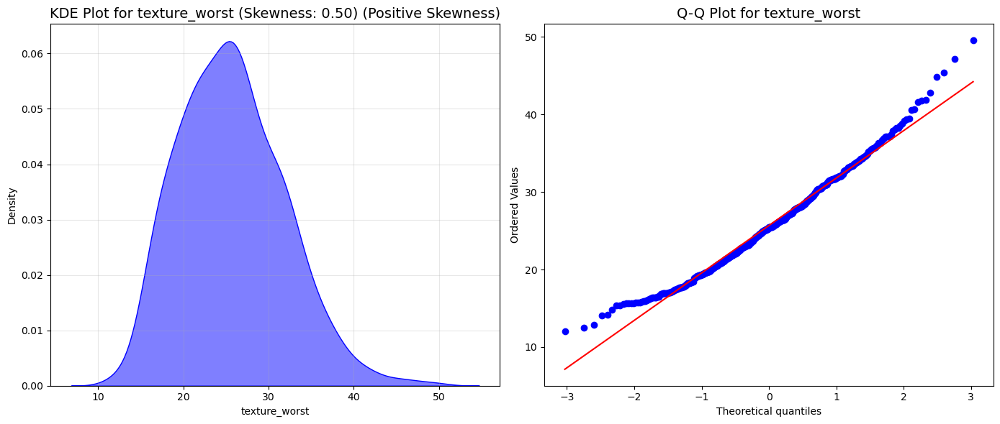

perimeter_worst: Skewness = 1.13 (Positive Skewness)


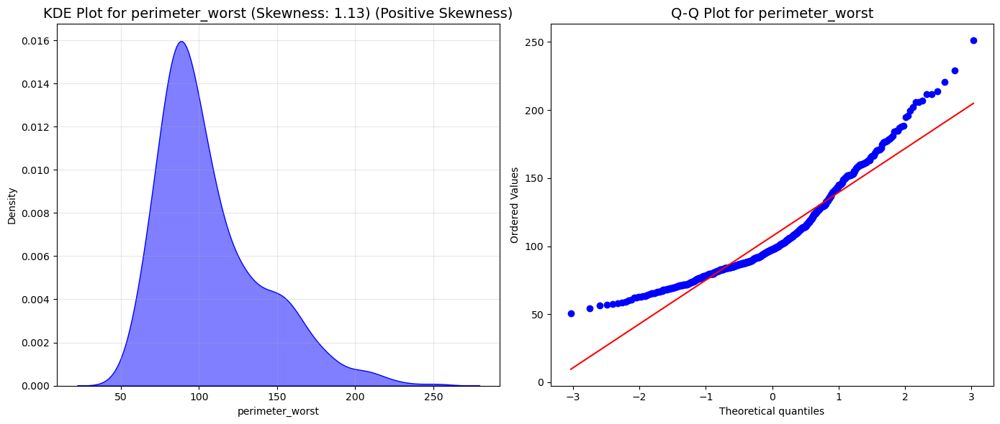

area_worst: Skewness = 1.86 (Positive Skewness)


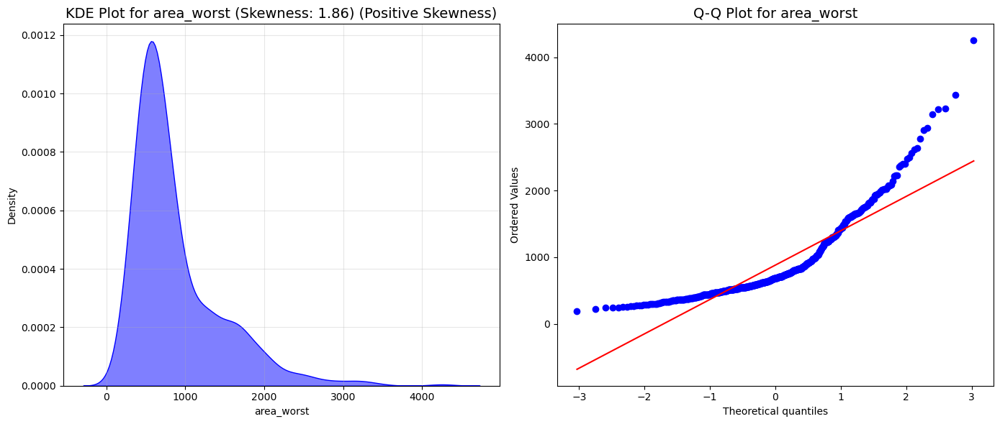

smoothness_worst: Skewness = 0.42 (Positive Skewness)


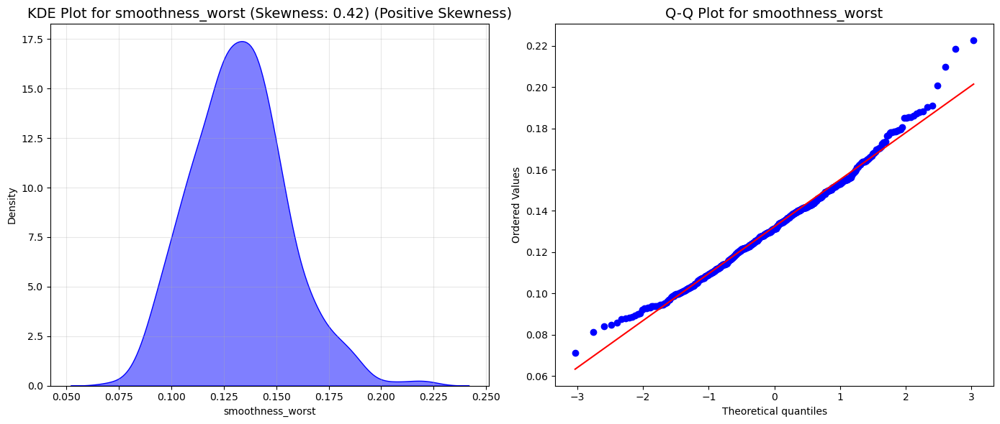

compactness_worst: Skewness = 1.47 (Positive Skewness)


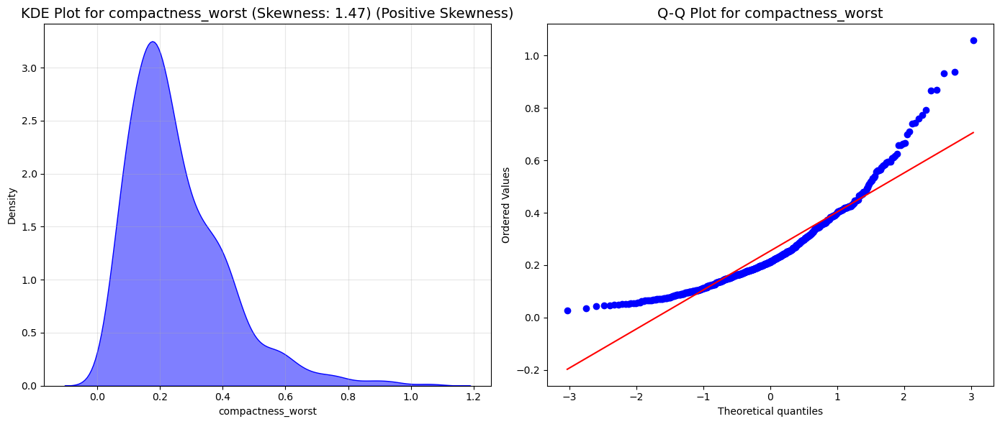

concavity_worst: Skewness = 1.15 (Positive Skewness)


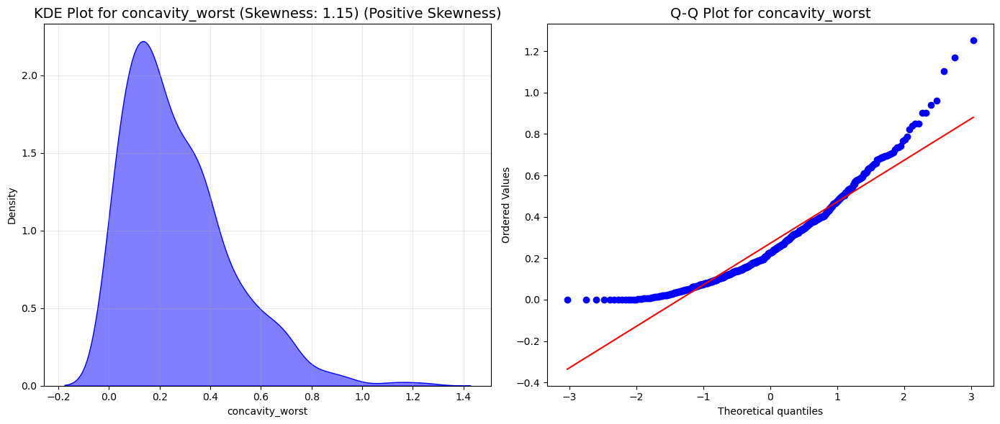

concave points_worst: Skewness = 0.49 (Positive Skewness)


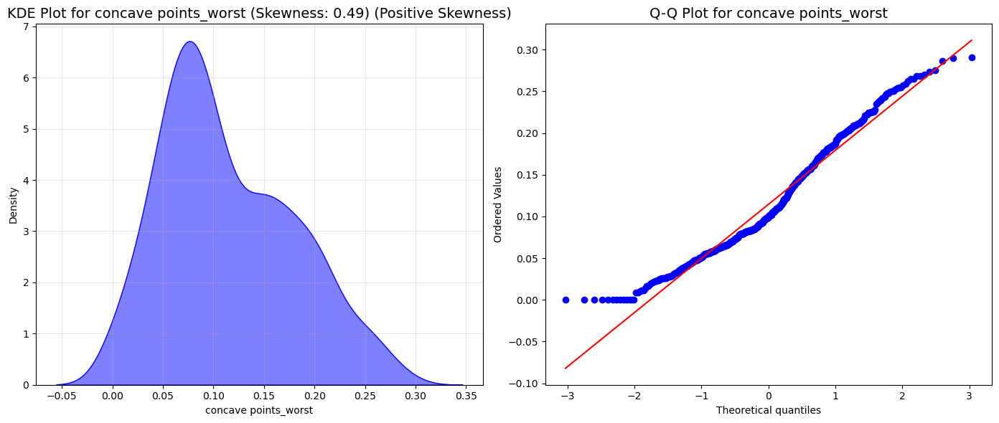

symmetry_worst: Skewness = 1.43 (Positive Skewness)


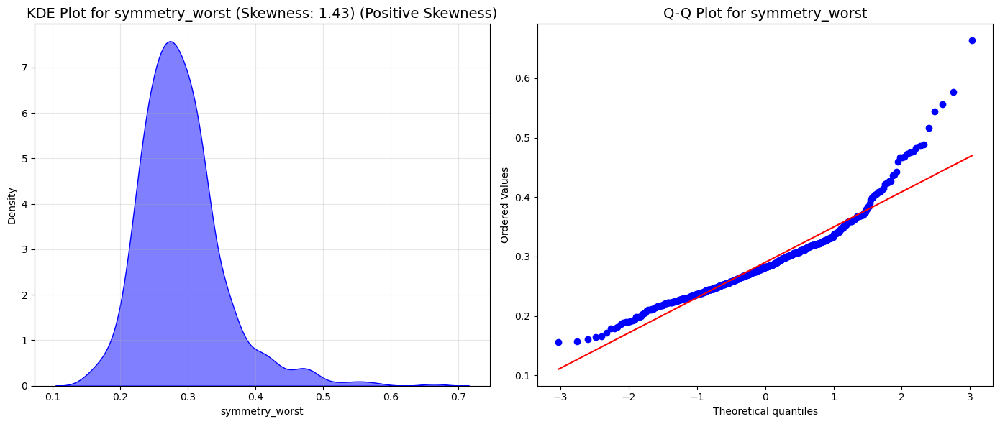

fractal_dimension_worst: Skewness = 1.66 (Positive Skewness)


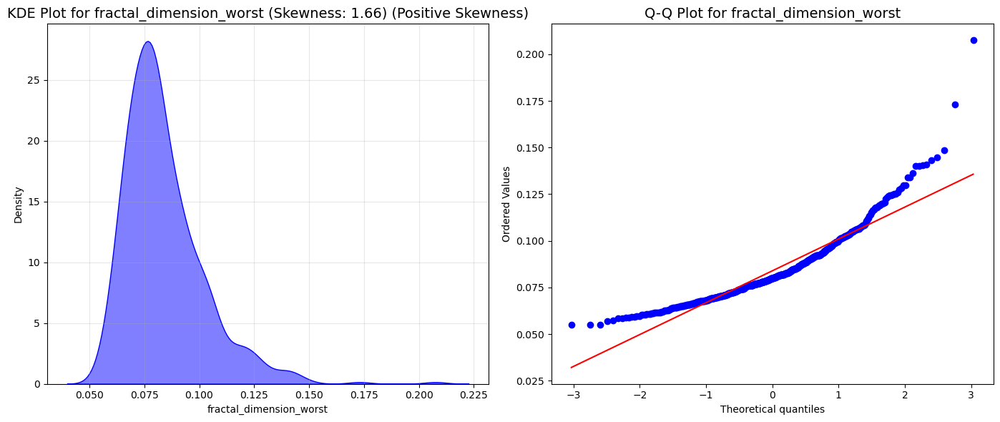

In [12]:
# Loop through each column in the DataFrame
for column in X.columns:
    if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # Create a side-by-side plot
        
        skewness = X[column].skew()
        
        # Determine skewness type
        if skewness > 0:
            skew_type = "Positive Skewness"
        elif skewness < 0:
            skew_type = "Negative Skewness"
        else:
            skew_type = "Approximately Symmetrical"
        
        print(f"{column}: Skewness = {skewness:.2f} ({skew_type})")
        # KDE plot
        sns.kdeplot(X[column].dropna(), fill=True, color='blue', alpha=0.5, ax=axes[0])
        skewness = X[column].skew()  # Calculate skewness
        axes[0].set_title(f"KDE Plot for {column} (Skewness: {skewness:.2f}) ({skew_type})", fontsize=14)
        axes[0].set_xlabel(column)
        axes[0].set_ylabel('Density')
        axes[0].grid(alpha=0.3)
        
        # Q-Q plot
        stats.probplot(X[column].dropna(), dist="norm", plot=axes[1])
        axes[1].set_title(f"Q-Q Plot for {column}", fontsize=14)
        
        plt.tight_layout()
        plt.show()

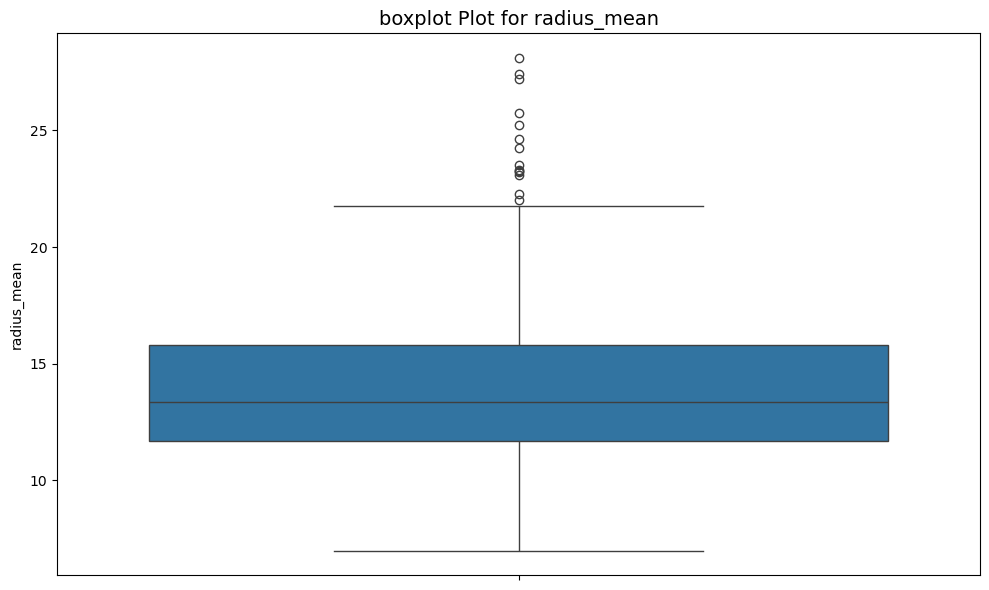

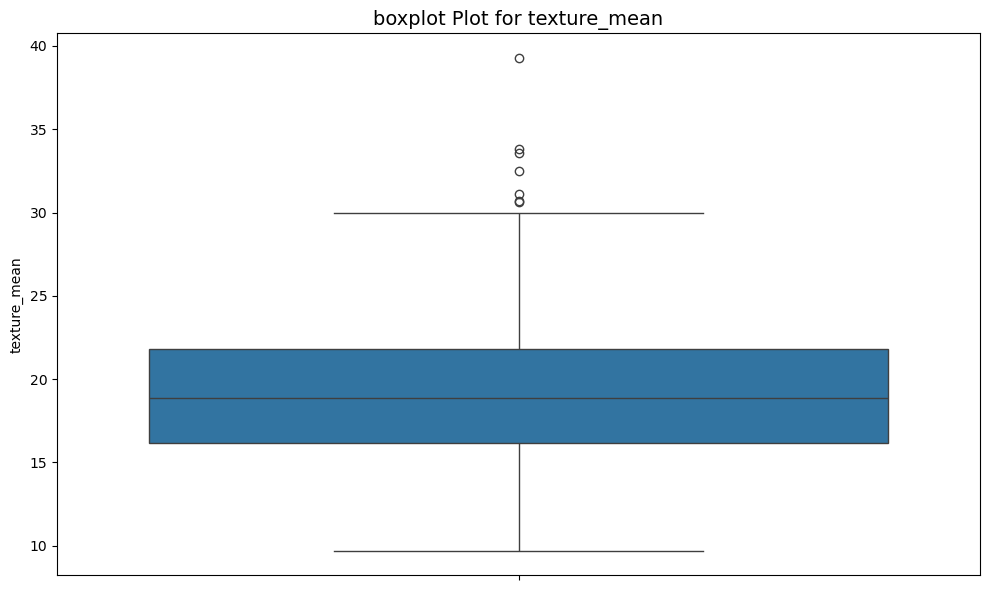

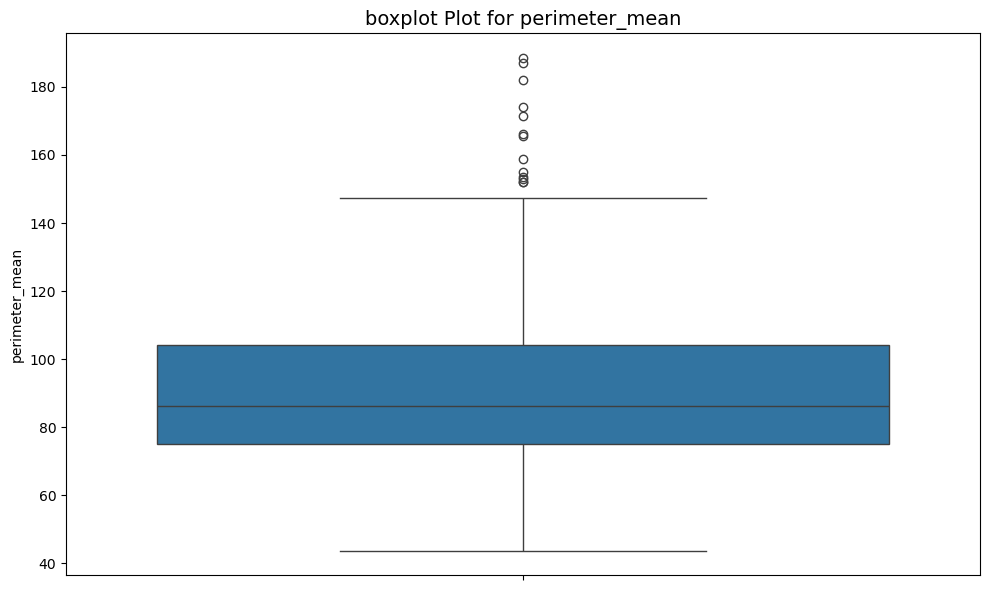

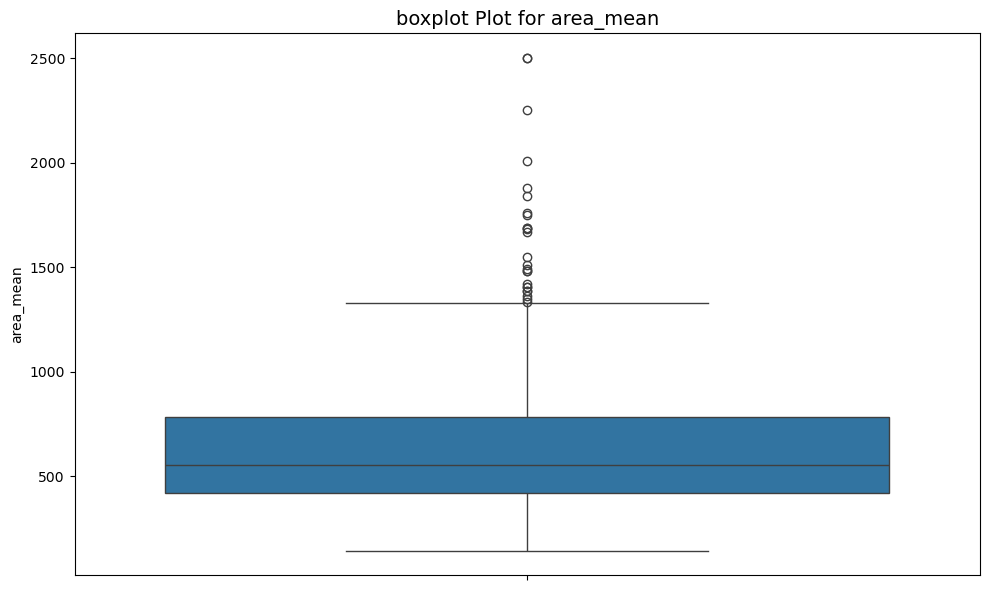

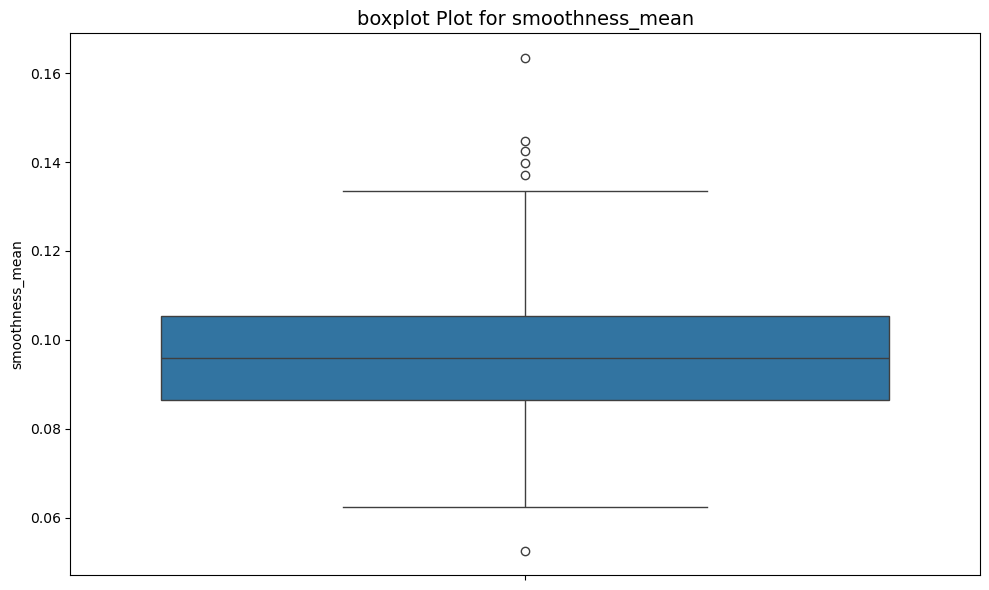

...

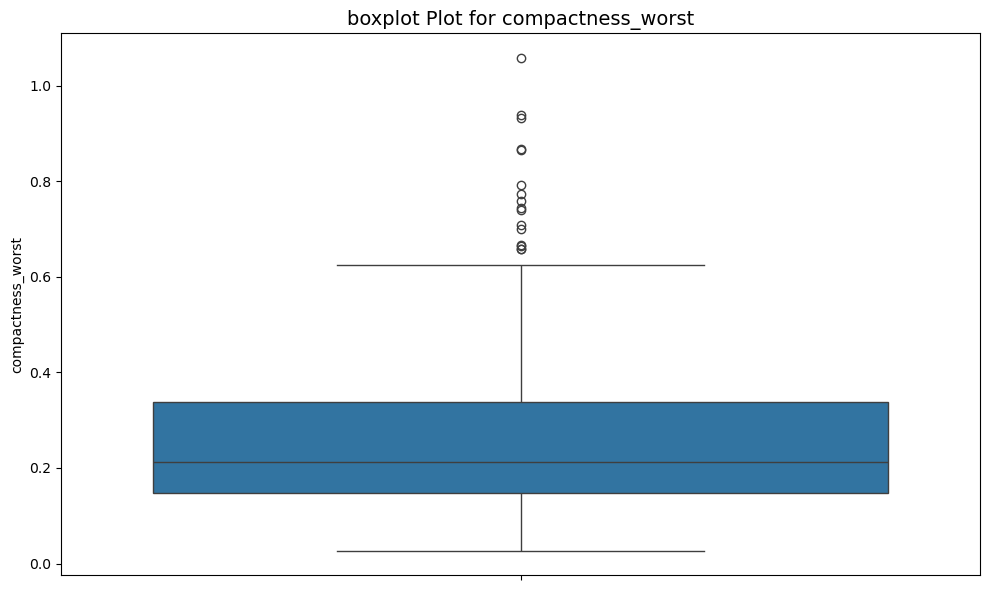

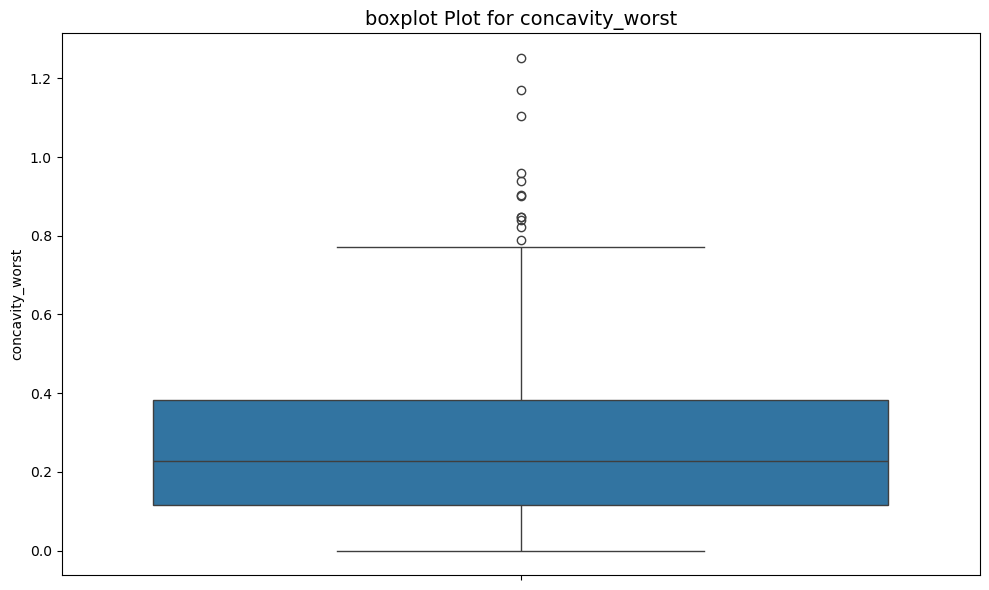

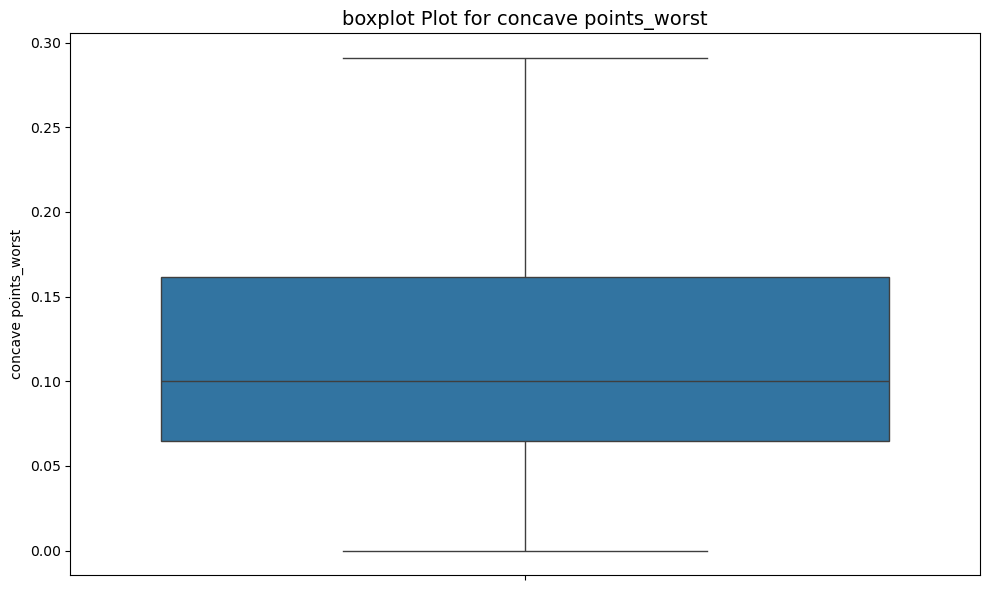

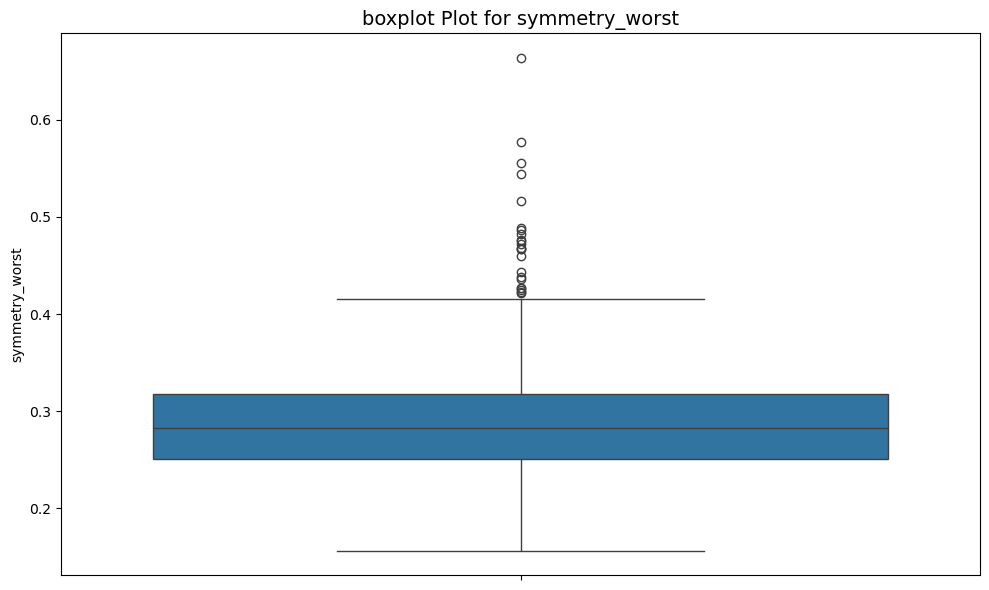

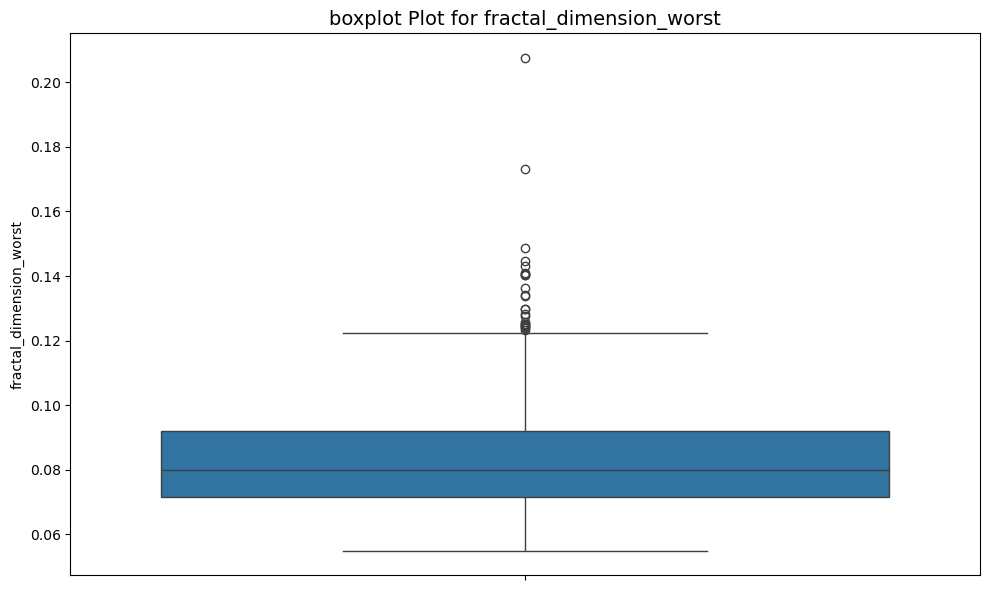

In [13]:
# Loop through each column in the DataFrame
for column in df.columns:
    if np.issubdtype(df[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(df[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [14]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [15]:
X_train.shape,y_train.shape

((455, 30), (455,))

In [16]:
X_test.shape,y_test.shape

((114, 30), (114,))

In [17]:
# Define the ColumnTransformer with dynamic numeric column selection
yeo_johnson_transformer = ColumnTransformer(
    transformers=[
        ('yeo_johnson', PowerTransformer(method='yeo-johnson'), X_train.select_dtypes(include=[np.number]).columns)
    ],
    remainder='passthrough'  # Retain other columns (non-numeric) as is
)

In [18]:
# Fit and transform the data
X_train_transformed = yeo_johnson_transformer.fit_transform(X_train)
X_test_transformed = yeo_johnson_transformer.transform(X_test)

In [19]:
# Convert transformed data back to a DataFrame with appropriate column names
X_train_transformed = pd.DataFrame(X_train_transformed, columns=X_train.columns)
X_test_transformed = pd.DataFrame(X_test_transformed, columns=X_test.columns)

In [55]:
X_test_transformed.shape , y_test.shape

((114, 30), (114,))

radius_mean: Skewness = 0.01 (Positive Skewness)


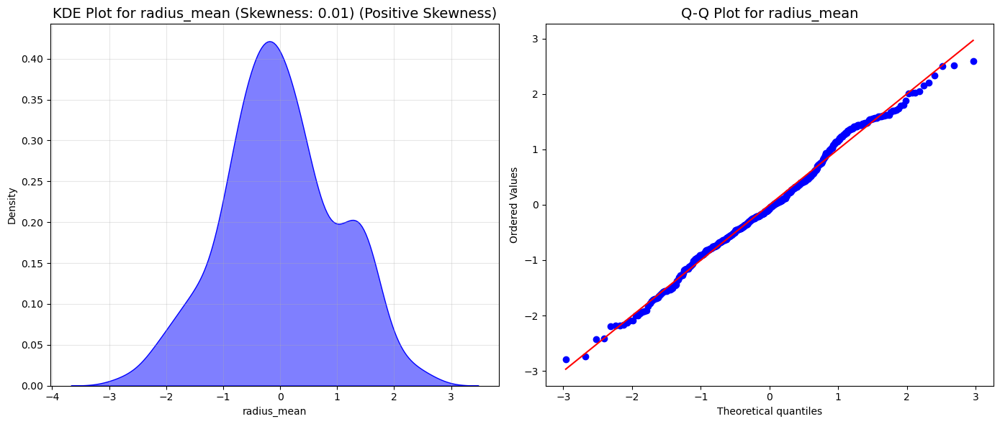

texture_mean: Skewness = -0.00 (Negative Skewness)


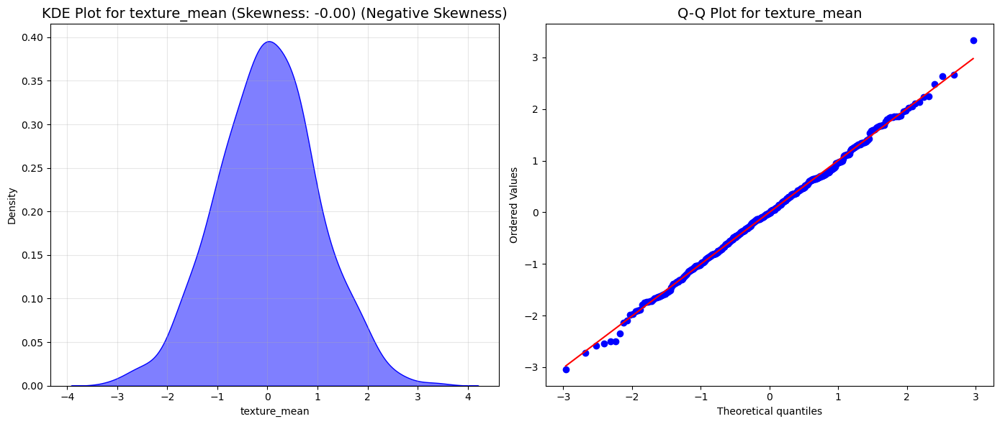

perimeter_mean: Skewness = 0.01 (Positive Skewness)


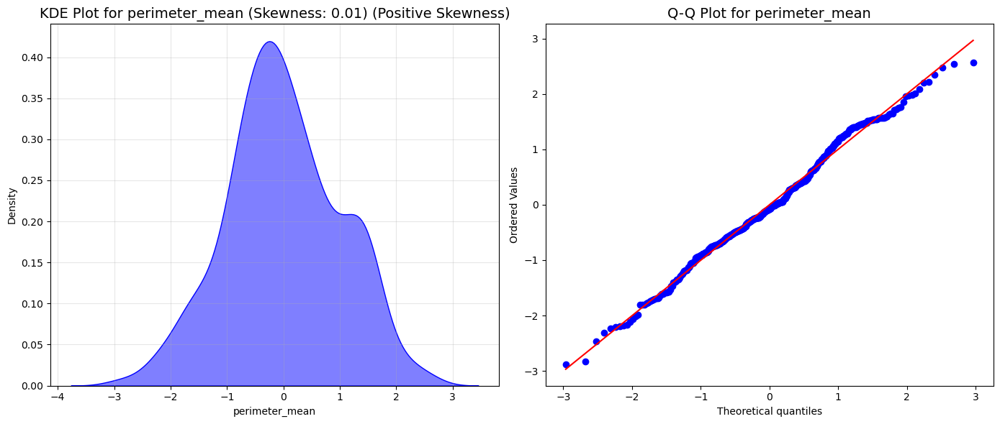

area_mean: Skewness = 0.01 (Positive Skewness)


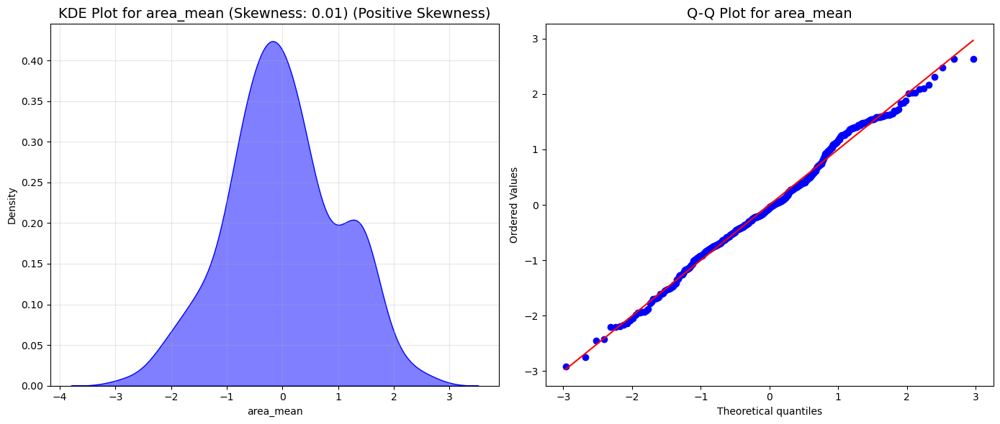

smoothness_mean: Skewness = -0.02 (Negative Skewness)


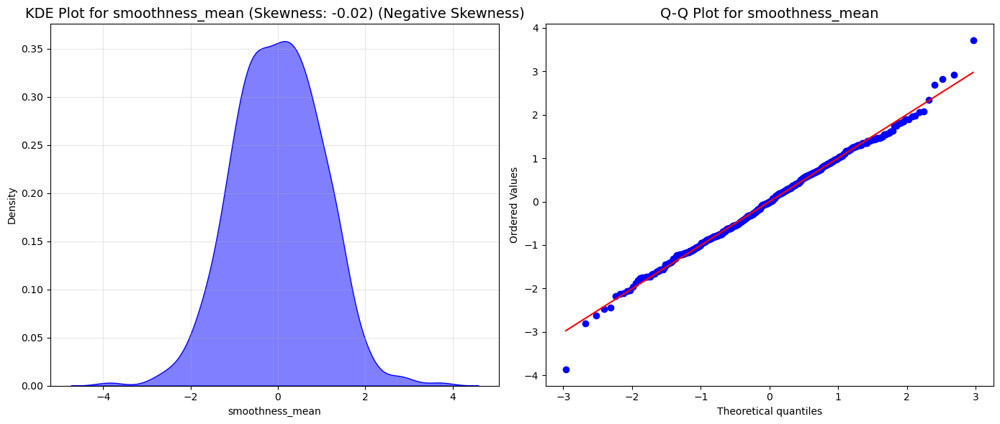

compactness_mean: Skewness = 0.11 (Positive Skewness)


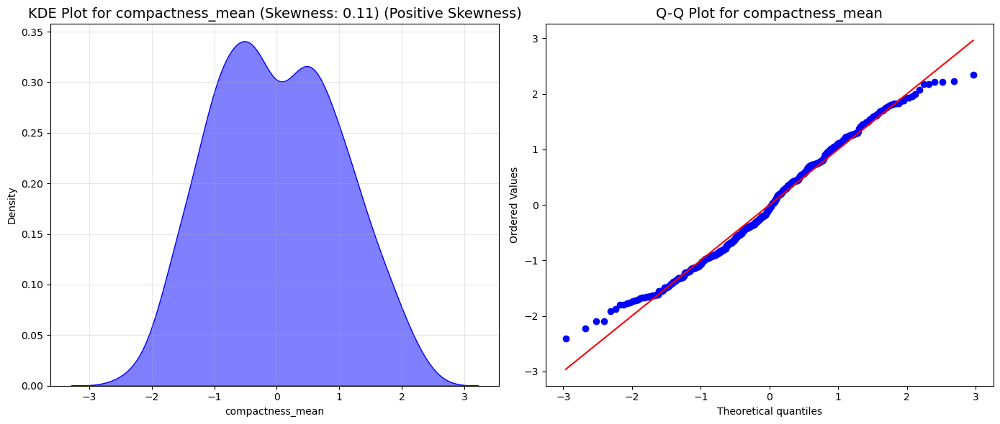

concavity_mean: Skewness = 0.23 (Positive Skewness)


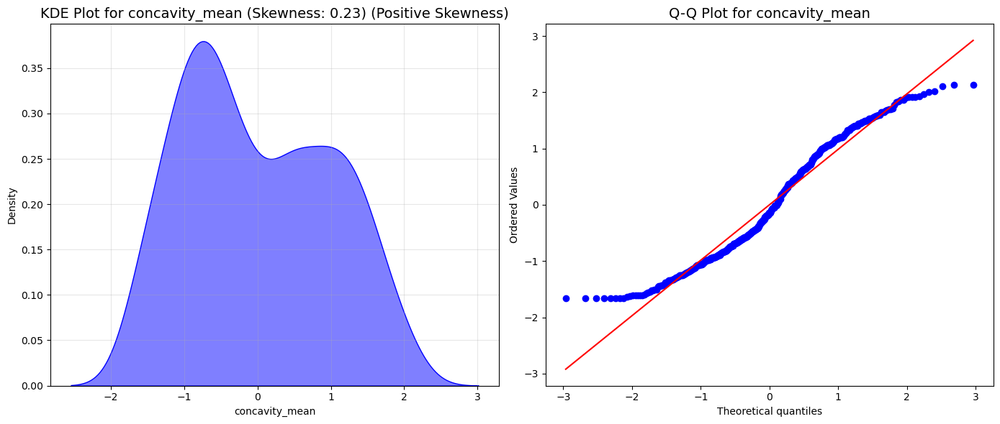

concave points_mean: Skewness = 0.20 (Positive Skewness)


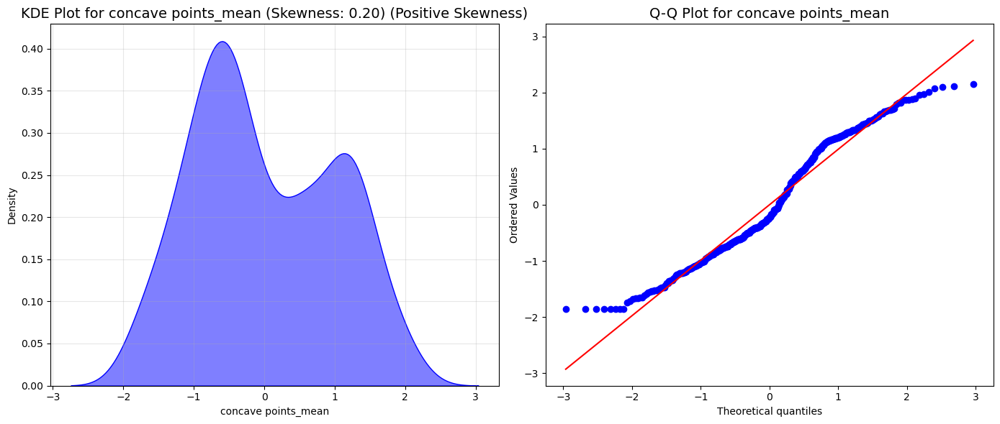

symmetry_mean: Skewness = -0.00 (Negative Skewness)


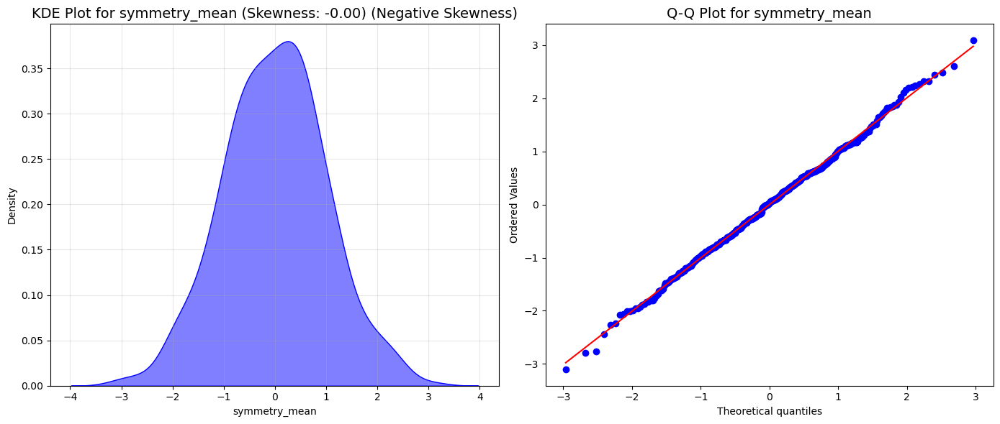

fractal_dimension_mean: Skewness = 0.03 (Positive Skewness)


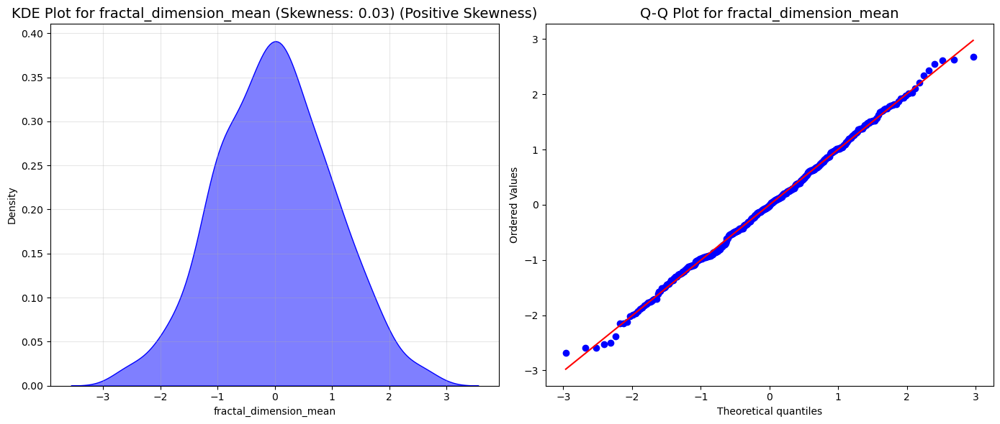

radius_se: Skewness = 0.19 (Positive Skewness)


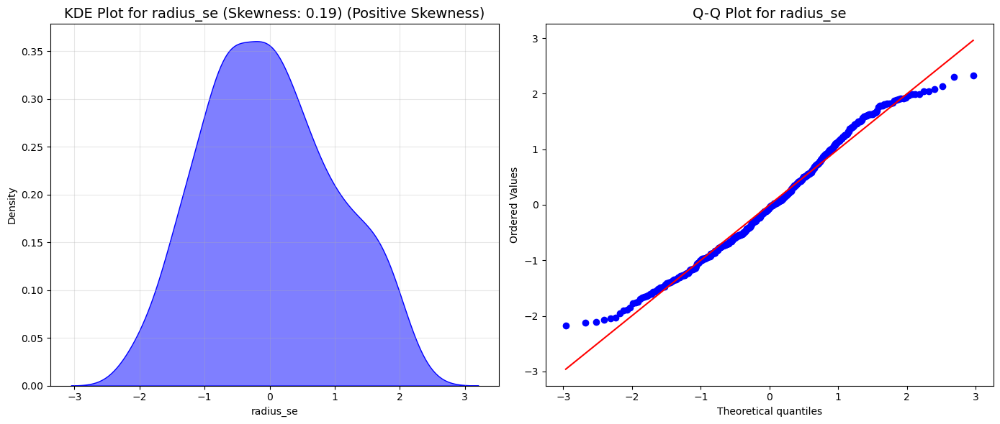

texture_se: Skewness = 0.01 (Positive Skewness)


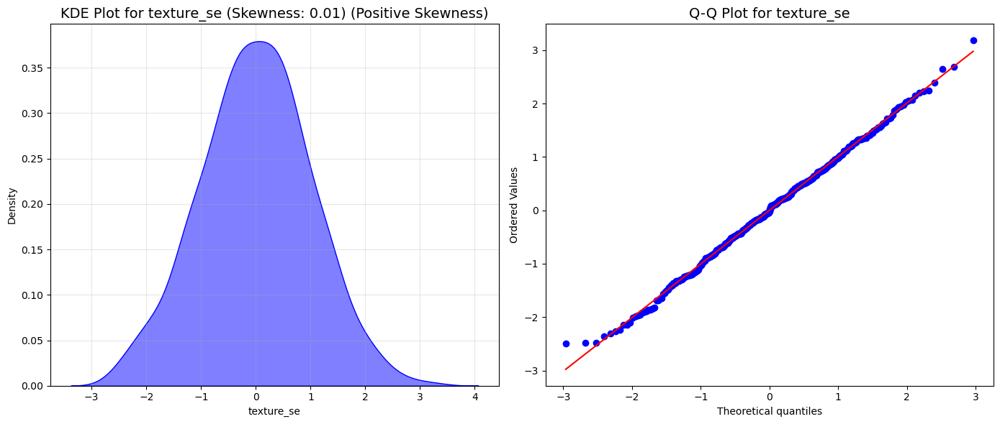

perimeter_se: Skewness = 0.07 (Positive Skewness)


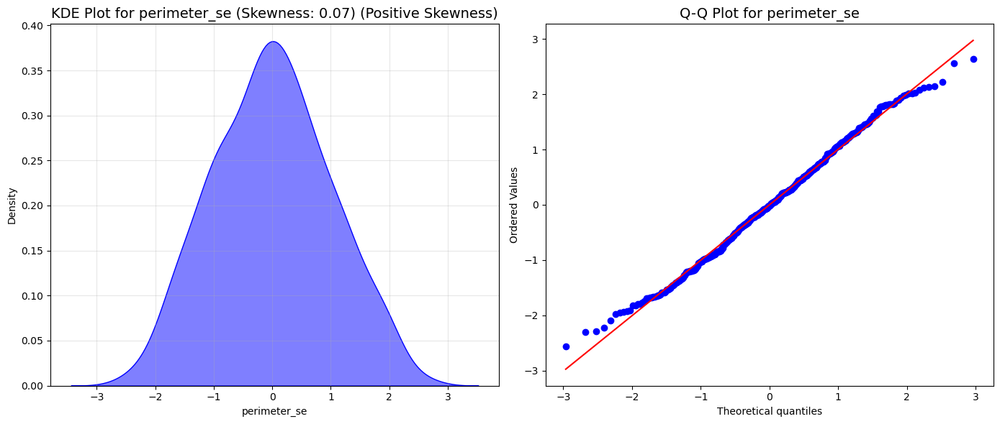

area_se: Skewness = 0.05 (Positive Skewness)


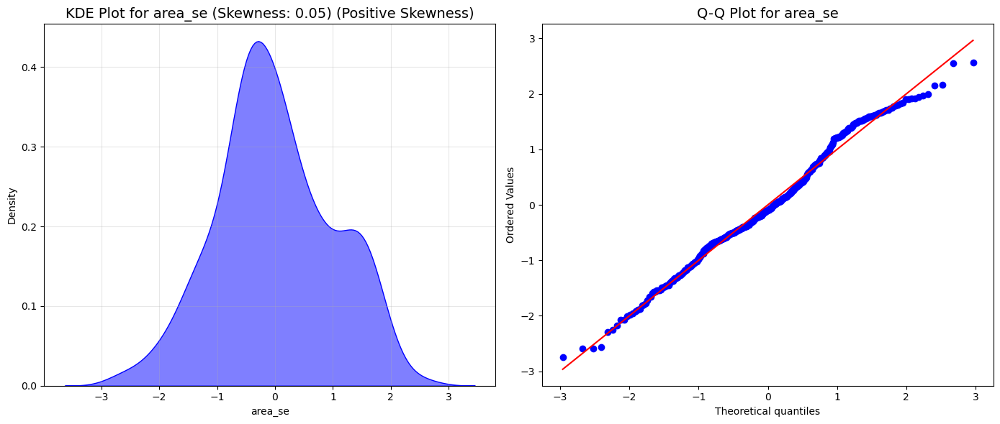

smoothness_se: Skewness = 0.07 (Positive Skewness)


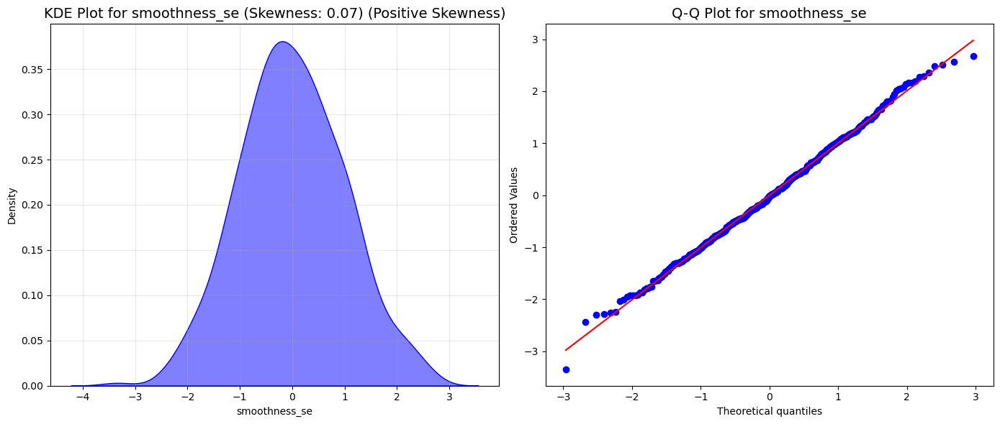

compactness_se: Skewness = 0.22 (Positive Skewness)


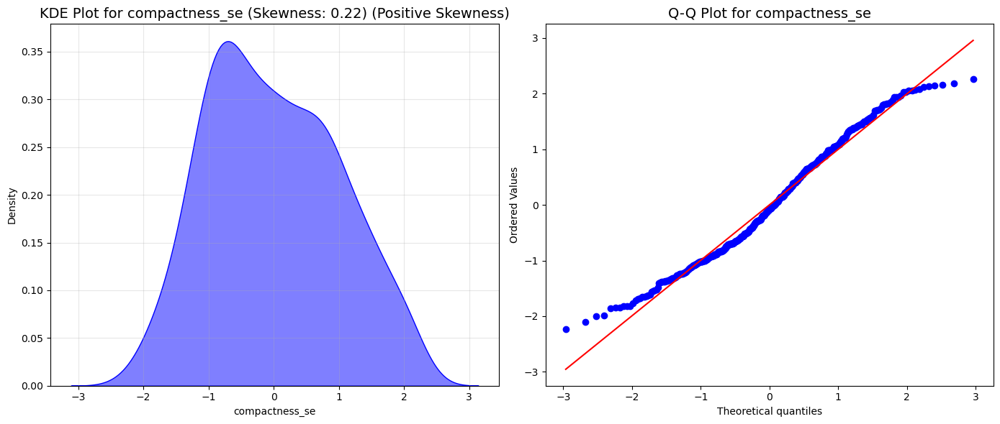

concavity_se: Skewness = 0.16 (Positive Skewness)


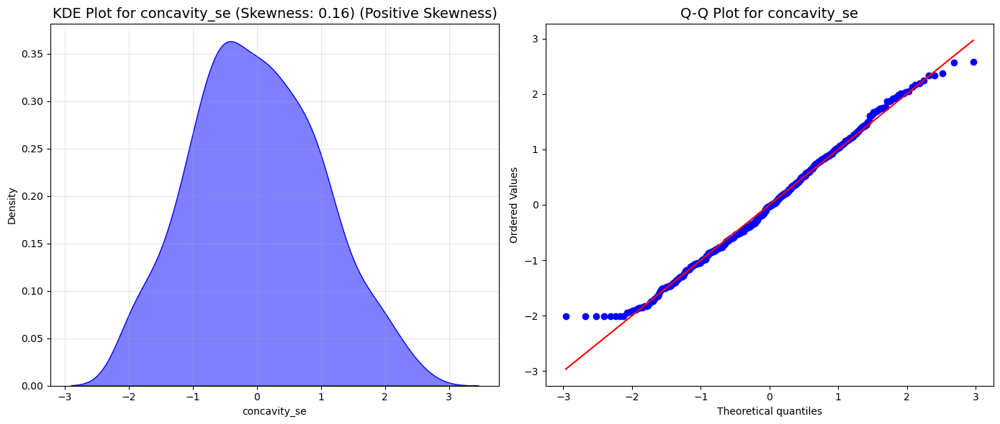

concave points_se: Skewness = -0.04 (Negative Skewness)


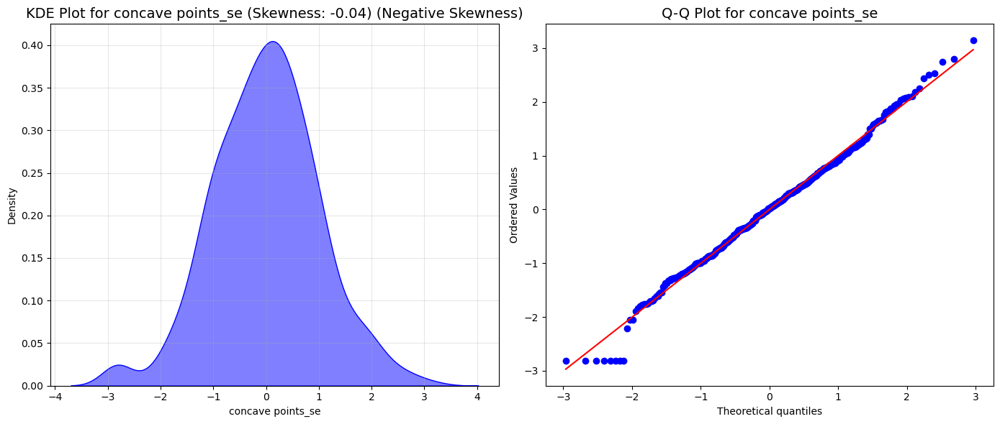

symmetry_se: Skewness = 0.13 (Positive Skewness)


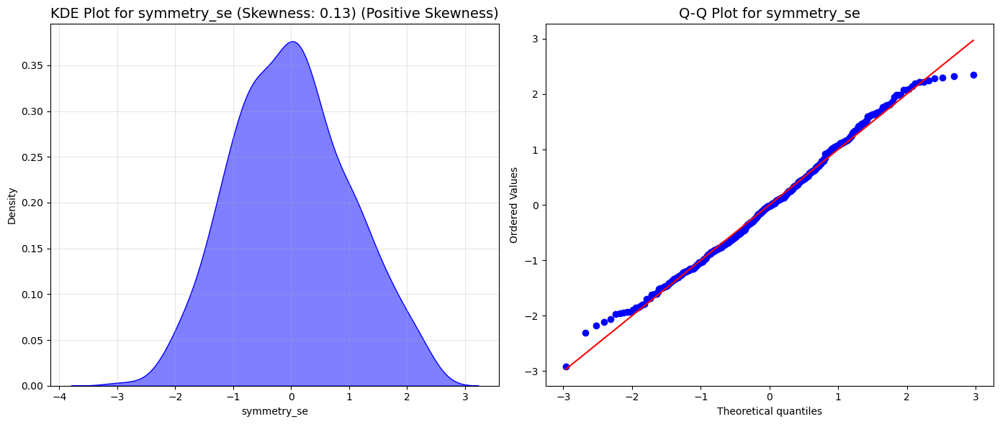

fractal_dimension_se: Skewness = 0.24 (Positive Skewness)


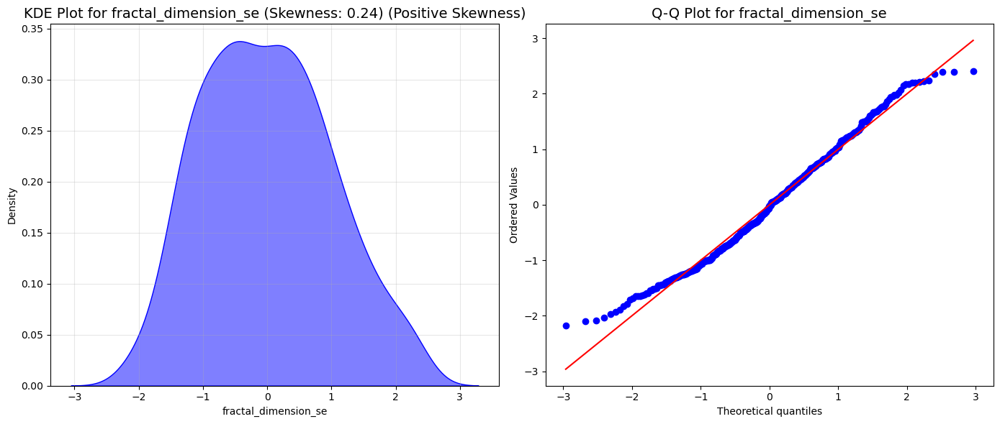

radius_worst: Skewness = 0.04 (Positive Skewness)


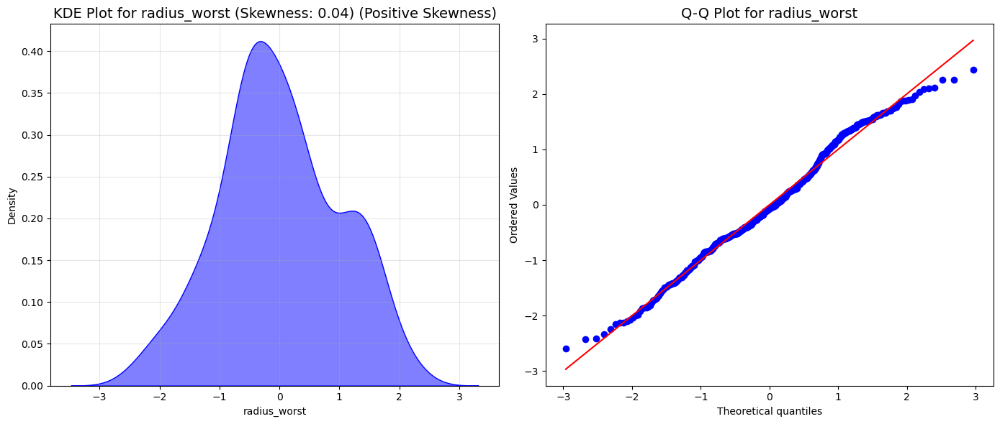

texture_worst: Skewness = -0.00 (Negative Skewness)


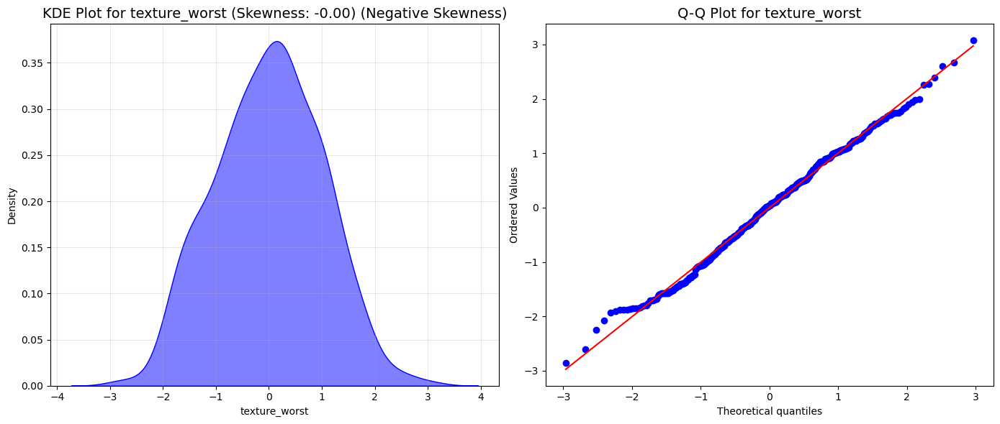

perimeter_worst: Skewness = 0.03 (Positive Skewness)


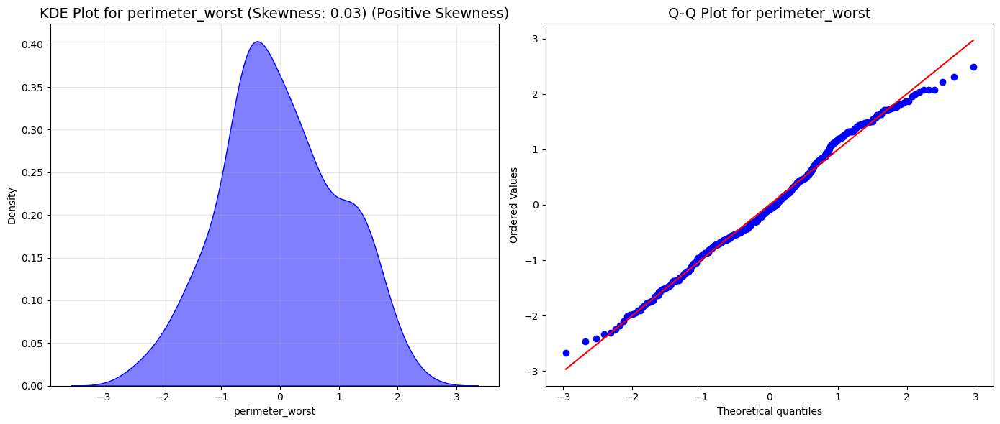

area_worst: Skewness = 0.03 (Positive Skewness)


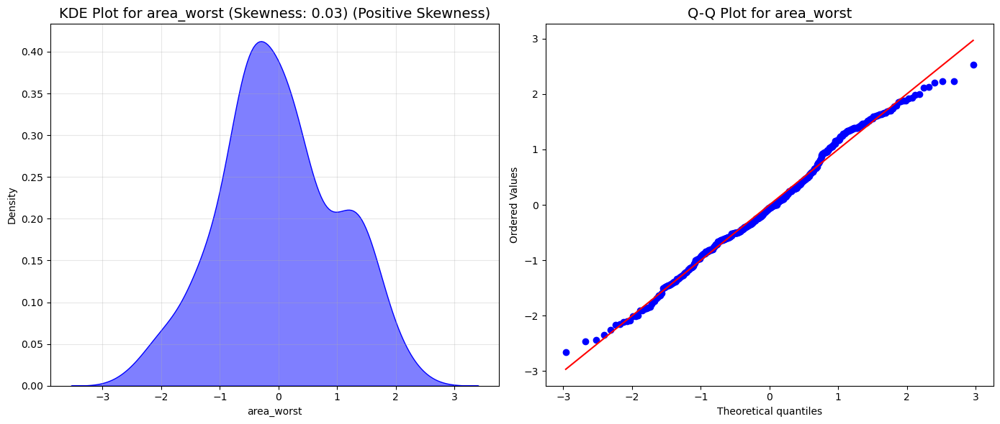

smoothness_worst: Skewness = 0.00 (Positive Skewness)


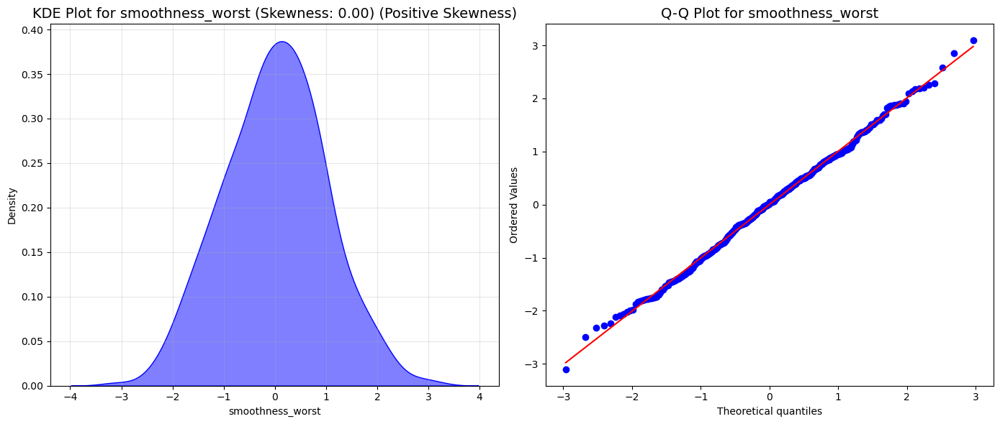

compactness_worst: Skewness = 0.09 (Positive Skewness)


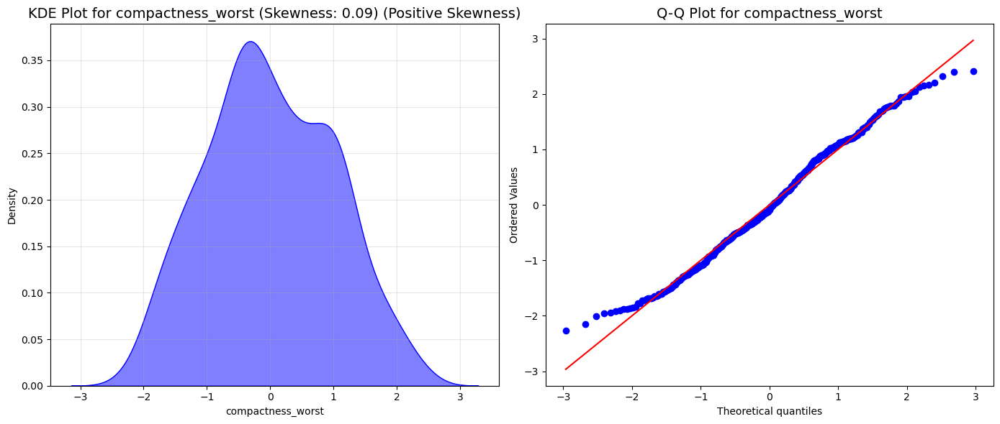

concavity_worst: Skewness = 0.09 (Positive Skewness)


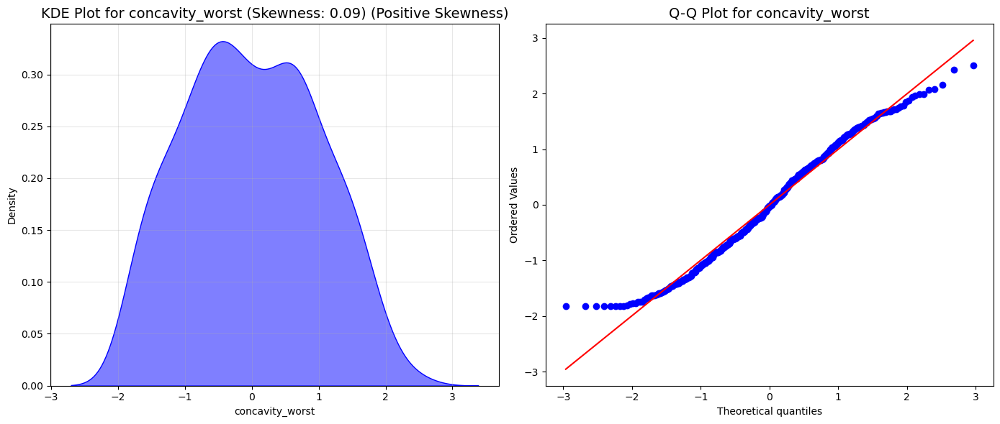

concave points_worst: Skewness = 0.05 (Positive Skewness)


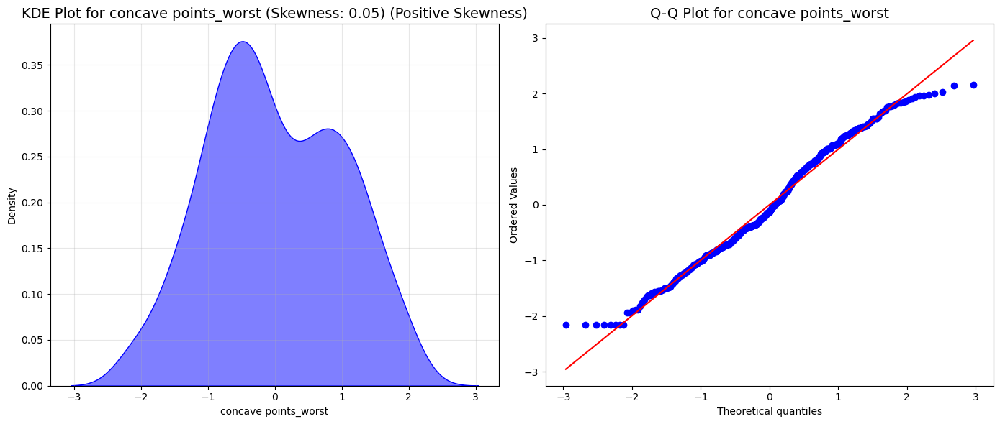

symmetry_worst: Skewness = -0.05 (Negative Skewness)


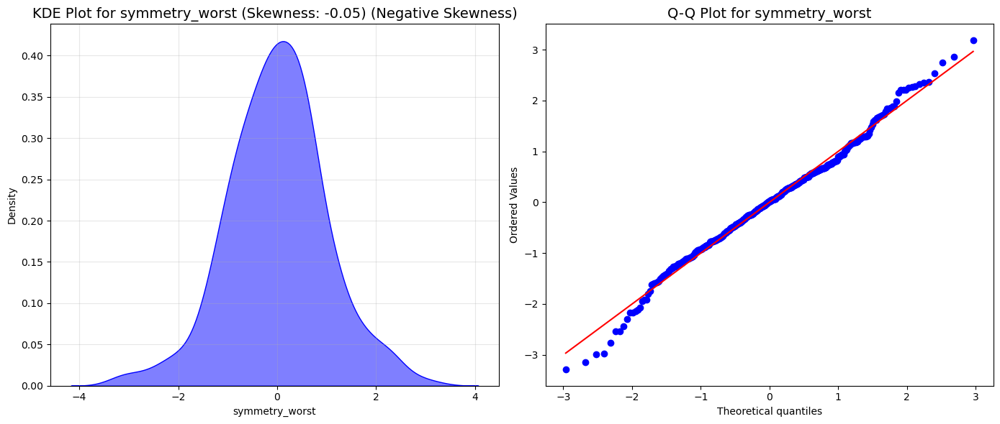

fractal_dimension_worst: Skewness = 0.08 (Positive Skewness)


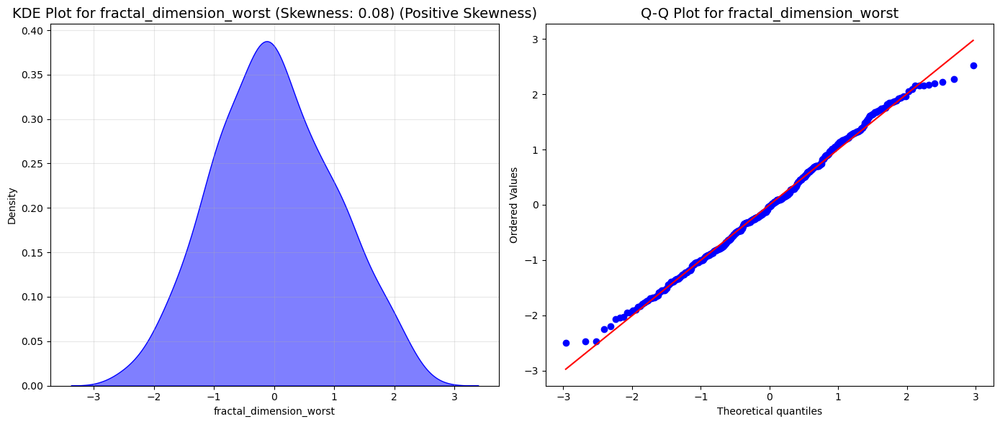

In [20]:
# Loop through each column in the DataFrame
for column in X_train_transformed.columns:
    if np.issubdtype(X_train_transformed[column].dtype, np.number):  # Check if the column is numeric
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # Create a side-by-side plot
        
        skewness = X_train_transformed[column].skew()
        
        # Determine skewness type
        if skewness > 0:
            skew_type = "Positive Skewness"
        elif skewness < 0:
            skew_type = "Negative Skewness"
        else:
            skew_type = "Approximately Symmetrical"
        
        print(f"{column}: Skewness = {skewness:.2f} ({skew_type})")
        # KDE plot
        sns.kdeplot(X_train_transformed[column].dropna(), fill=True, color='blue', alpha=0.5, ax=axes[0])
        skewness = X_train_transformed[column].skew()  # Calculate skewness
        axes[0].set_title(f"KDE Plot for {column} (Skewness: {skewness:.2f}) ({skew_type})", fontsize=14)
        axes[0].set_xlabel(column)
        axes[0].set_ylabel('Density')
        axes[0].grid(alpha=0.3)
        
        # Q-Q plot
        stats.probplot(X_train_transformed[column].dropna(), dist="norm", plot=axes[1])
        axes[1].set_title(f"Q-Q Plot for {column}", fontsize=14)
        
        plt.tight_layout()
        plt.show()

radius_mean: Skewness = -0.19 (Negative Skewness)


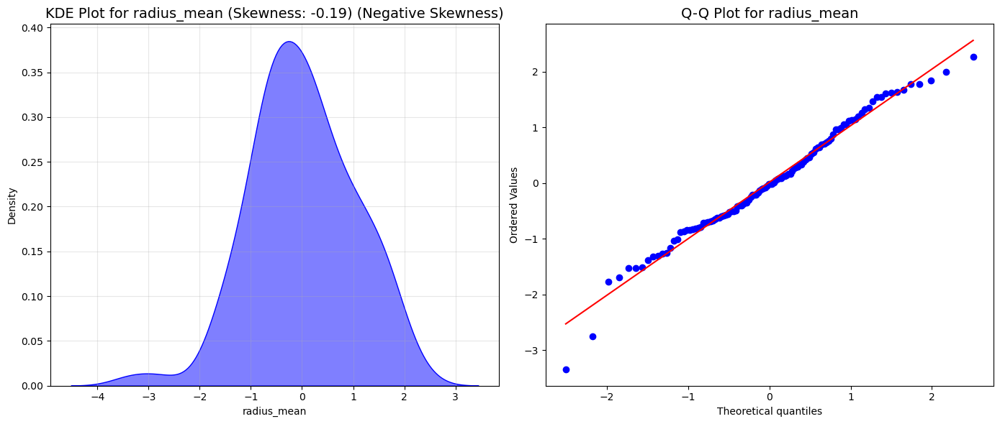

texture_mean: Skewness = -0.22 (Negative Skewness)


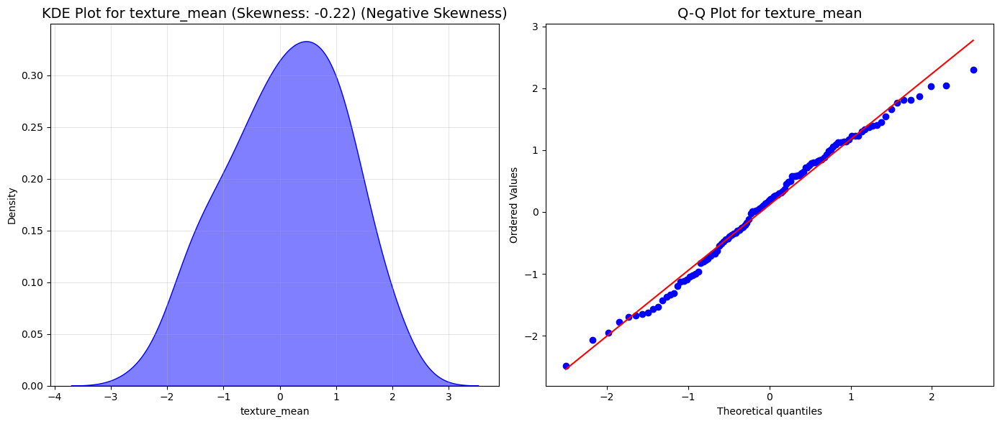

perimeter_mean: Skewness = -0.21 (Negative Skewness)


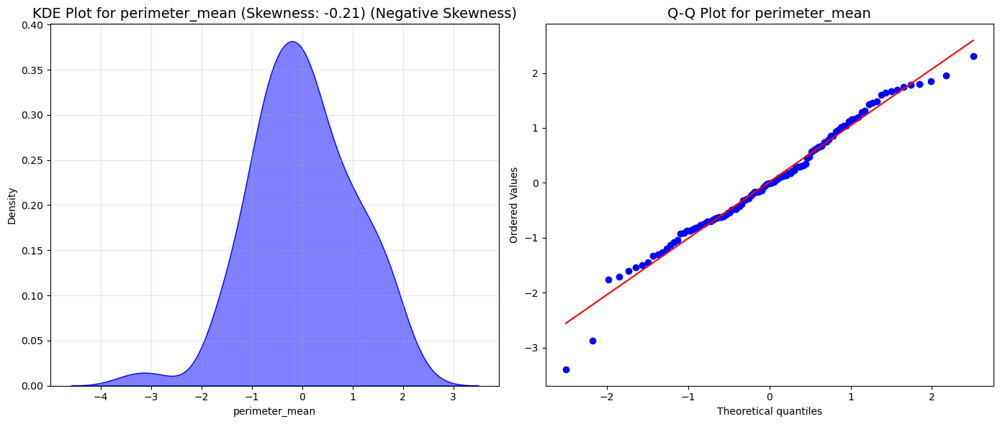

area_mean: Skewness = -0.21 (Negative Skewness)


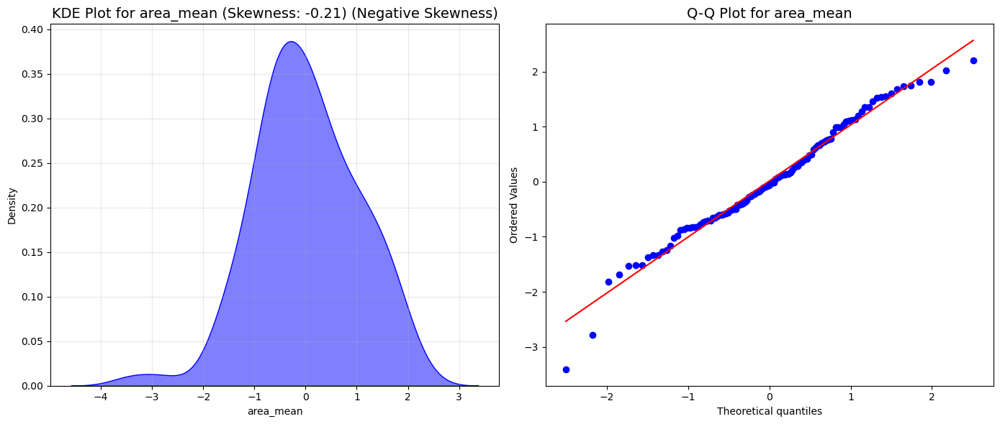

smoothness_mean: Skewness = -0.11 (Negative Skewness)


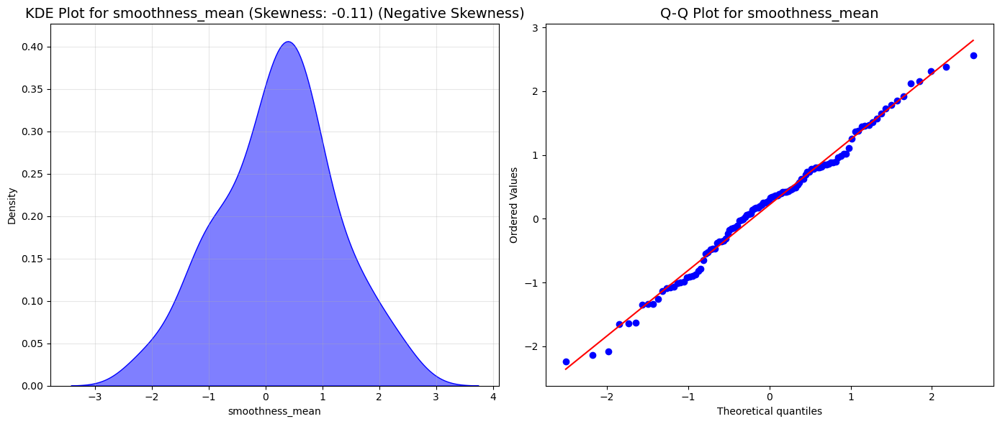

compactness_mean: Skewness = 0.26 (Positive Skewness)


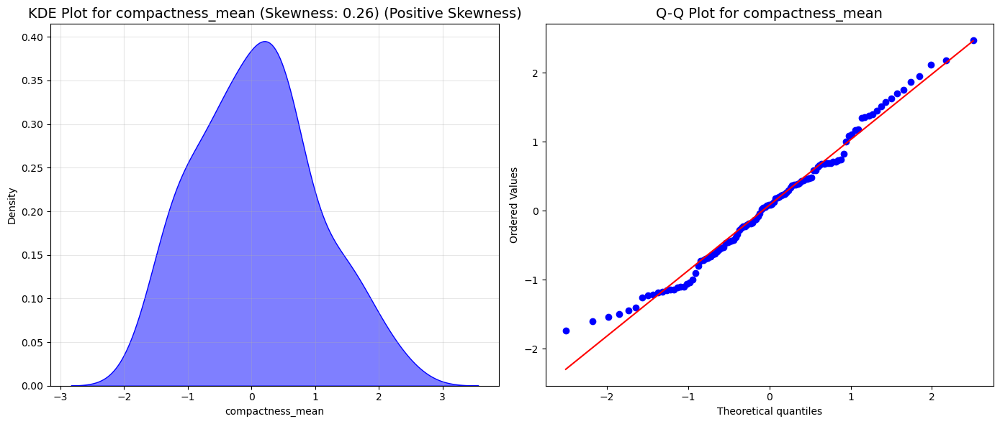

concavity_mean: Skewness = 0.24 (Positive Skewness)


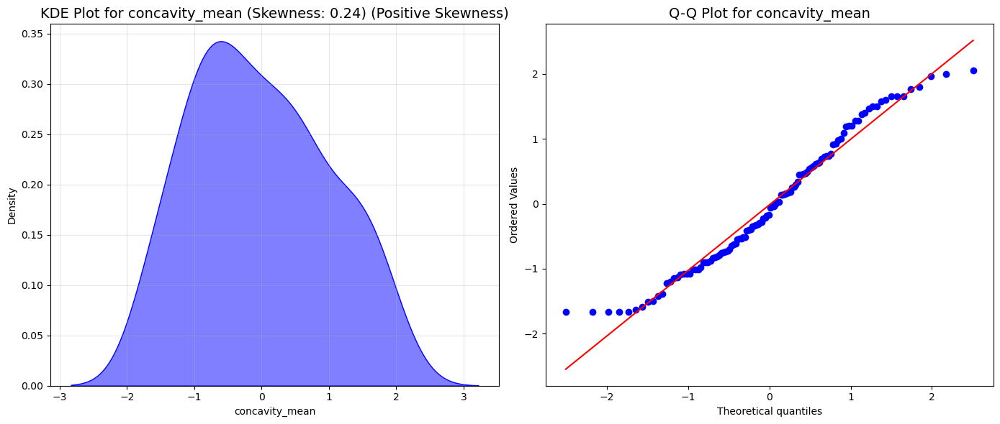

concave points_mean: Skewness = 0.13 (Positive Skewness)


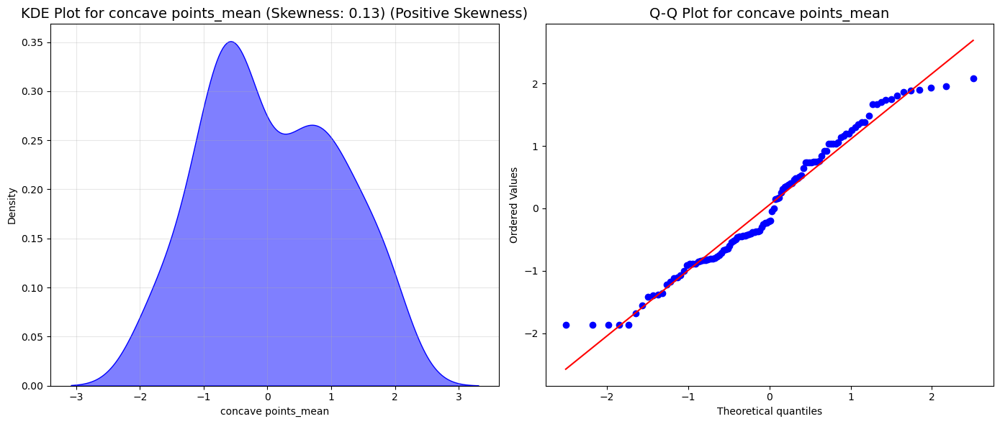

symmetry_mean: Skewness = -0.40 (Negative Skewness)


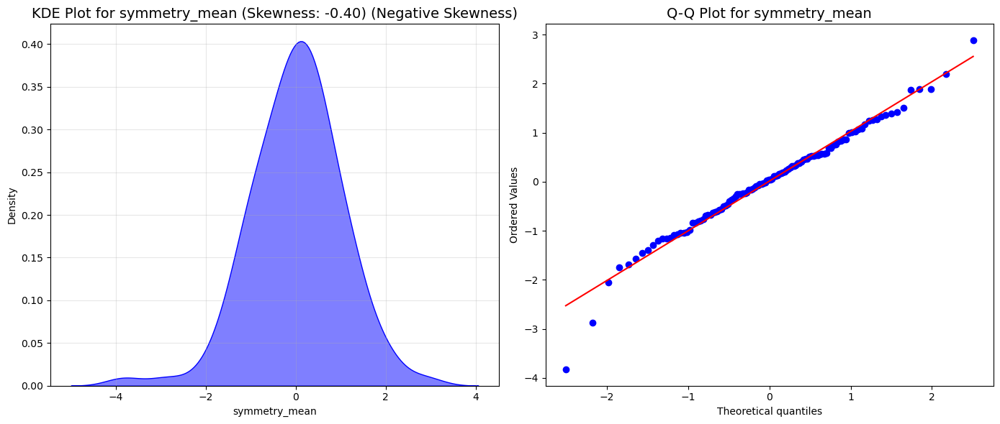

fractal_dimension_mean: Skewness = 0.04 (Positive Skewness)


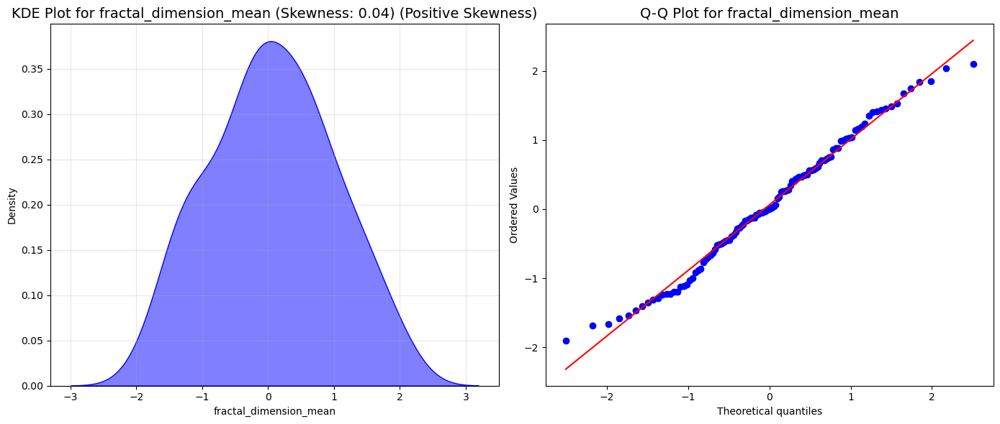

radius_se: Skewness = 0.12 (Positive Skewness)


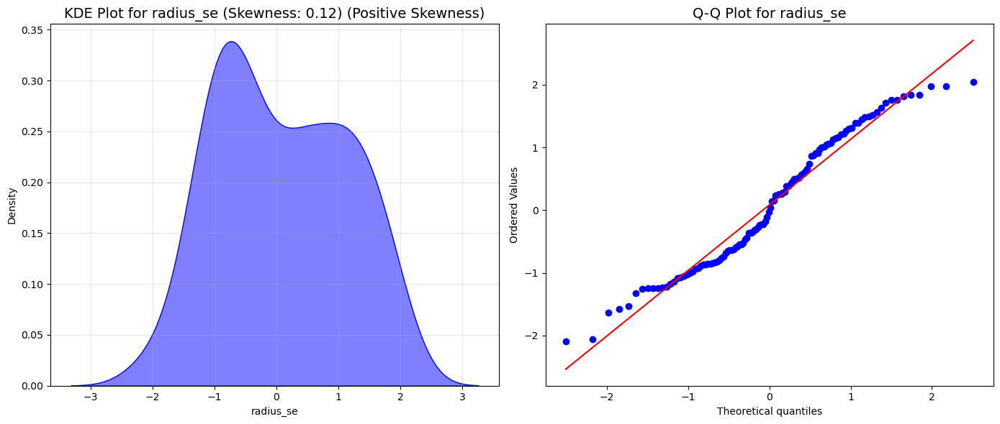

texture_se: Skewness = 0.04 (Positive Skewness)


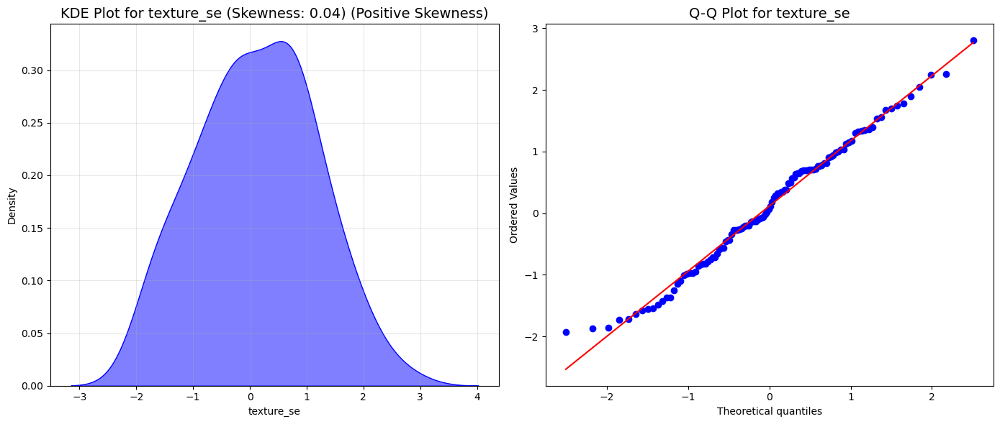

perimeter_se: Skewness = 0.12 (Positive Skewness)


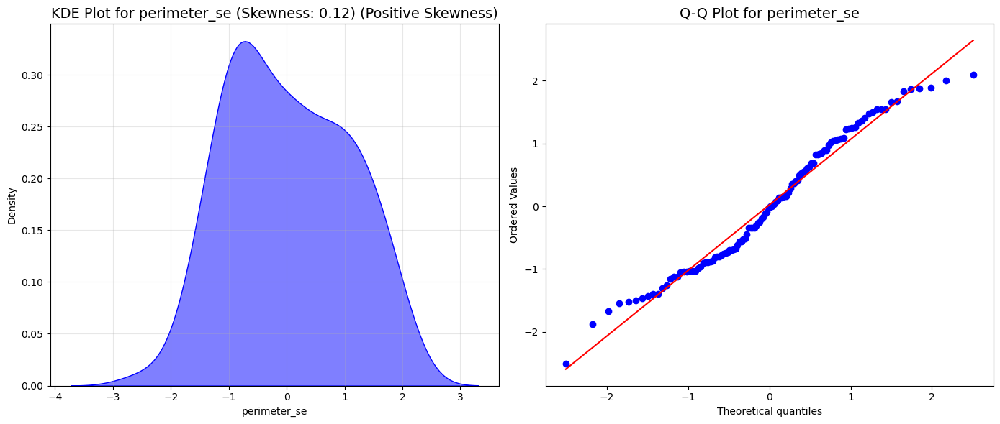

area_se: Skewness = 0.20 (Positive Skewness)


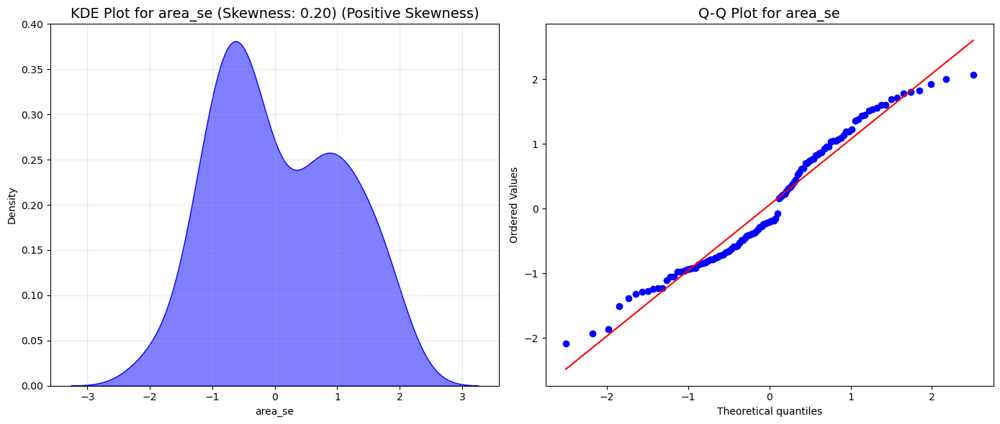

smoothness_se: Skewness = 0.17 (Positive Skewness)


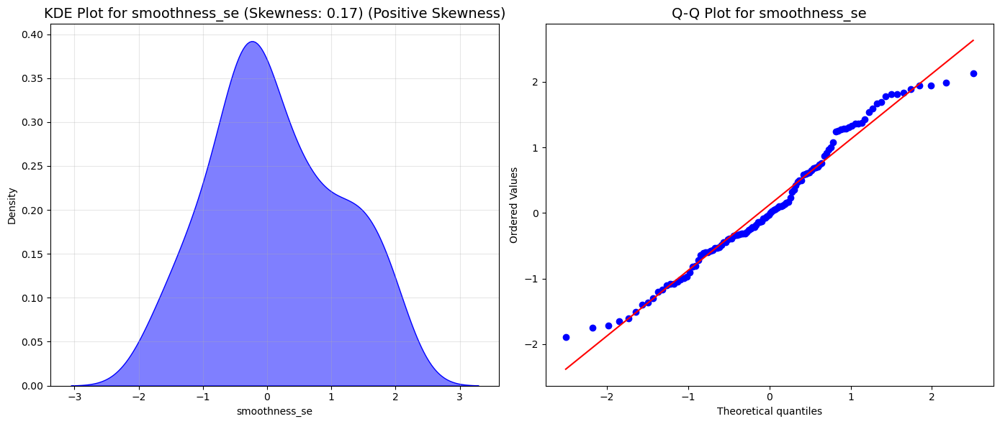

compactness_se: Skewness = 0.15 (Positive Skewness)


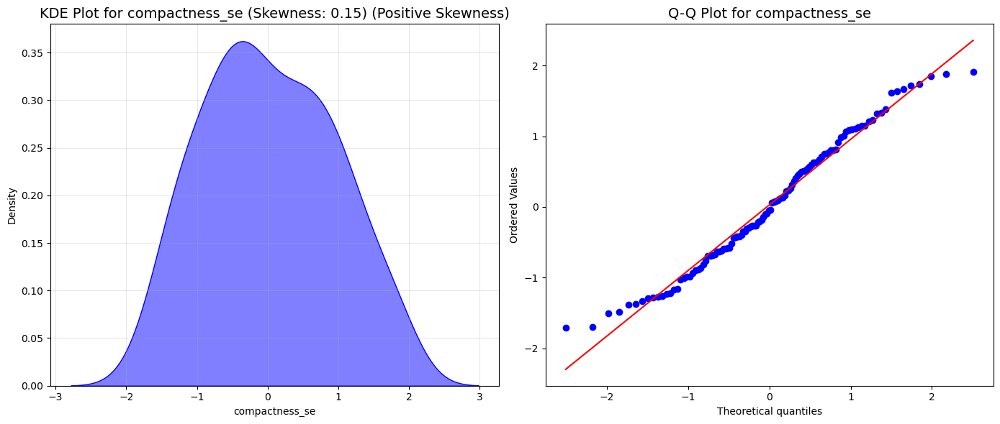

concavity_se: Skewness = 0.03 (Positive Skewness)


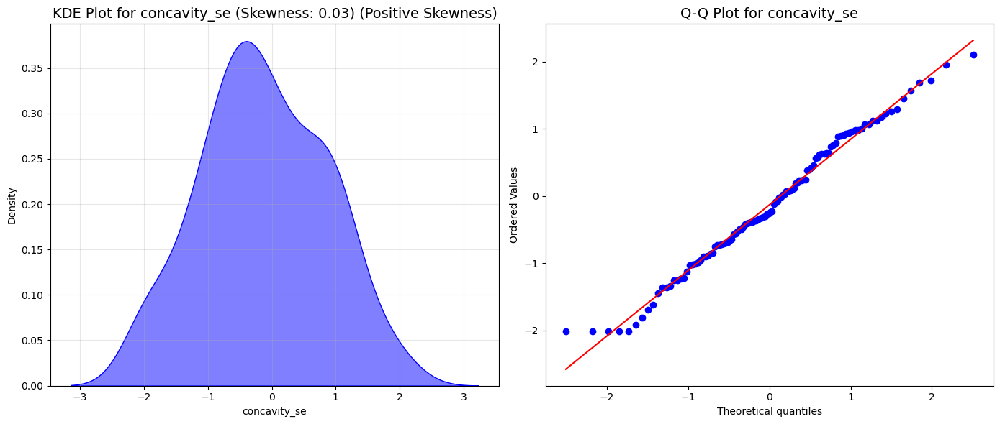

concave points_se: Skewness = -0.46 (Negative Skewness)


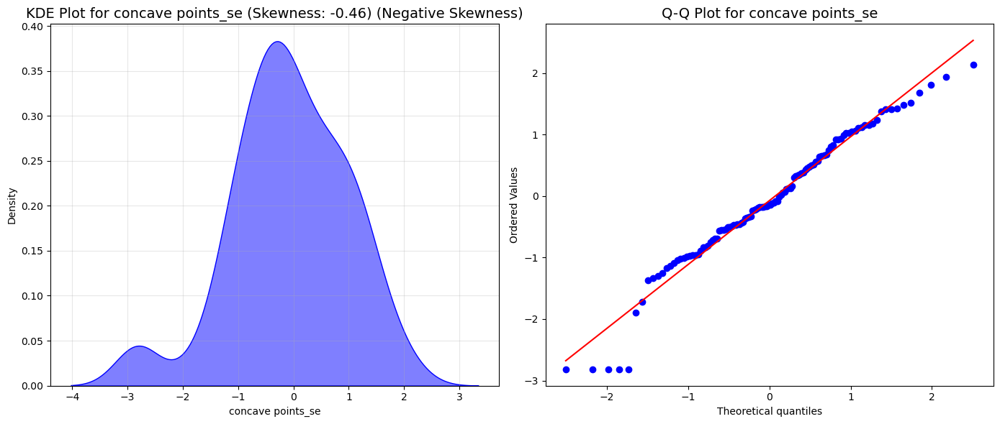

symmetry_se: Skewness = 0.08 (Positive Skewness)


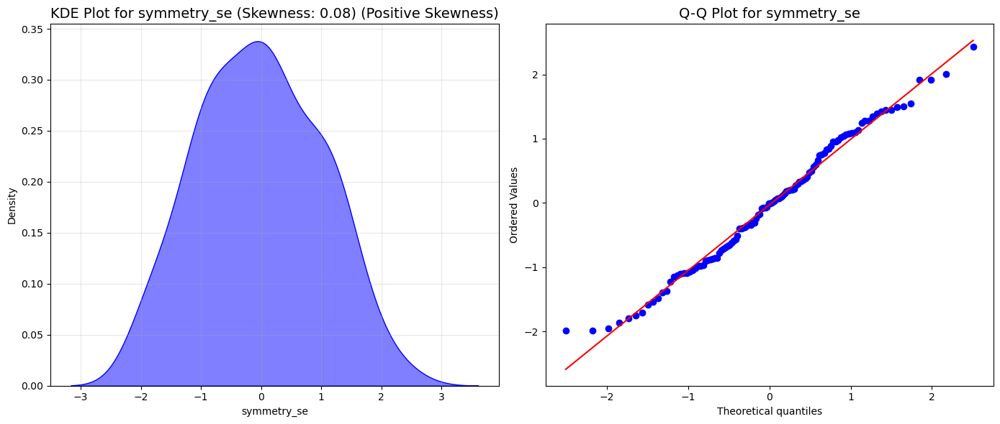

fractal_dimension_se: Skewness = 0.32 (Positive Skewness)


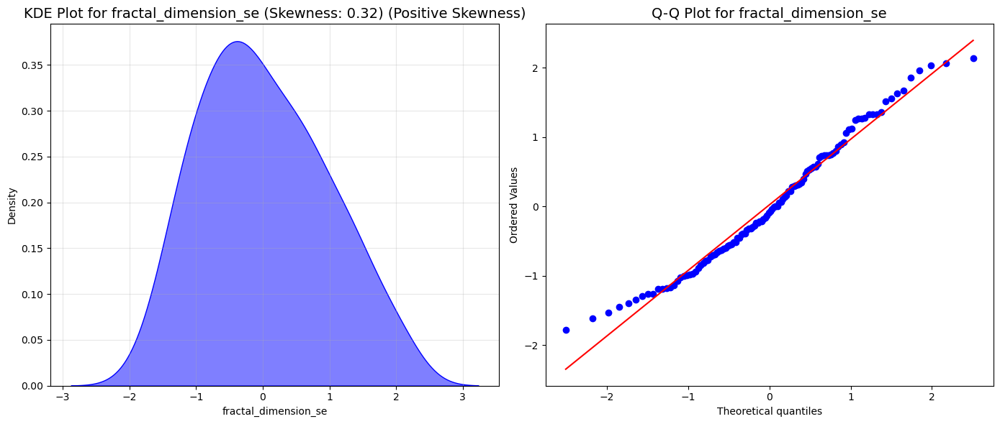

radius_worst: Skewness = -0.01 (Negative Skewness)


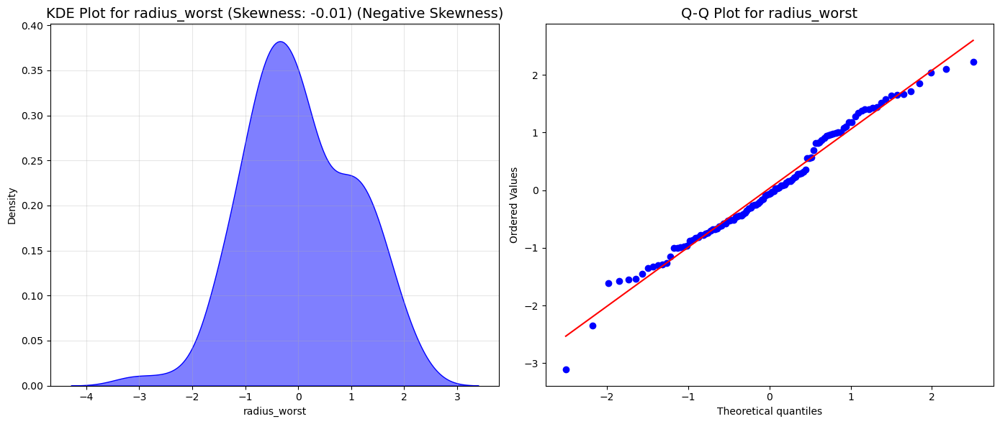

texture_worst: Skewness = -0.04 (Negative Skewness)


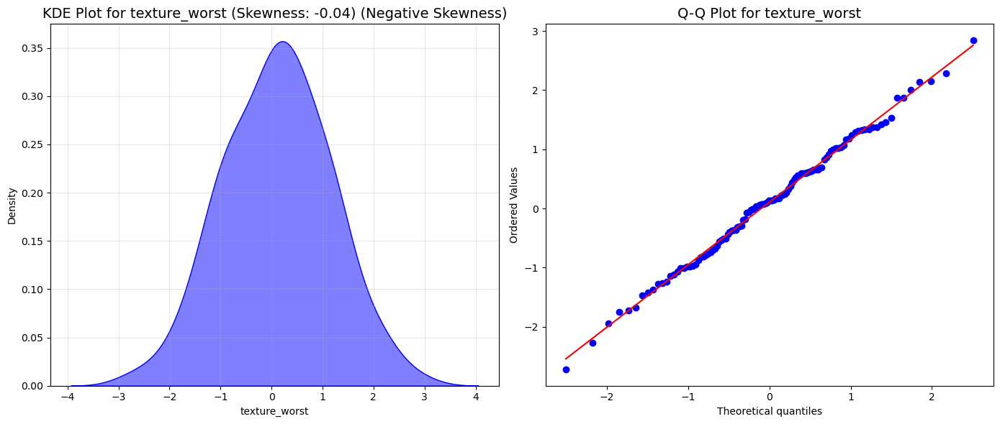

perimeter_worst: Skewness = -0.01 (Negative Skewness)


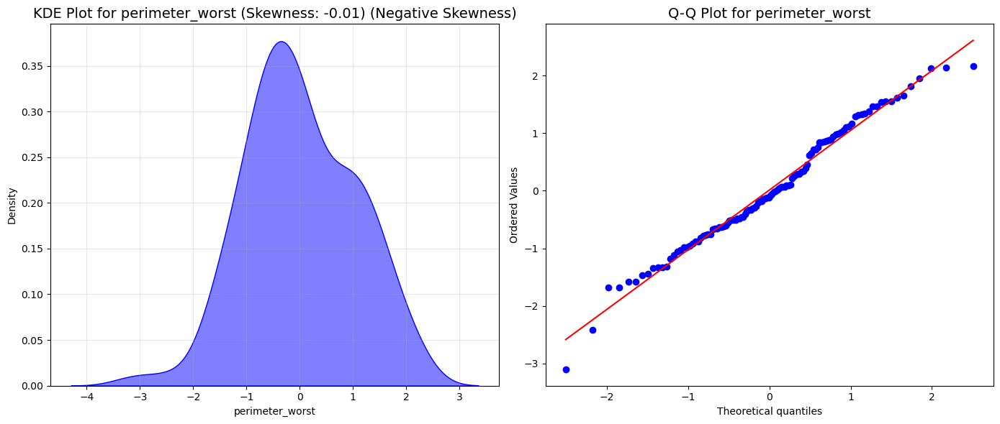

area_worst: Skewness = -0.04 (Negative Skewness)


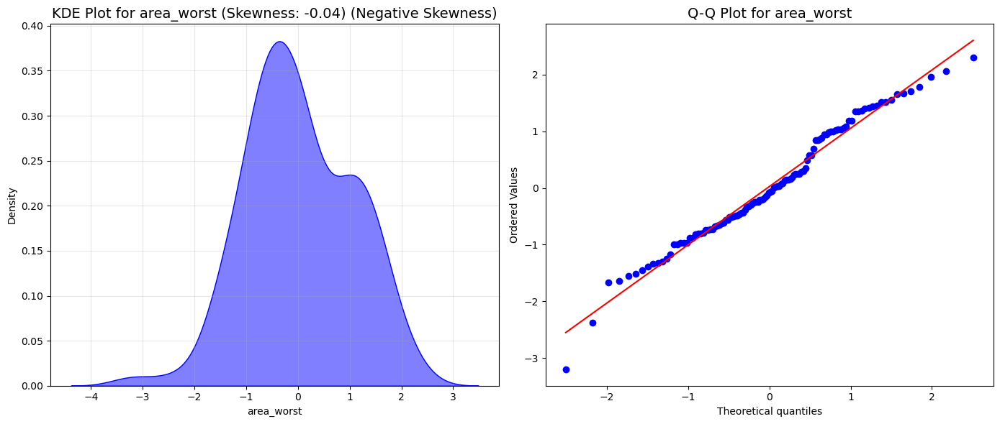

smoothness_worst: Skewness = 0.09 (Positive Skewness)


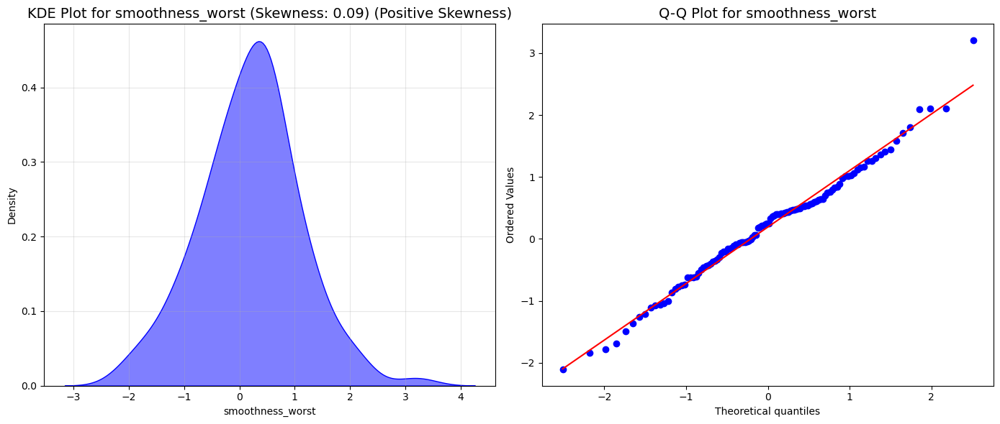

compactness_worst: Skewness = 0.31 (Positive Skewness)


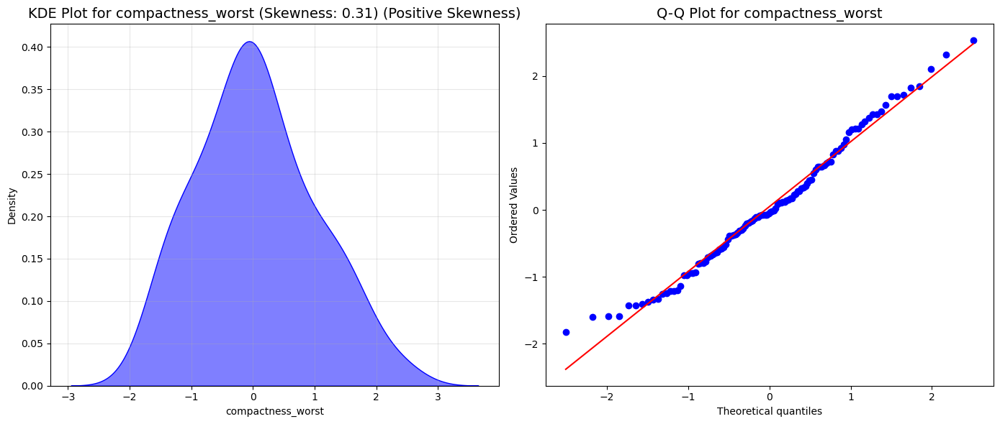

concavity_worst: Skewness = 0.10 (Positive Skewness)


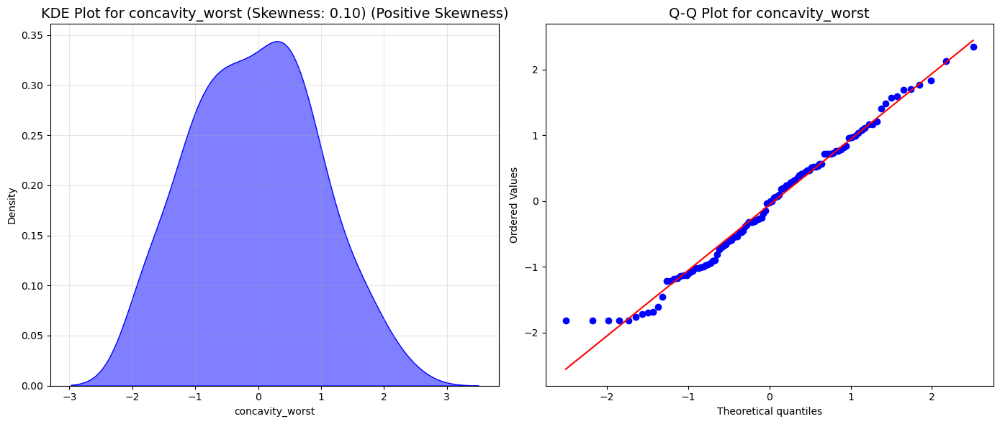

concave points_worst: Skewness = -0.08 (Negative Skewness)


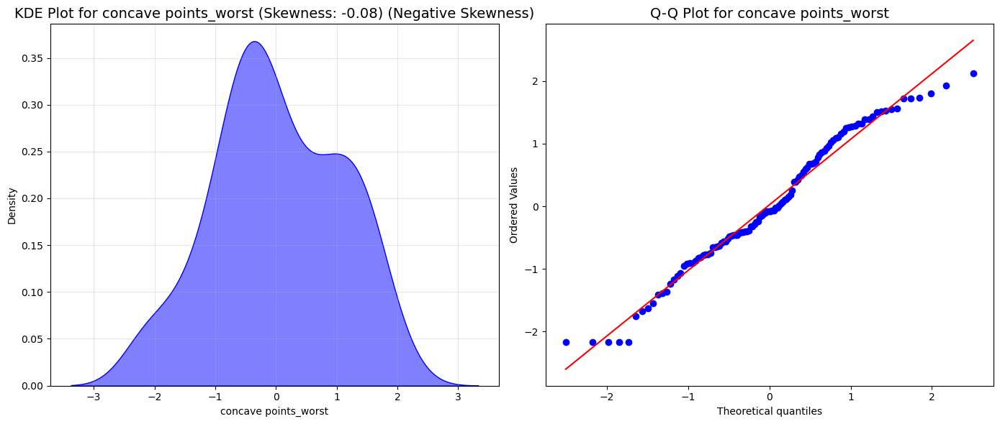

symmetry_worst: Skewness = -0.15 (Negative Skewness)


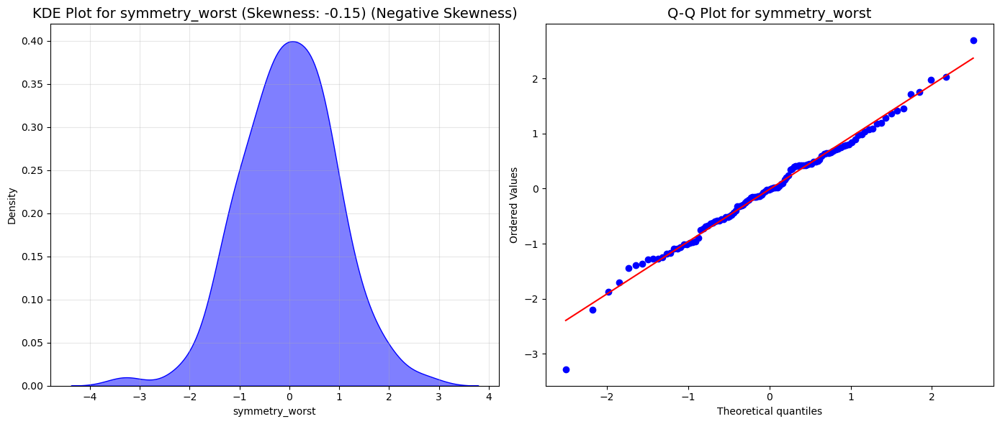

fractal_dimension_worst: Skewness = 0.21 (Positive Skewness)


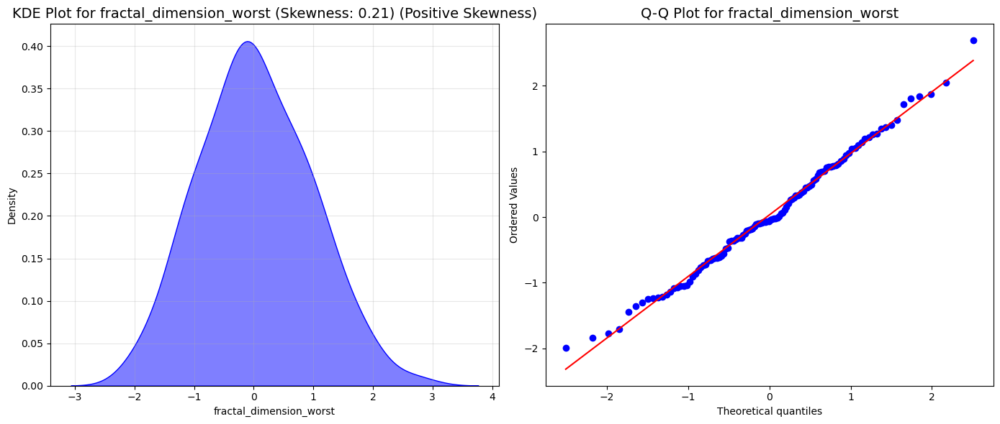

In [21]:
# Loop through each column in the DataFrame
for column in X_test_transformed.columns:
    if np.issubdtype(X_test_transformed[column].dtype, np.number):  # Check if the column is numeric
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))  # Create a side-by-side plot
        
        skewness = X_test_transformed[column].skew()
        
        # Determine skewness type
        if skewness > 0:
            skew_type = "Positive Skewness"
        elif skewness < 0:
            skew_type = "Negative Skewness"
        else:
            skew_type = "Approximately Symmetrical"
        
        print(f"{column}: Skewness = {skewness:.2f} ({skew_type})")
        # KDE plot
        sns.kdeplot(X_test_transformed[column].dropna(), fill=True, color='blue', alpha=0.5, ax=axes[0])
        skewness = X_test_transformed[column].skew()  # Calculate skewness
        axes[0].set_title(f"KDE Plot for {column} (Skewness: {skewness:.2f}) ({skew_type})", fontsize=14)
        axes[0].set_xlabel(column)
        axes[0].set_ylabel('Density')
        axes[0].grid(alpha=0.3)
        
        # Q-Q plot
        stats.probplot(X_test_transformed[column].dropna(), dist="norm", plot=axes[1])
        axes[1].set_title(f"Q-Q Plot for {column}", fontsize=14)
        
        plt.tight_layout()
        plt.show()

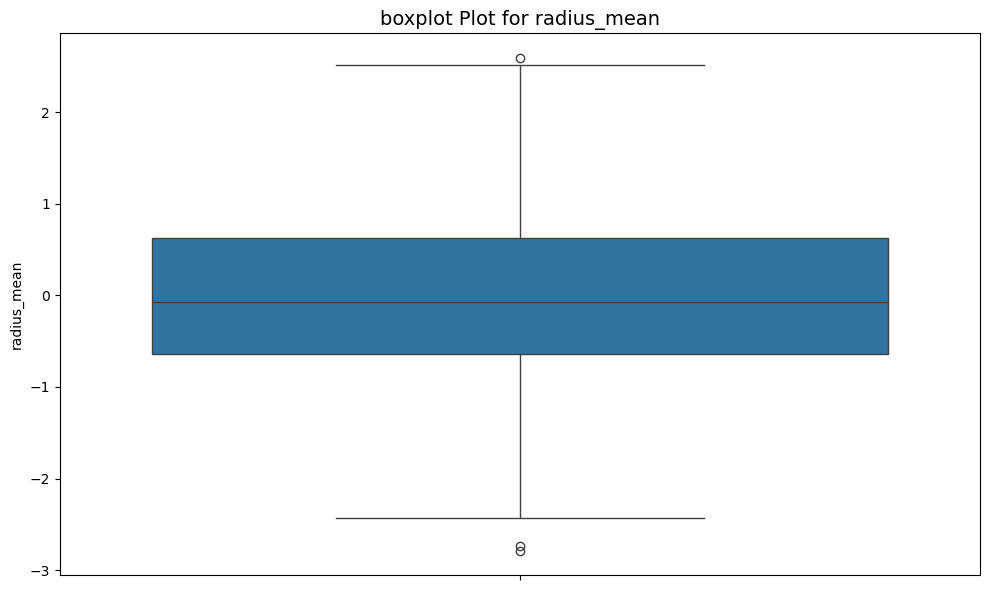

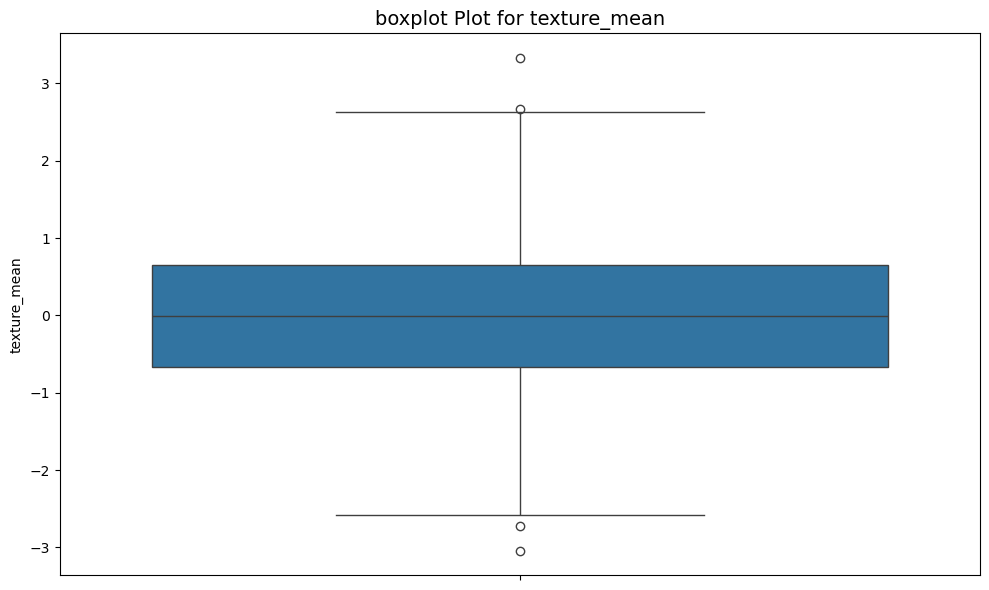

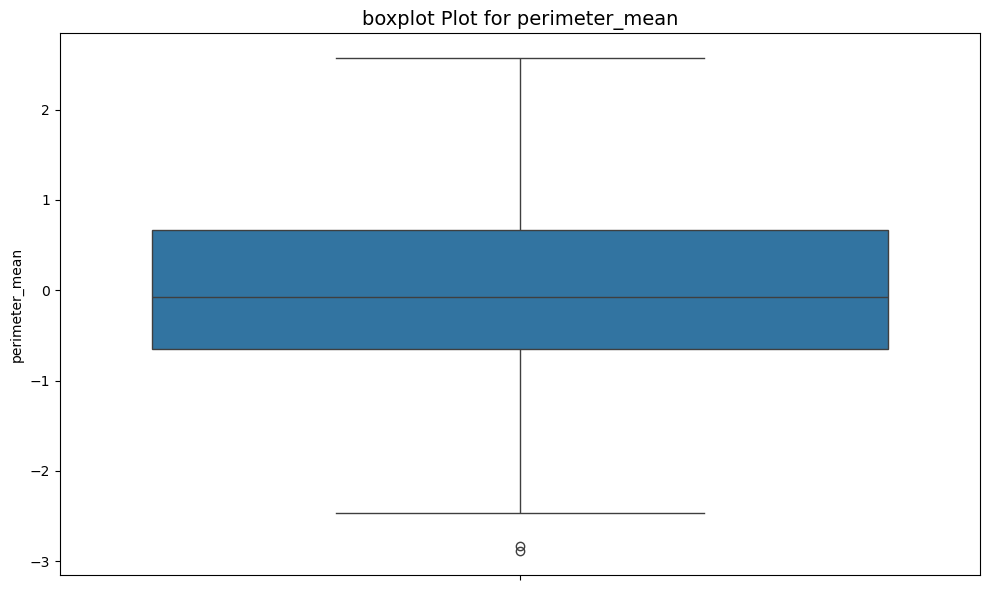

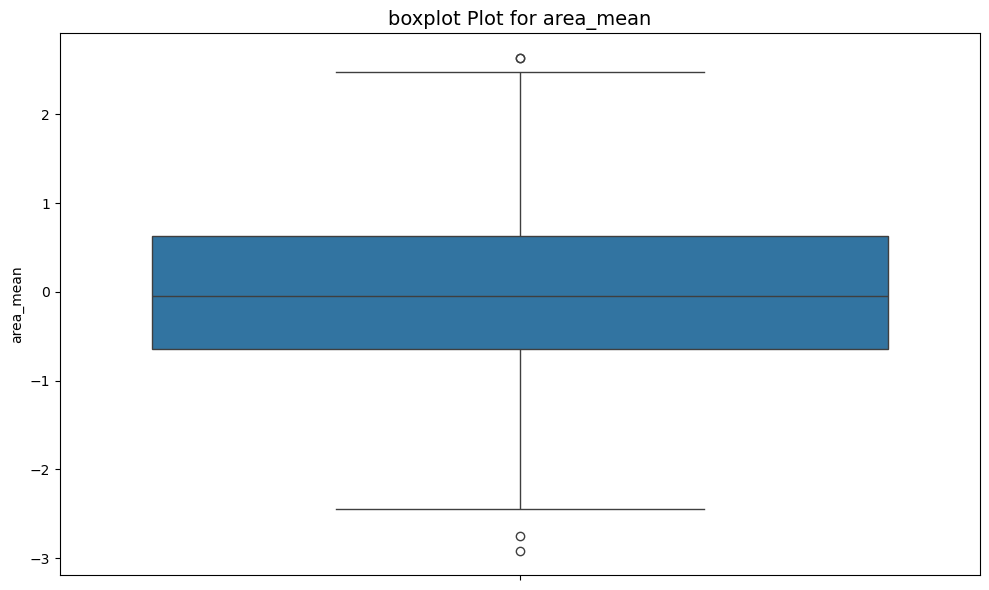

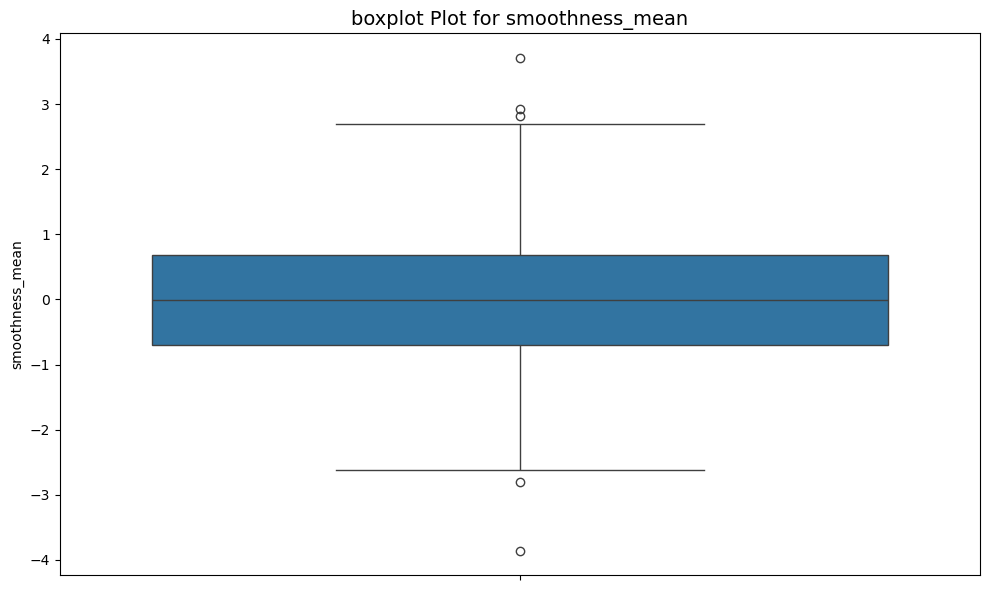

...

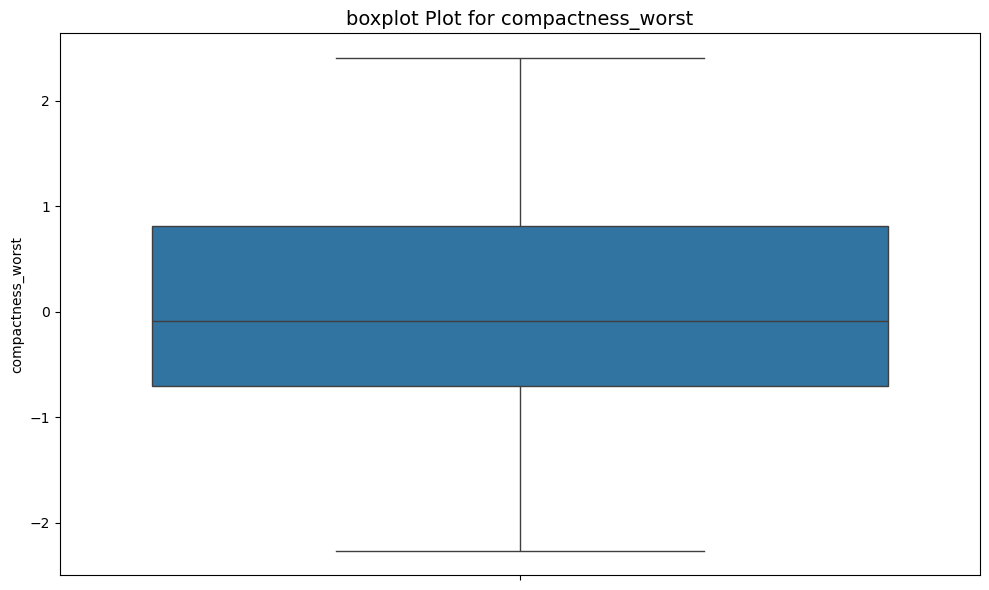

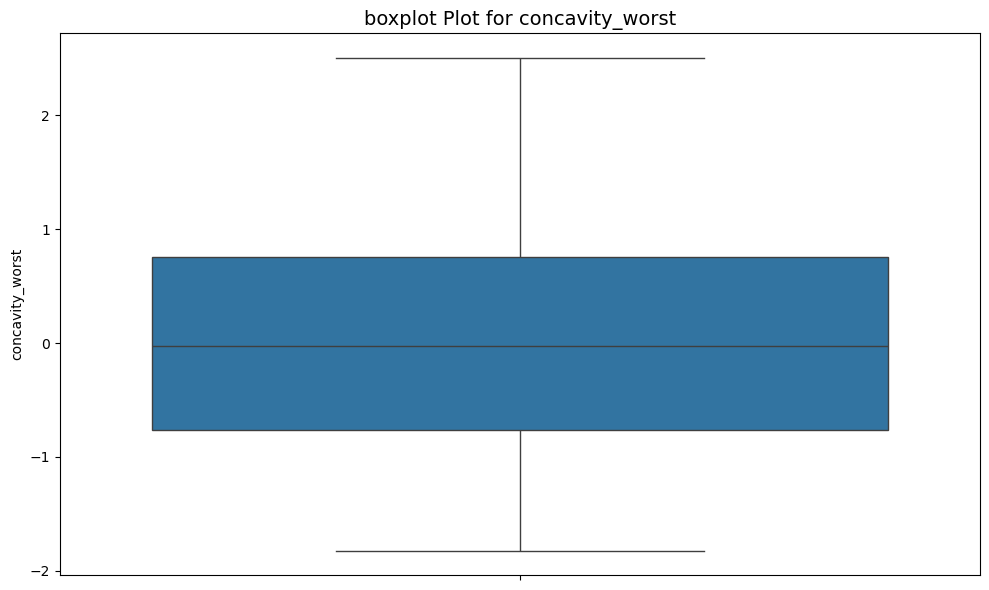

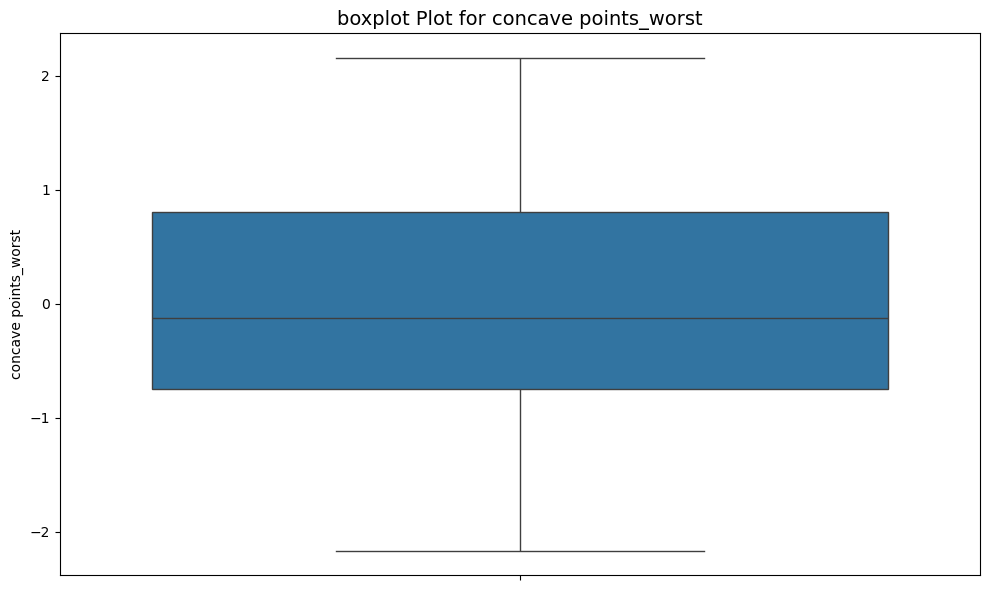

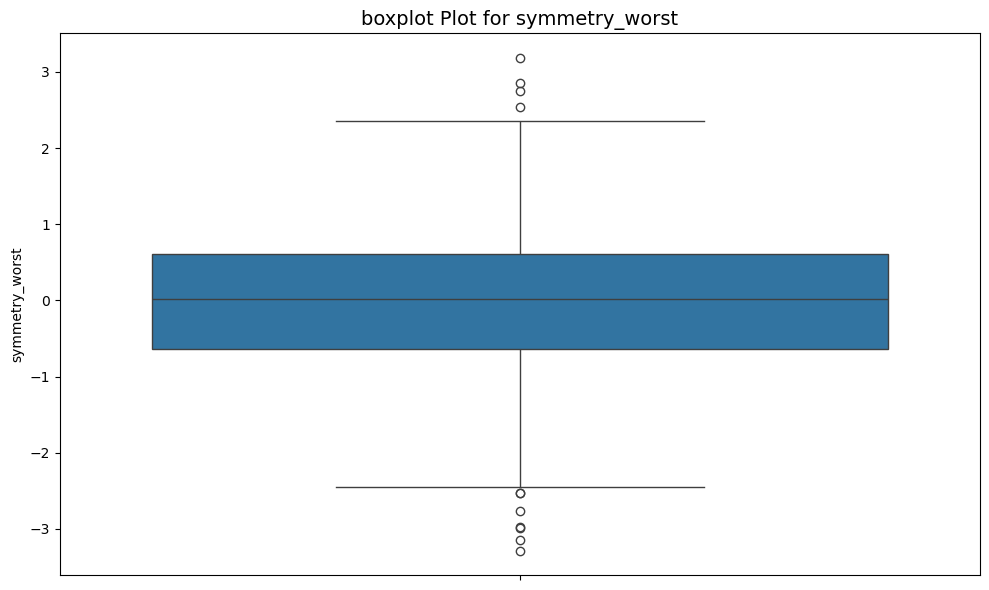

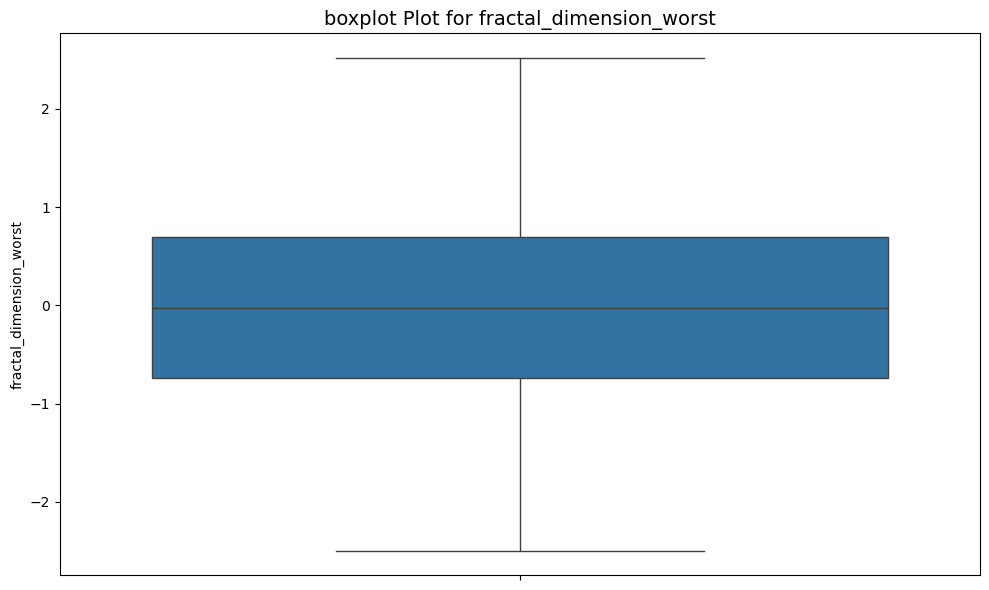

In [22]:
# Loop through each column in the DataFrame
for column in X_train_transformed.columns:
    if np.issubdtype(X_train_transformed[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X_train_transformed[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

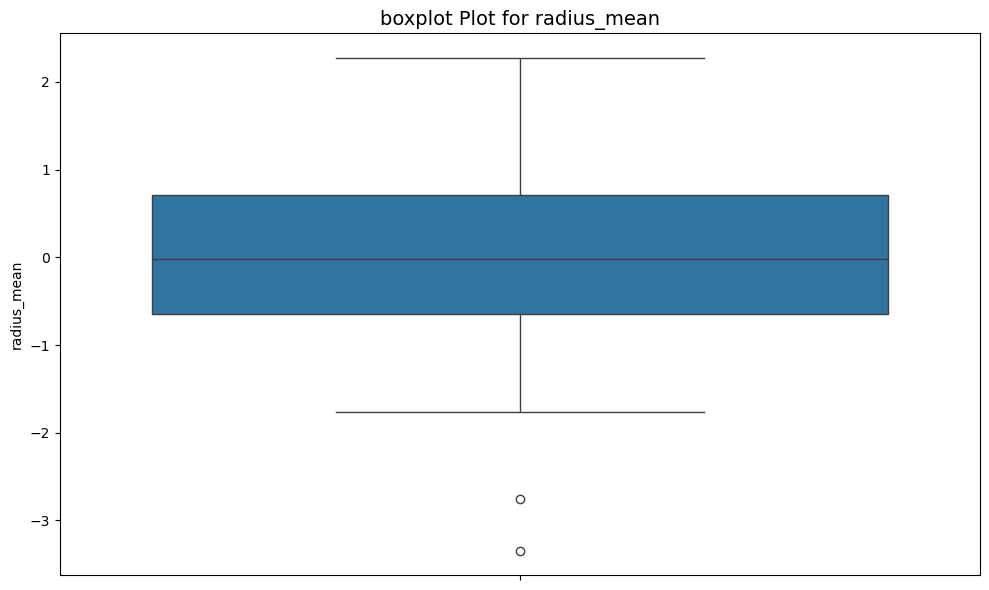

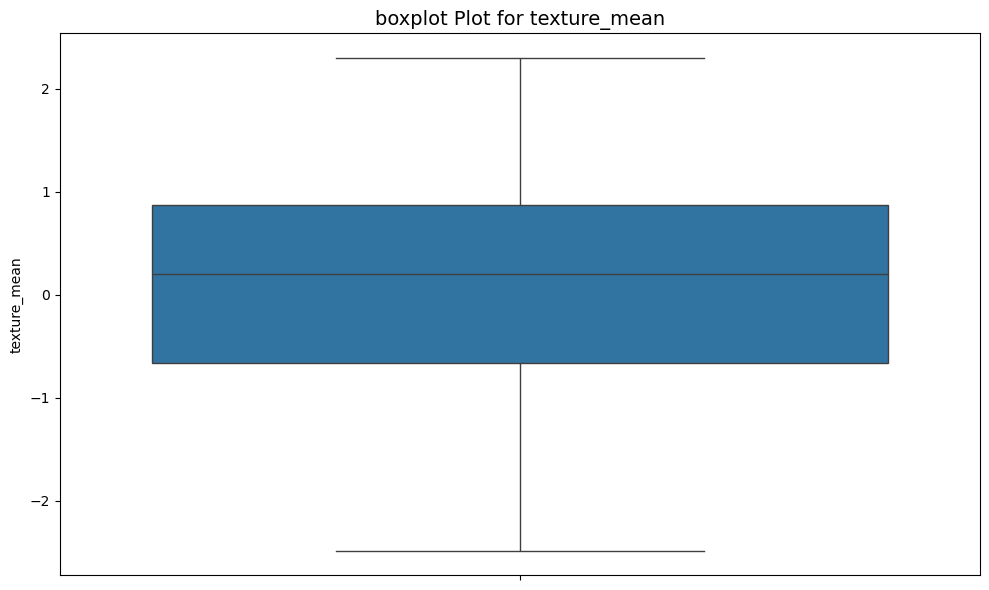

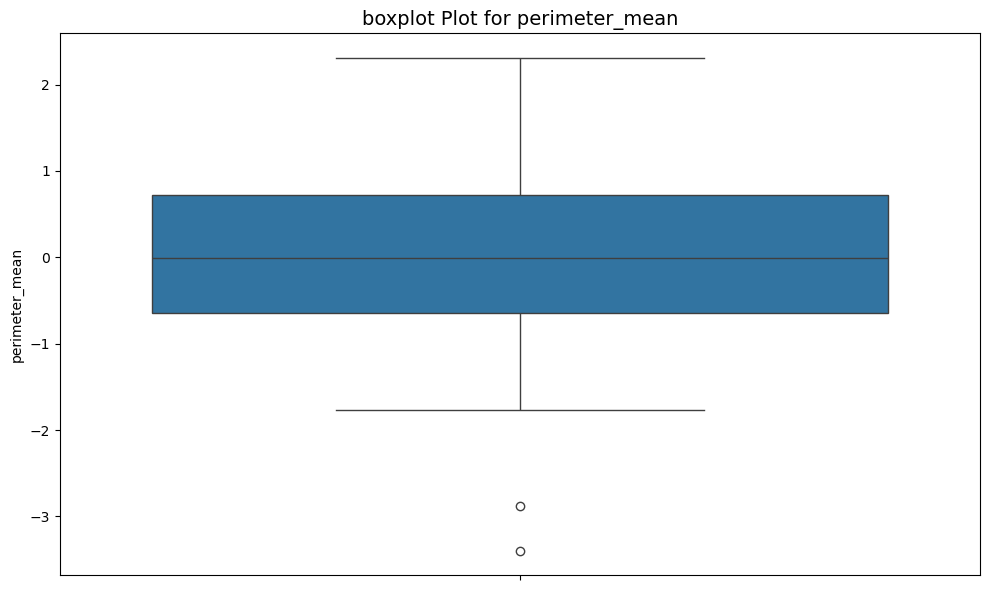

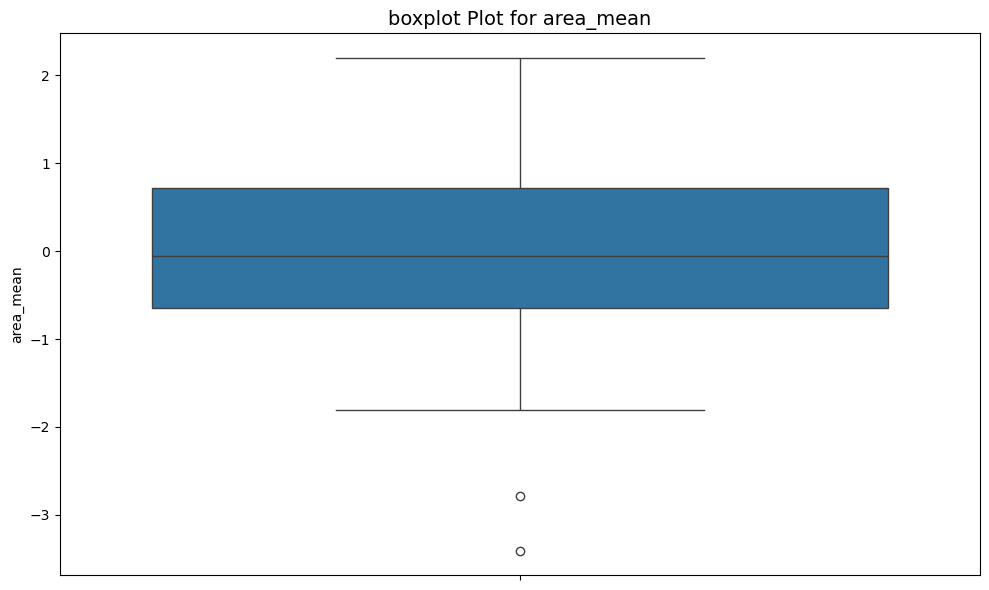

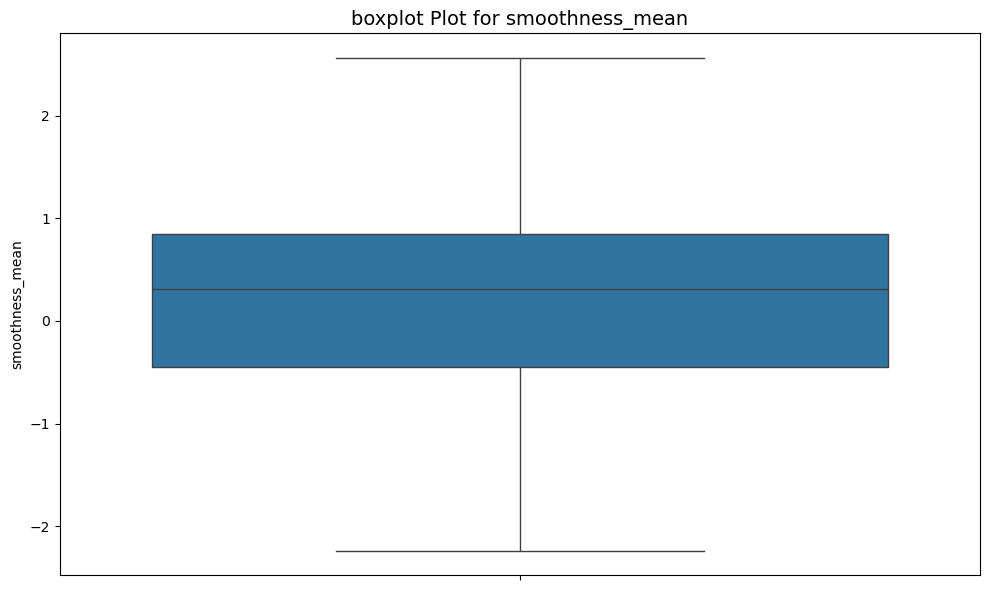

...

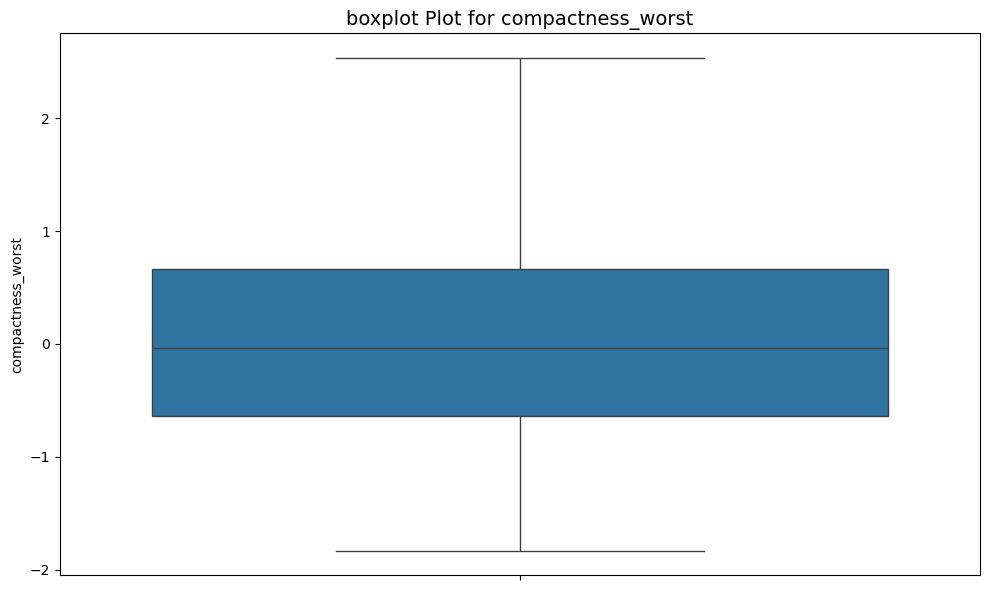

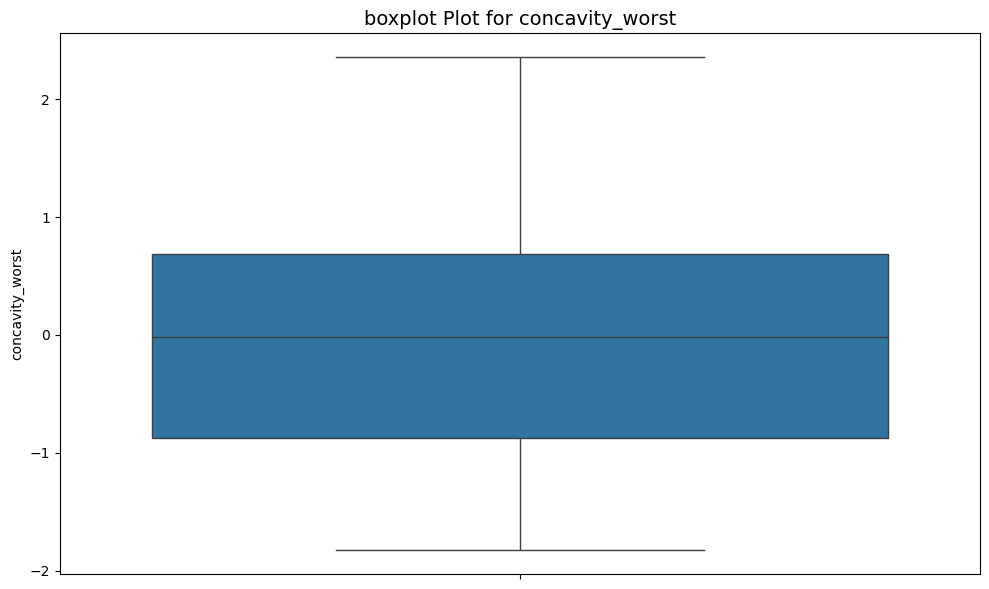

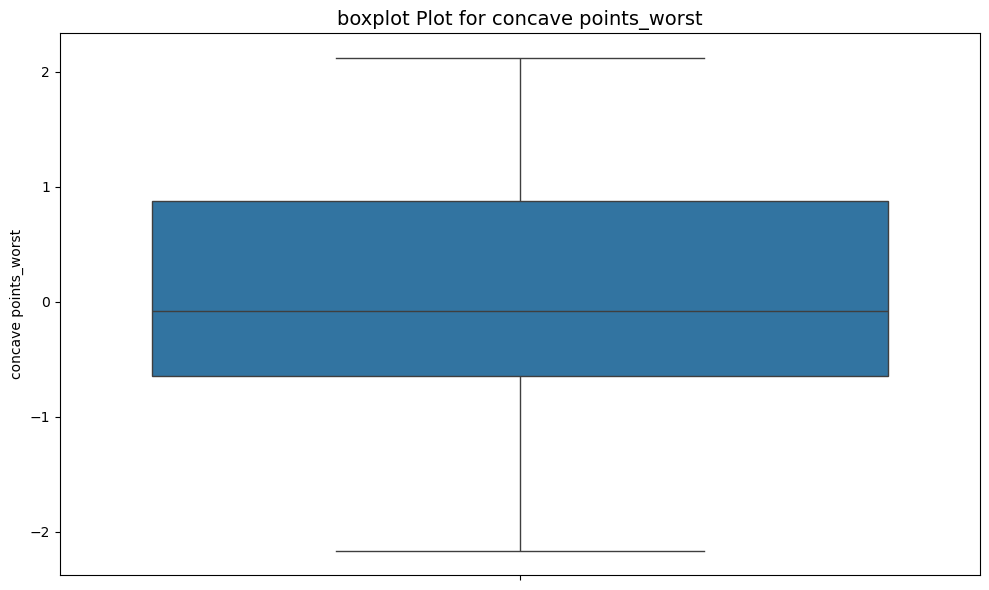

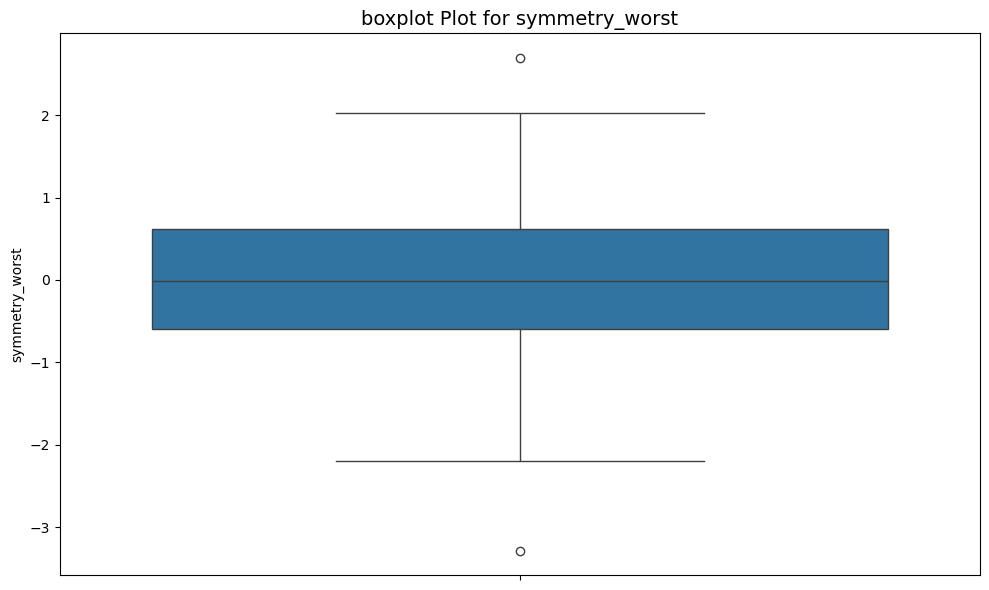

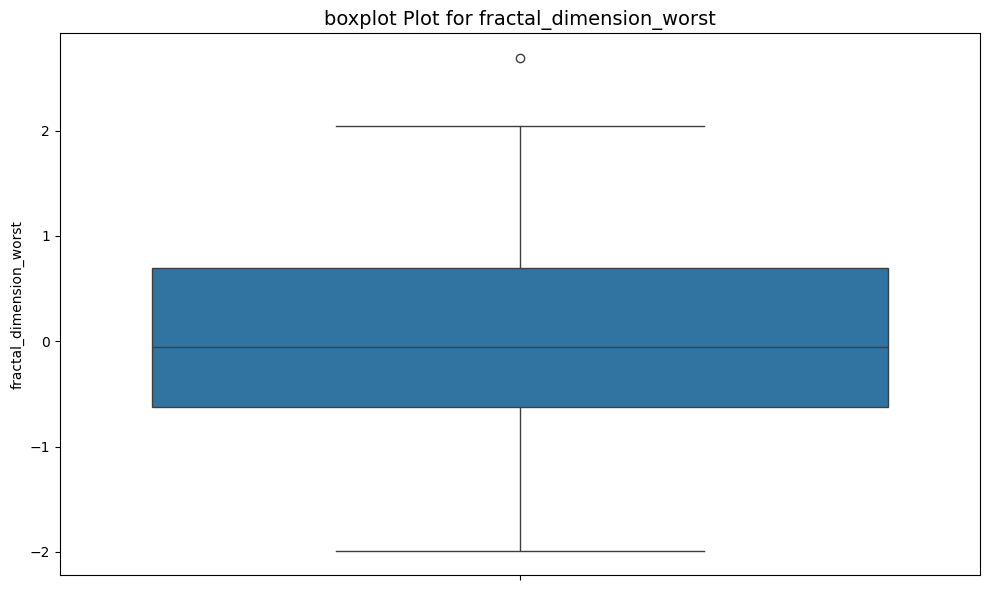

In [23]:
# Loop through each column in the DataFrame
for column in X_test_transformed.columns:
    if np.issubdtype(X_test_transformed[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X_test_transformed[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [24]:
# Function to cap outliers using IQR
def cap_outliers_iqr(df):
    df_capped = df.copy()  # Make a copy to avoid modifying the original DataFrame

    # Loop through numeric columns and cap outliers based on IQR
    for column in df_capped.select_dtypes(include=[np.number]).columns:
        Q1 = df_capped[column].quantile(0.25)
        Q3 = df_capped[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Cap values outside the bounds to the lower or upper bound
        df_capped[column] = np.clip(df_capped[column], lower_bound, upper_bound)

    return df_capped

In [25]:
# Fit and transform the data
X_train_transformed_out = cap_outliers_iqr(X_train_transformed)
X_test_transformed_out = cap_outliers_iqr(X_test_transformed)

In [61]:
X_test_transformed_out.shape,X_train_transformed_out.shape

((114, 30), (455, 30))

In [65]:
# Convert the transformed data back to a DataFrame (keeping original column names)
X_train_transformed_out_df = pd.DataFrame(X_train_transformed_out, columns=X_train_transformed.columns)
X_test_transformed_out_df = pd.DataFrame(X_test_transformed_out, columns=X_test_transformed.columns)
X_train_transformed_out_df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,-1.916535,-0.352411,-1.802848,-1.883764,0.820044,0.901411,1.903073,0.136915,1.118094,1.983966,...,-1.692201,-0.405235,-1.746461,-1.680205,0.762864,1.261414,2.504454,0.980344,1.849870,1.674025
1,1.699088,1.593731,1.756689,1.608284,1.295858,2.210581,1.675694,1.885634,1.874970,1.510829,...,1.756155,1.269366,1.709411,1.703855,0.798725,2.146080,1.642220,2.151342,1.728193,1.938065
2,-1.834107,-1.385035,-1.768097,-1.780265,-1.416490,-0.143822,-0.172040,-0.700786,1.743645,1.089515,...,-1.839596,-1.069720,-1.739962,-1.793983,-1.536757,-0.467877,-0.592724,-1.006365,0.761014,0.288920
3,-1.086072,1.358717,-1.099777,-1.082211,0.127551,-0.536485,-0.974966,-0.965221,0.424666,0.272557,...,-0.886628,1.491834,-0.965592,-0.894508,0.830451,-0.754720,-0.796734,-0.797347,0.938374,0.066121
4,-1.311450,-1.055986,-1.345718,-1.337685,1.252881,-0.316012,-1.329978,-1.127971,2.601464,1.086260,...,-1.370059,-1.453761,-1.447588,-1.375617,-0.113859,-1.233275,-1.598342,-1.545276,1.131296,-0.021413
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450,-1.999134,-1.131270,-1.802848,-1.951191,0.218280,1.074422,0.274754,-0.406312,0.442258,2.437032,...,-1.982307,-1.870241,-1.967177,-2.012793,-0.424965,0.180870,-0.566078,-1.068058,-1.199472,1.392528
451,-0.665790,-0.094536,-0.646474,-0.681608,1.301974,0.179660,0.024490,-0.169913,0.072796,0.548204,...,-0.584700,0.677922,-0.587257,-0.605346,1.540553,0.342763,0.300554,0.246592,-0.016340,0.638842
452,0.235167,-0.489969,0.125248,0.240429,-2.623821,-2.090191,-1.435776,-1.487341,-1.188348,-1.613082,...,-0.076069,-0.783179,-0.204257,-0.063118,-2.235559,-1.899227,-1.432553,-1.377164,-0.720811,-1.734573
453,0.143300,0.217211,0.161415,0.129694,0.780477,0.416479,0.639431,0.716267,-0.458032,0.580903,...,0.414728,0.901338,0.453734,0.373747,1.267586,0.891293,0.829881,1.074757,0.608554,1.288682


In [67]:
X_train_transformed_out_df.shape,X_test_transformed_out_df.shape

((455, 30), (114, 30))

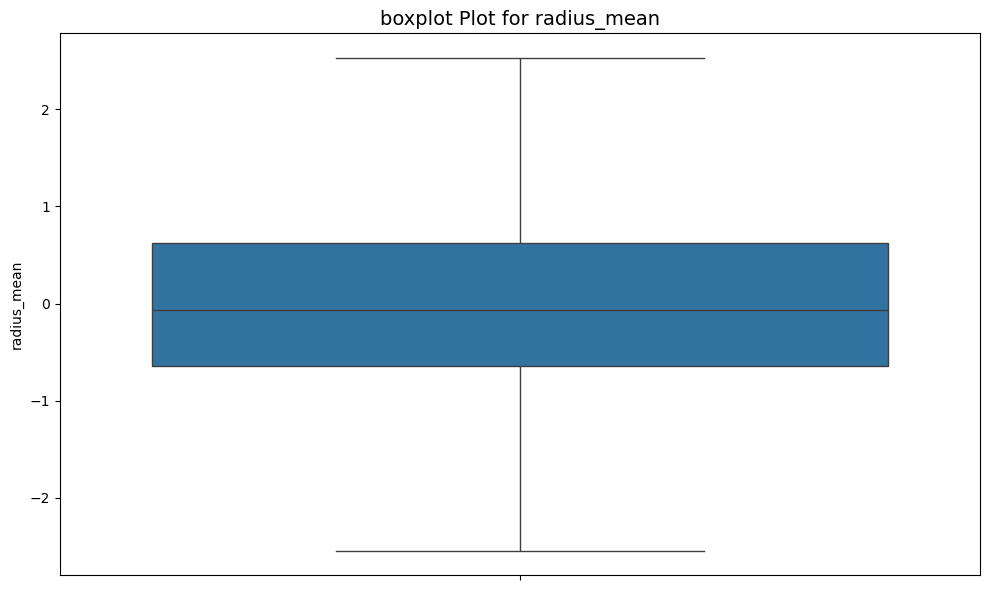

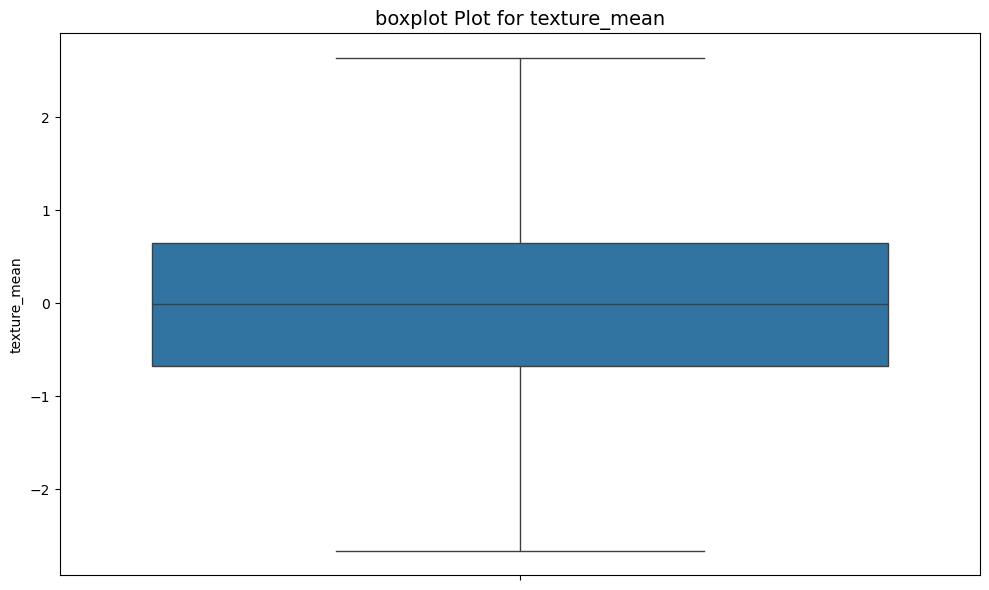

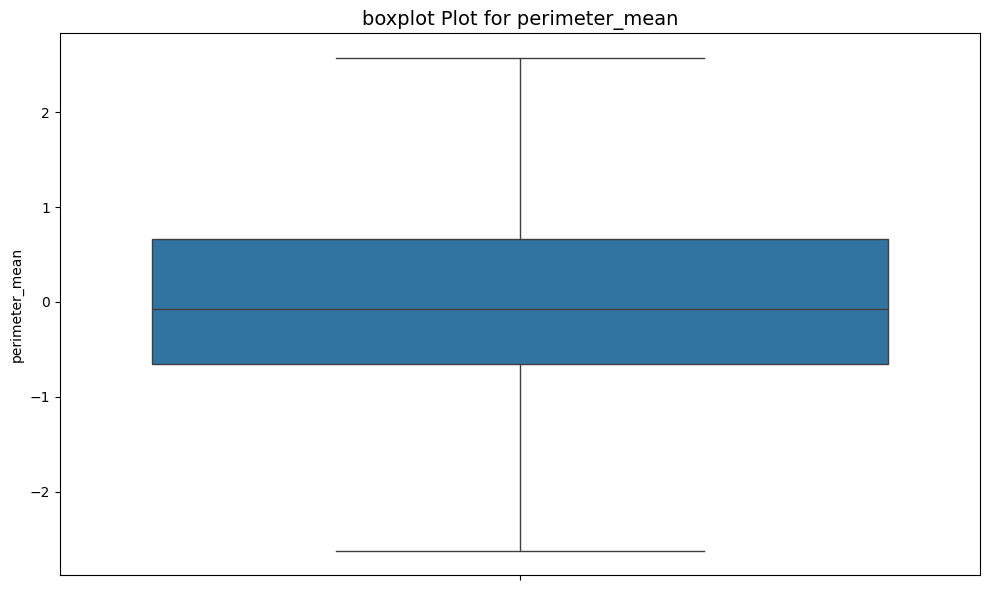

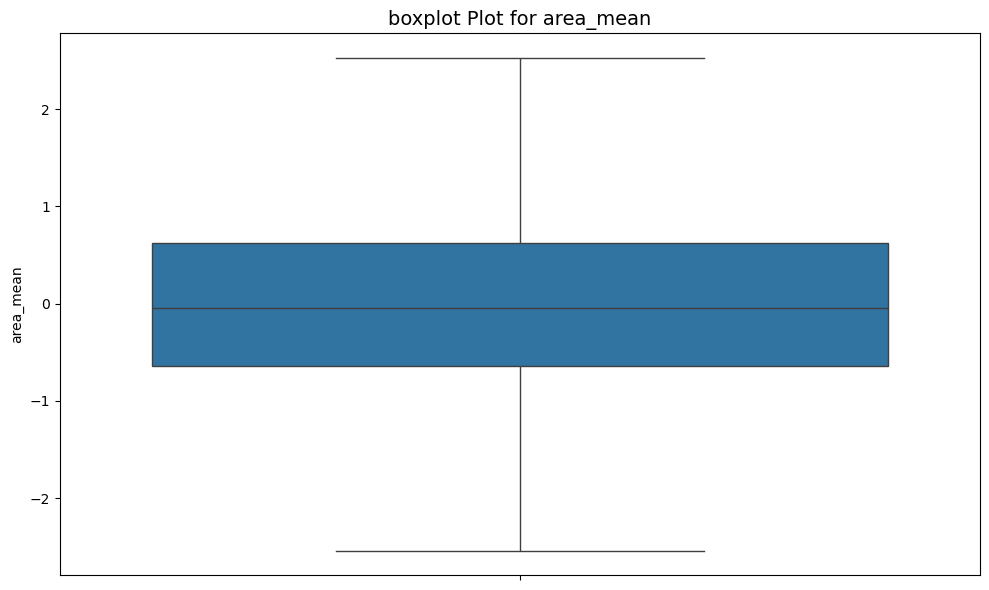

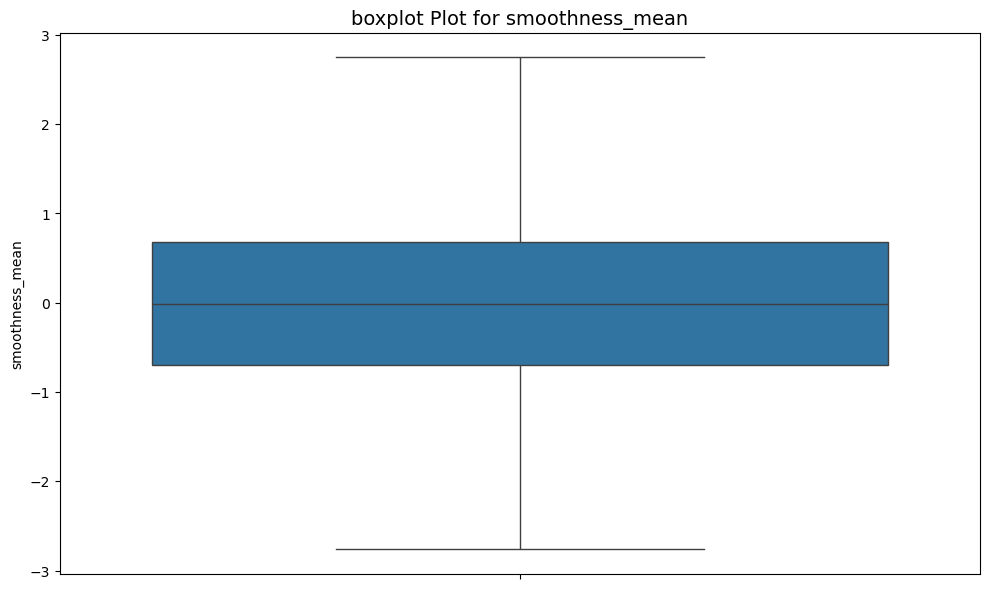

...

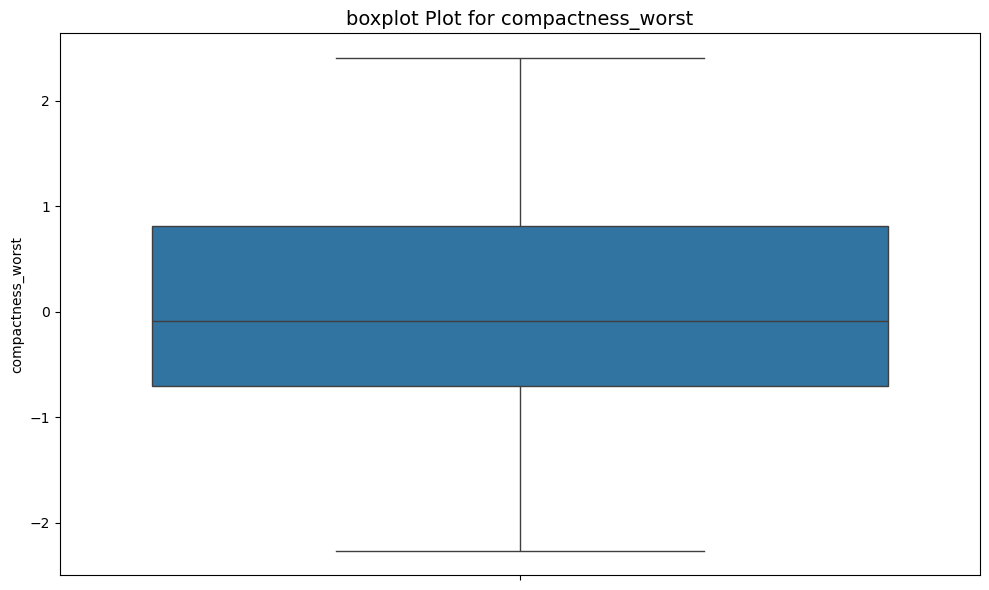

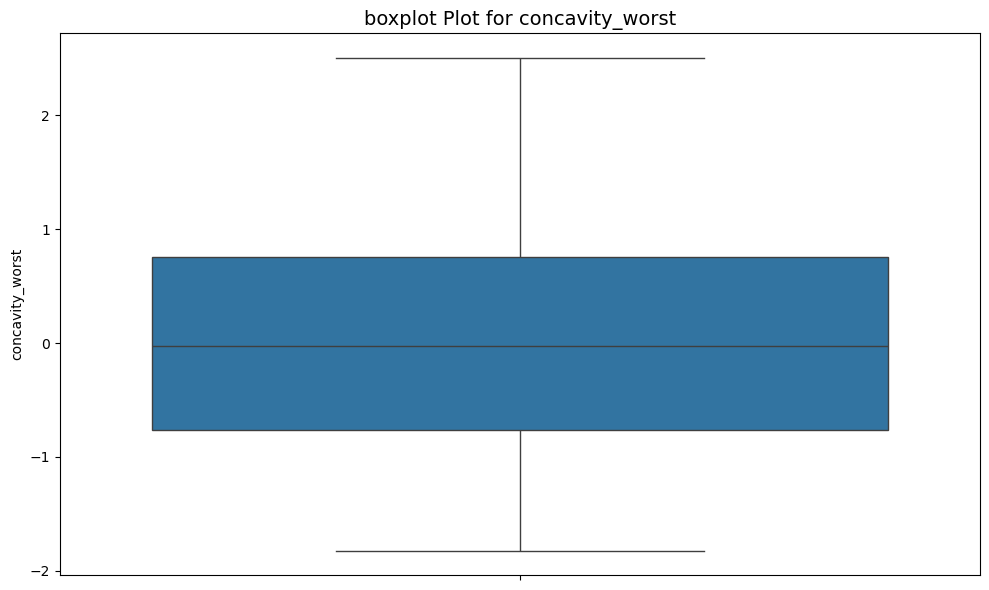

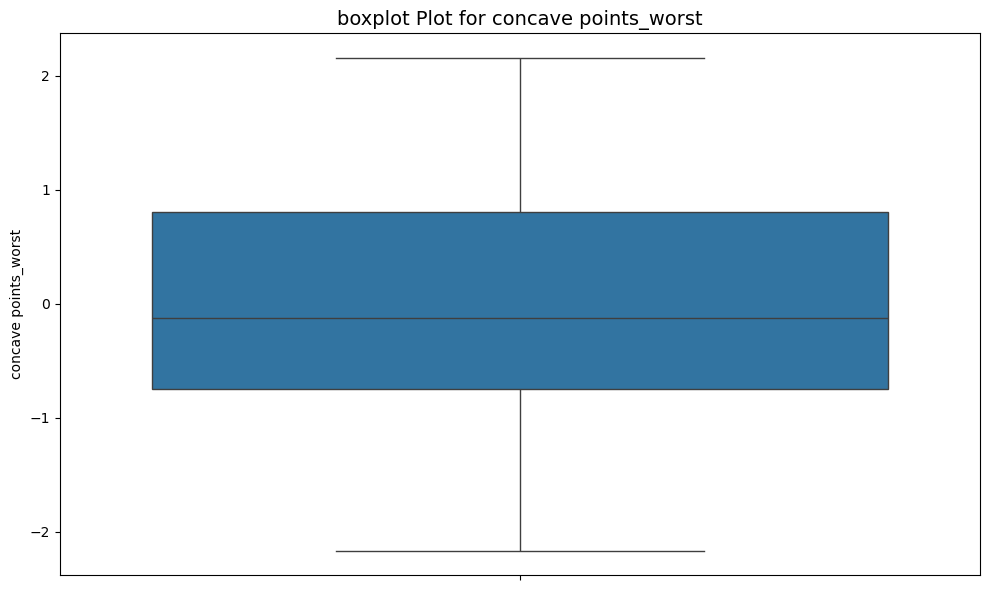

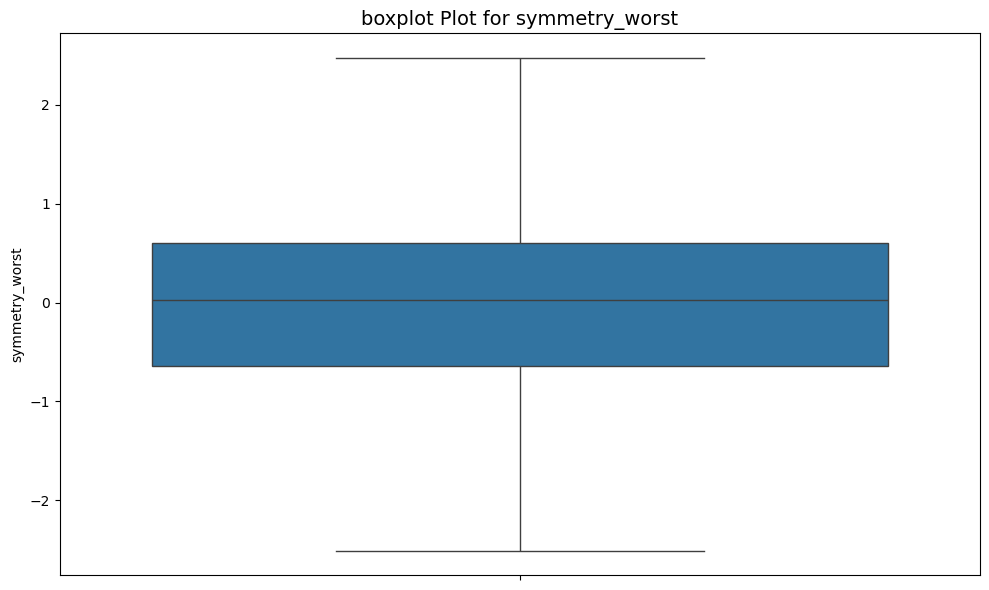

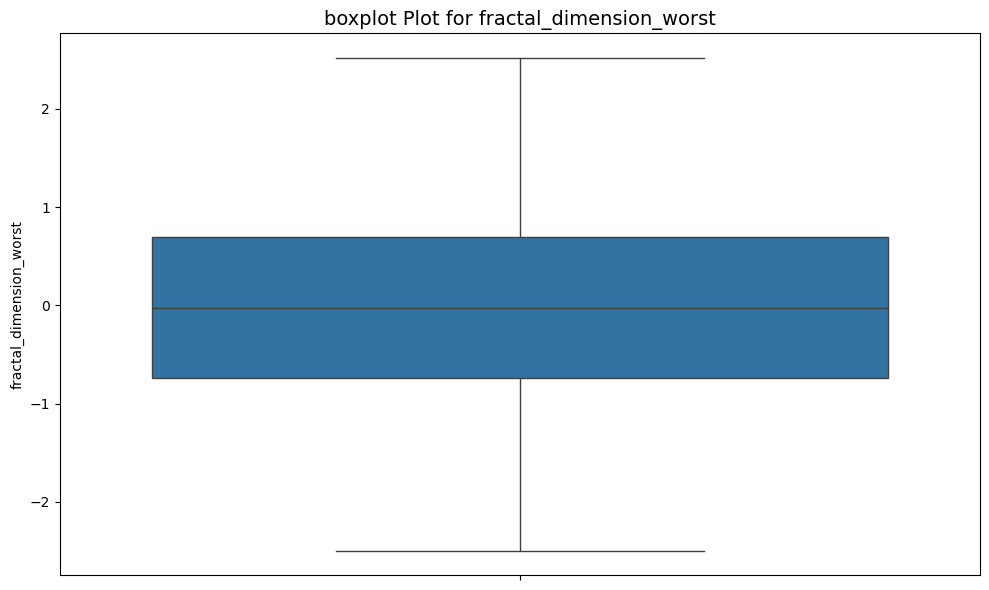

In [69]:
for column in X_train_transformed_out_df.columns:
    if np.issubdtype(X_train_transformed_out_df[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X_train_transformed_out_df[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [70]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

scaler.fit(X_train_transformed_out_df)

X_train_scaled = scaler.transform(X_train_transformed_out_df)
X_test_scaled = scaler.transform(X_test_transformed_out_df)

In [73]:
X_test_scaled.shape

(114, 30)

In [75]:
y_test.shape

(114,)

In [77]:
from sklearn.preprocessing import OneHotEncoder
trf2 = ColumnTransformer([
    ('diagnosis_encoded',OneHotEncoder(sparse_output=False,handle_unknown='ignore'),None)
],remainder='passthrough')

In [79]:
y_train_en = pd.get_dummies(y_train, columns=['diagnosis'], drop_first=True,dtype=int).values
y_test_en = pd.get_dummies(y_test, columns=['diagnosis'], drop_first=True,dtype=int).values

In [81]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [83]:
# Initialize the KNN model (you can adjust n_neighbors)
knn = KNeighborsClassifier(n_neighbors=3)

In [85]:
# Fit the model to the training data
knn.fit(X_train_scaled, y_train_en.ravel())

KNeighborsClassifier(n_neighbors=3)

In [87]:
# Predict on the test set
y_pred = knn.predict(X_test_scaled)

In [89]:
y_pred

array([0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1])

In [119]:
y_test

204    B
70     M
131    M
431    B
540    B
      ..
486    B
75     M
249    B
238    B
265    M
Name: diagnosis, Length: 114, dtype: object

In [129]:
y_test_en.ravel()

array([0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1])

In [105]:
# Evaluate the model accuracy
accuracy = accuracy_score(y_test_en, y_pred)

In [107]:
accuracy

0.956140350877193

In [109]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_test_en, y_pred)

In [111]:
cm

array([[68,  3],
       [ 2, 41]], dtype=int64)

In [135]:
def count_class(y, y_p):
    b = 0  # True Negative
    m = 0  # True Positive
    f = 0  # False Positive / False Negative (You can adjust based on your preference)
    
    # Loop over the actual labels (y) and predicted labels (y_p)
    for actual, predicted in zip(y, y_p):
        if actual == 0 and predicted == 0:
            b += 1  # True Negative
        elif actual == 1 and predicted == 1:
            m += 1  # True Positive
        else:
            f += 1  # False Positive or False Negative
    
    # Output the counts
    print('B (True Negative):', b)
    print('M (True Positive):', m)
    print('F (False):', f)

In [131]:
count_class(y_test_en.ravel(), y_pred)

B (True Negative): 68
M (True Positive): 41
F (False): 5


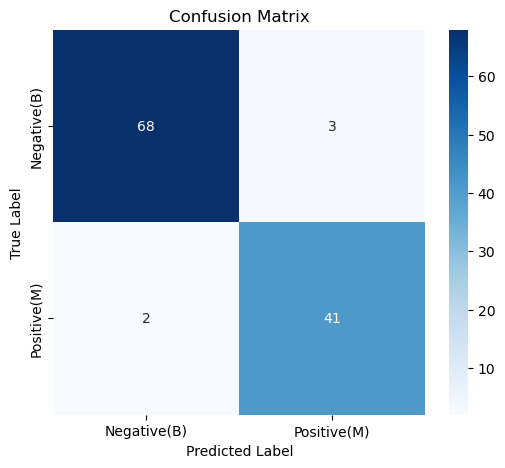

In [133]:
# Plot confusion matrix using seaborn heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Negative(B)', 'Positive(M)'], 
            yticklabels=['Negative(B)', 'Positive(M)'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [143]:
from sklearn.model_selection import cross_val_score
print(np.mean(cross_val_score(knn, X_train_scaled, y_train_en.ravel(), cv=10, scoring='accuracy')))
cross_val_score(knn, X_train_scaled, y_train_en.ravel(), cv=10, scoring='accuracy')

0.9736231884057972


array([1.        , 0.97826087, 0.97826087, 0.91304348, 1.        ,
       1.        , 0.97777778, 0.97777778, 0.97777778, 0.93333333])

In [157]:
from sklearn.model_selection import StratifiedKFold, cross_val_score

# Try different random_state values and evaluate using cross-validation
best_score = 0
best_random_state = None

for state in range(50):  # Try different random_state values (from 0 to 9)
    # Define the cross-validation strategy with random_state
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=state)
    
    # Perform cross-validation using cross_val_score
    scores = cross_val_score(knn, X_train_scaled,y_train_en.ravel(), cv=cv, scoring='accuracy')
    
    # Calculate the mean accuracy score for this random_state
    mean_score = np.mean(scores)
    
    print(f"Random state {state}: Mean accuracy = {mean_score:.4f}")
    
    # If the current random_state gives a better result, save it
    if mean_score > best_score:
        best_score = mean_score
        best_random_state = state

# Print the best random_state and its corresponding accuracy
print(f"\nBest random_state: {best_random_state} with mean accuracy = {best_score:.4f}")

Random state 0: Mean accuracy = 0.9758
Random state 1: Mean accuracy = 0.9671
Random state 2: Mean accuracy = 0.9737
Random state 3: Mean accuracy = 0.9715
Random state 4: Mean accuracy = 0.9691
Random state 5: Mean accuracy = 0.9735
Random state 6: Mean accuracy = 0.9736
Random state 7: Mean accuracy = 0.9736
Random state 8: Mean accuracy = 0.9737
Random state 9: Mean accuracy = 0.9692
Random state 10: Mean accuracy = 0.9715
Random state 11: Mean accuracy = 0.9735
Random state 12: Mean accuracy = 0.9715
Random state 13: Mean accuracy = 0.9694
Random state 14: Mean accuracy = 0.9714
Random state 15: Mean accuracy = 0.9734
Random state 16: Mean accuracy = 0.9693
Random state 17: Mean accuracy = 0.9737
Random state 18: Mean accuracy = 0.9737
Random state 19: Mean accuracy = 0.9779
Random state 20: Mean accuracy = 0.9715
Random state 21: Mean accuracy = 0.9736
Random state 22: Mean accuracy = 0.9714
Random state 23: Mean accuracy = 0.9735
Random state 24: Mean accuracy = 0.9692
Random sta